### Feature Maps analysis

Compares original (target) vs MicroSPLIT predicted (test_pred) profiles 
at the IMAGE/SITE level

This uses Image.csv which contains field-of-view level measurements.

### Revised notebook
Feature Maps Analysis - Revised
Compares original (target) vs MicroSPLIT predicted (test_pred) profiles at IMAGE/SITE level
Three separate analyses using Mean, Median, and StDev aggregations

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy.stats import pearsonr
from scipy.spatial.distance import cosine
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)

# Setup paths
BASE_DIR = Path("/Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum")
OUTPUT_DIR = BASE_DIR / "analysis" / "processed_data" / "image_level_revised"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

#load data
plates = sorted([d.name for d in BASE_DIR.iterdir() if d.is_dir() and d.name.startswith('BR')])
print(f"Found {len(plates)} plates: {', '.join(plates)}\n")

all_data = []
for plate in plates:
    image_file = BASE_DIR / plate / "Image.csv"
    if image_file.exists():
        df = pd.read_csv(image_file)
        all_data.append(df)
        print(f"{plate}: {df['Metadata_Well'].nunique()} wells | "
              f"{len(df[df['Metadata_ImageType']=='target'])} target | "
              f"{len(df[df['Metadata_ImageType']=='test_pred'])} predicted")

df_combined = pd.concat(all_data, ignore_index=True)
print(f"\nTotal: {len(df_combined)} image sites, {df_combined['Metadata_Plate'].nunique()} plates, "
      f"{df_combined['Metadata_Well'].nunique()} wells\n")

# identify columns
metadata_cols = [col for col in df_combined.columns if col.startswith('Metadata_')]
numeric_features = df_combined.select_dtypes(include=[np.number]).columns.tolist()

print(f"Metadata columns: {len(metadata_cols)}")
print(f"Numeric features: {len(numeric_features)}\n")

Found 6 plates: BR00118045, BR00118046, BR00118047, BR00118048, BR00118049, BR00118050

BR00118045: 1 wells | 1 target | 1 predicted
BR00118046: 5 wells | 5 target | 5 predicted
BR00118047: 5 wells | 5 target | 5 predicted
BR00118048: 5 wells | 5 target | 5 predicted
BR00118049: 5 wells | 5 target | 5 predicted
BR00118050: 3 wells | 3 target | 3 predicted

Total: 48 image sites, 6 plates, 22 wells

Metadata columns: 5
Numeric features: 18885



### Feature exploration

In [2]:
# Categorize by keyword
categories = {
    'Mean': [], 'StDev': [], 'Median': [], 'Texture': [], 'Granularity': [],
    'ExecutionTime': [], 'ModuleError': [], 'Height': [], 'Width': [], 
    'Scaling': [], 'Group': [], 'Count': [], 'Threshold': []
}

for feature in numeric_features:
    feature_lower = feature.lower()
    for keyword in categories.keys():
        if keyword.lower() in feature_lower:
            categories[keyword].append(feature)
            break

print("Feature counts by category:")
for keyword, features in categories.items():
    if len(features) > 0:
        print(f"  {keyword:20s}: {len(features):5d} features")

# Channel analysis
zbf_features = [f for f in numeric_features if 'zbf' in f.lower()]
brightfield_features = [f for f in numeric_features if 'brightfield' in f.lower()]
overlap = len(set(zbf_features) & set(brightfield_features))

print(f"\nChannel features:")
print(f"  ZBF (HighZBF/LowZBF): {len(zbf_features):5d} features")
print(f"  Brightfield:          {len(brightfield_features):5d} features")
print(f"  Overlap:              {overlap:5d} features")
print(f"  Total to exclude:     {len(set(zbf_features + brightfield_features)):5d} features\n")

Feature counts by category:
  Mean                :  6086 features
  StDev               :  5645 features
  Median              :  5645 features
  Texture             :  1250 features
  Granularity         :   130 features
  ExecutionTime       :    32 features
  ModuleError         :    32 features
  Height              :    16 features
  Width               :    16 features
  Scaling             :    16 features
  Group               :     3 features
  Count               :     3 features
  Threshold           :     8 features

Channel features:
  ZBF (HighZBF/LowZBF):  4982 features
  Brightfield:           2527 features
  Overlap:                144 features
  Total to exclude:      7365 features



### Filtering features

In [3]:
# Exclusion keywords
exclude_keywords = [
    'ExecutionTime', 'ModuleError', 
    'Height', 'Width', 'Scaling', 'Group',
    'ZBF', 'Brightfield'
]

# Filter out technical and unwanted channels
filtered_features = [f for f in numeric_features 
                     if not any(e.lower() in f.lower() for e in exclude_keywords)]

print(f"After excluding technical/unwanted channels:")
print(f"  Original features:  {len(numeric_features):5d}")
print(f"  Filtered features:  {len(filtered_features):5d}")
print(f"  Removed:            {len(numeric_features) - len(filtered_features):5d}\n")


# Remove Z-location features (all zero for 2D images)
z_location_features = [f for f in filtered_features if '_Z_' in f or '_Center_Z' in f or '_Z' == f.split('_')[-1]]
filtered_features_no_z = [f for f in filtered_features if f not in z_location_features]

print(f"  Before:  {len(filtered_features):5d}")
print(f"  After:   {len(filtered_features_no_z):5d}")
print(f"  Removed: {len(z_location_features):5d}")

if z_location_features[:3]:
    print(f"\n  Examples: {z_location_features[:3]}")

# Step 2: Remove Children count features (constant = 1.0)
children_features = [f for f in filtered_features_no_z 
                     if 'Children' in f and 'Count' in f]
filtered_features = [f for f in filtered_features_no_z 
                     if f not in children_features]

print(f"  Before:  {len(filtered_features_no_z):5d}")
print(f"  After:   {len(filtered_features):5d}")
print(f"  Removed: {len(children_features):5d}")

if children_features:
    print(f"  Features: {children_features}")

print(f"\n✓ Final filtered feature count: {len(filtered_features)}")
print("="*80)

# Create three feature sets based on aggregation prefix
mean_features = [f for f in filtered_features if f.startswith('Mean_')]
median_features = [f for f in filtered_features if f.startswith('Median_')]
stdev_features = [f for f in filtered_features if f.startswith('StDev_')]
non_aggregated = [f for f in filtered_features 
                  if not any(f.startswith(p) for p in ['Mean_', 'Median_', 'StDev_'])]

print("Feature sets by aggregation type:")
print(f"  Mean features:        {len(mean_features):5d}")
print(f"  Median features:      {len(median_features):5d}")
print(f"  StDev features:       {len(stdev_features):5d}")
print(f"  Non-aggregated:       {len(non_aggregated):5d}")

# Create complete feature sets for each analysis
mean_set = mean_features + non_aggregated
median_set = median_features + non_aggregated
stdev_set = stdev_features + non_aggregated

print(f"\nComplete feature sets (including non-aggregated):")
print(f"  Mean-based analysis:  {len(mean_set):5d} features")
print(f"  Median-based analysis:{len(median_set):5d} features")
print(f"  StDev-based analysis: {len(stdev_set):5d} features\n")

# Save feature lists
with open(OUTPUT_DIR / "feature_sets.txt", 'w') as f:
    f.write("FEATURE SETS FOR ANALYSIS\n")
    f.write("="*80 + "\n\n")
    f.write(f"Total original features: {len(numeric_features)}\n")
    f.write(f"After filtering: {len(filtered_features)}\n\n")
    
    f.write("MEAN-BASED SET:\n")
    f.write(f"Total: {len(mean_set)} features\n")
    for feat in sorted(mean_set):
        f.write(f"  {feat}\n")
    
    f.write("\nMEDIAN-BASED SET:\n")
    f.write(f"Total: {len(median_set)} features\n")
    for feat in sorted(median_set):
        f.write(f"  {feat}\n")
    
    f.write("\nSTDEV-BASED SET:\n")
    f.write(f"Total: {len(stdev_set)} features\n")
    for feat in sorted(stdev_set):
        f.write(f"  {feat}\n")

print(f"Saved feature sets to: {OUTPUT_DIR / 'feature_sets.txt'}\n")

After excluding technical/unwanted channels:
  Original features:  18885
  Filtered features:  11419
  Removed:             7466

  Before:  11419
  After:   11323
  Removed:    96

  Examples: ['Mean_Cells_Location_CenterMassIntensity_Z_AGP', 'Mean_Cells_Location_CenterMassIntensity_Z_DNA', 'Mean_Cells_Location_CenterMassIntensity_Z_ER']
  Before:  11323
  After:   11314
  Removed:     9
  Features: ['Mean_Cells_Children_Cytoplasm_Count', 'Mean_Nuclei_Children_Cells_Count', 'Mean_Nuclei_Children_Cytoplasm_Count', 'Median_Cells_Children_Cytoplasm_Count', 'Median_Nuclei_Children_Cells_Count', 'Median_Nuclei_Children_Cytoplasm_Count', 'StDev_Cells_Children_Cytoplasm_Count', 'StDev_Nuclei_Children_Cells_Count', 'StDev_Nuclei_Children_Cytoplasm_Count']

✓ Final filtered feature count: 11314
Feature sets by aggregation type:
  Mean features:         3480
  Median features:       3480
  StDev features:        3480
  Non-aggregated:         874

Complete feature sets (including non-aggregated

In [4]:
# Keep image-level data
profiles = df_combined[['Metadata_Plate', 'Metadata_Well', 'Metadata_Site', 
                        'Metadata_ImageType'] + filtered_features].copy()

print(f"Created {len(profiles)} image-level profiles:")
print(f"  Target:    {len(profiles[profiles['Metadata_ImageType']=='target'])}")
print(f"  Predicted: {len(profiles[profiles['Metadata_ImageType']=='test_pred'])}")
print(f"  Unique wells: {profiles['Metadata_Well'].nunique()}\n")

Created 48 image-level profiles:
  Target:    24
  Predicted: 24
  Unique wells: 22



Bar charts for : Count_Cells (Count_Cytoplasm and Count_Nuclei have the exact same values)

In [ ]:
"""
Feature Maps: Target vs MicroSPLIT-Predicted Comparison
Cell counts only (actual values, no normalization)
"""
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Setup - only cells
count_feature = 'Count_Cells'
profiles_work = profiles.copy()

# FIX: Remove duplicate columns
# Keep only the first occurrence of each column name
profiles_work = profiles_work.loc[:, ~profiles_work.columns.duplicated()]

print(f"Columns after deduplication: {profiles_work.columns.tolist()}")

# Exclude plate BR00118048
profiles_work = profiles_work[profiles_work['Metadata_Plate'] != 'BR00118048']
print(f"Samples after excluding BR00118048: {len(profiles_work)}")

# Create sample IDs using vectorized approach (more reliable)
profiles_work['Sample_ID'] = (
    profiles_work['Metadata_Plate'].str[-2:] + '_' + 
    profiles_work['Metadata_Well'] + '_S' + 
    profiles_work['Metadata_Site'].astype(str)
)

print(f"\nTotal unique Sample_IDs: {profiles_work['Sample_ID'].nunique()}")
print(f"First 5 Sample_IDs:\n{profiles_work['Sample_ID'].head()}")

# Separate target and predicted
target_df = profiles_work[profiles_work['Metadata_ImageType'] == 'target'][['Sample_ID', count_feature]].copy()
pred_df = profiles_work[profiles_work['Metadata_ImageType'] == 'test_pred'][['Sample_ID', count_feature]].copy()

print(f"\nTarget samples: {len(target_df)}")
print(f"Predicted samples: {len(pred_df)}")

# Set index
target_df = target_df.set_index('Sample_ID')
pred_df = pred_df.set_index('Sample_ID')

# Align samples
samples = sorted(target_df.index.intersection(pred_df.index))
target_df = target_df.loc[samples]
pred_df = pred_df.loc[samples]

print(f"\nFinal samples for comparison: {len(samples)}")
if len(samples) > 0:
    print(f"First 5 matching samples: {samples[:5]}")

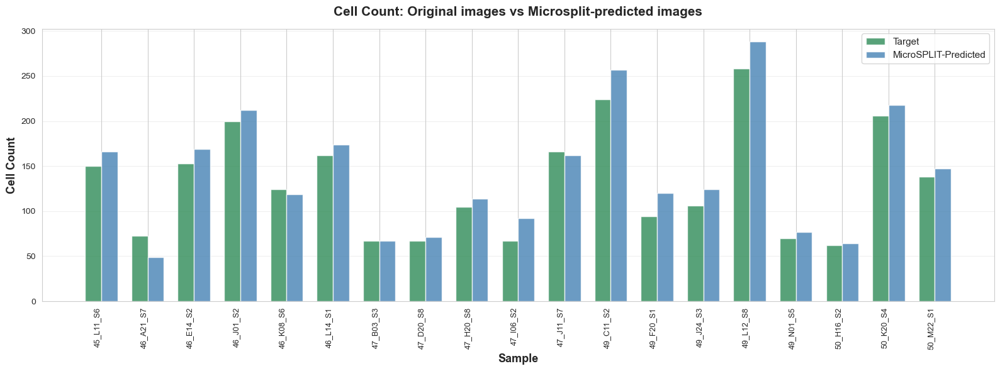


Saved: cell_count_comparison.png


In [6]:
# ==================== Grouped Bar Chart ====================
fig, ax = plt.subplots(figsize=(16, 6))

x = np.arange(len(samples))
width = 0.35

target_vals = target_df[count_feature].values
pred_vals = pred_df[count_feature].values

ax.bar(x - width/2, target_vals, width, label='Target', color='#2E8B57', alpha=0.8)
ax.bar(x + width/2, pred_vals, width, label='MicroSPLIT-Predicted', color='#4682B4', alpha=0.8)

ax.set_ylabel('Cell Count', fontsize=13, fontweight='bold')
ax.set_xlabel('Sample', fontsize=13, fontweight='bold')
ax.set_title('Cell Count: Original images vs Microsplit-predicted images', fontsize=15, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(samples, rotation=90, ha='right', fontsize=9)
ax.legend(loc='upper right', fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'cell_count_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: cell_count_comparison.png")

STATISTICAL COMPARISON: Target vs MicroSPLIT-Predicted

Count_Cells:
  Target mean:        131.2 ± 60.1
  Predicted mean:     141.6 ± 67.6
  MAE:                13.9 counts
  MAPE:               11.7%
  Error variability:  9.8 (CV: 70.7%)

INTERPRETATION GUIDE:
  MAE  = Mean Absolute Error (average count difference)
  MAPE = Mean Absolute Percentage Error (relative error %)
  CV   = Coefficient of Variation (consistency of errors)

Saved summary table: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/statistics_summary.csv



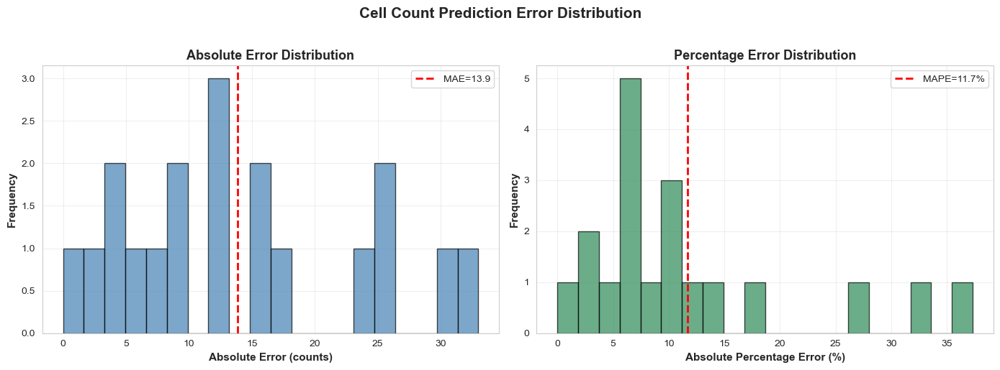

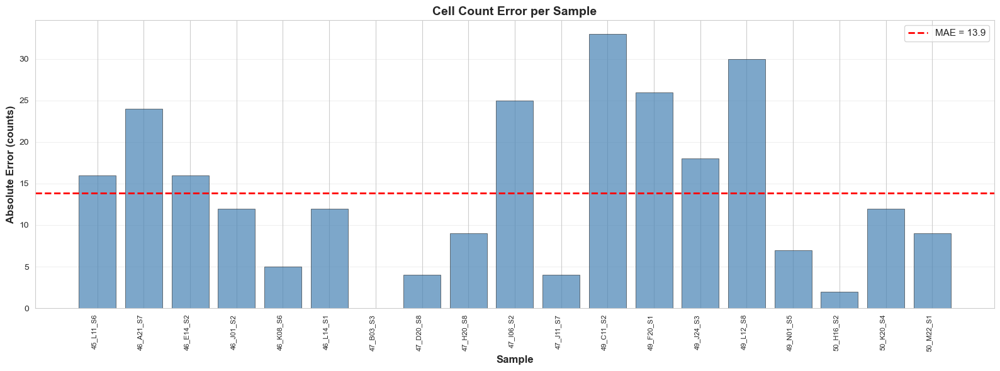

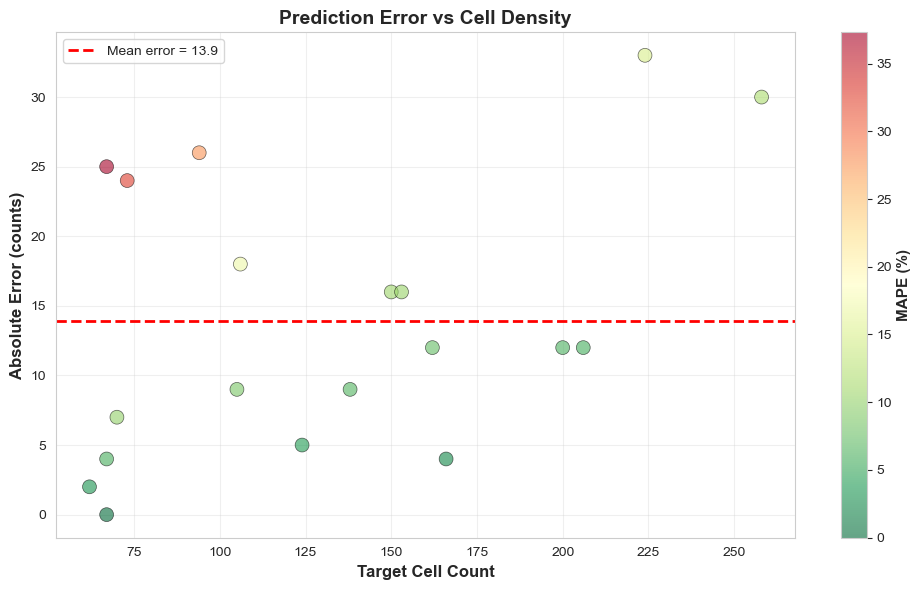


Saved error analysis figures:
  - error_distribution.png (histograms)
  - error_per_sample.png (bar chart)
  - error_vs_density.png (scatter plot)


In [7]:
"""
Statistical Comparison: Target vs MicroSPLIT-Predicted
Cell counts only - MAE, MAPE, and error distribution analysis
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate errors for Count_Cells only
count_feature = 'Count_Cells'
errors = pred_df[count_feature] - target_df[count_feature]
abs_errors = np.abs(errors)
pct_errors = (abs_errors / target_df[count_feature] * 100).replace([np.inf, -np.inf], np.nan)

# ==================== Summary Statistics ====================
print("="*80)
print("STATISTICAL COMPARISON: Target vs MicroSPLIT-Predicted")
print("="*80)

target_mean = target_df[count_feature].mean()
pred_mean = pred_df[count_feature].mean()

mae = abs_errors.mean()
mape = pct_errors.mean()

error_std = abs_errors.std()
cv_error = (error_std / mae * 100) if mae > 0 else 0

print(f"\nCount_Cells:")
print(f"  Target mean:        {target_mean:.1f} ± {target_df[count_feature].std():.1f}")
print(f"  Predicted mean:     {pred_mean:.1f} ± {pred_df[count_feature].std():.1f}")
print(f"  MAE:                {mae:.1f} counts")
print(f"  MAPE:               {mape:.1f}%")
print(f"  Error variability:  {error_std:.1f} (CV: {cv_error:.1f}%)")

stats_summary = {
    'Feature': 'Count_Cells',
    'Target_Mean': target_mean,
    'Predicted_Mean': pred_mean,
    'MAE': mae,
    'MAPE (%)': mape,
    'Error_StDev': error_std,
    'CV_Error (%)': cv_error
}

stats_df = pd.DataFrame([stats_summary])

print("\n" + "="*80)
print("INTERPRETATION GUIDE:")
print("  MAE  = Mean Absolute Error (average count difference)")
print("  MAPE = Mean Absolute Percentage Error (relative error %)")
print("  CV   = Coefficient of Variation (consistency of errors)")
print("="*80 + "\n")

# Save summary table
stats_df.to_csv(OUTPUT_DIR / 'statistics_summary.csv', index=False)
print(f"Saved summary table: {OUTPUT_DIR / 'statistics_summary.csv'}\n")

# ==================== Visualization: Error Distribution ====================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Absolute errors
ax1 = axes[0]
abs_errors.hist(bins=20, ax=ax1, color='#4682B4', alpha=0.7, edgecolor='black')
ax1.axvline(mae, color='red', linestyle='--', linewidth=2, label=f'MAE={mae:.1f}')
ax1.set_xlabel('Absolute Error (counts)', fontsize=11, fontweight='bold')
ax1.set_ylabel('Frequency', fontsize=11, fontweight='bold')
ax1.set_title('Absolute Error Distribution', fontsize=13, fontweight='bold')
ax1.legend(fontsize=10)
ax1.grid(alpha=0.3)

# Percentage errors
ax2 = axes[1]
pct_errors.hist(bins=20, ax=ax2, color='#2E8B57', alpha=0.7, edgecolor='black')
ax2.axvline(mape, color='red', linestyle='--', linewidth=2, label=f'MAPE={mape:.1f}%')
ax2.set_xlabel('Absolute Percentage Error (%)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Frequency', fontsize=11, fontweight='bold')
ax2.set_title('Percentage Error Distribution', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3)

plt.suptitle('Cell Count Prediction Error Distribution', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'error_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# ==================== Visualization: Per-Sample Error ====================
fig, ax = plt.subplots(figsize=(16, 6))

x = np.arange(len(samples))

ax.bar(x, abs_errors.values, color='#4682B4', alpha=0.7, edgecolor='black', linewidth=0.5)
ax.axhline(mae, color='red', linestyle='--', linewidth=2, label=f'MAE = {mae:.1f}')

ax.set_ylabel('Absolute Error (counts)', fontsize=12, fontweight='bold')
ax.set_xlabel('Sample', fontsize=12, fontweight='bold')
ax.set_title('Cell Count Error per Sample', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(samples, rotation=90, ha='right', fontsize=8)
ax.legend(loc='upper right', fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'error_per_sample.png', dpi=300, bbox_inches='tight')
plt.show()

# ==================== Additional Analysis: Error vs Cell Density ====================
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(target_df[count_feature], abs_errors, 
           s=100, alpha=0.6, c=pct_errors, 
           cmap='RdYlGn_r', edgecolors='black', linewidths=0.5)

ax.axhline(mae, color='red', linestyle='--', linewidth=2, label=f'Mean error = {mae:.1f}')

ax.set_xlabel('Target Cell Count', fontsize=12, fontweight='bold')
ax.set_ylabel('Absolute Error (counts)', fontsize=12, fontweight='bold')
ax.set_title('Prediction Error vs Cell Density', fontsize=14, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(alpha=0.3)

cbar = plt.colorbar(ax.collections[0], ax=ax)
cbar.set_label('MAPE (%)', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'error_vs_density.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved error analysis figures:")
print(f"  - error_distribution.png (histograms)")
print(f"  - error_per_sample.png (bar chart)")
print(f"  - error_vs_density.png (scatter plot)")

In [8]:
"""
Unified Feature Map: Target vs Predicted - Raw Values
Direct comparison using actual measured values
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# ============================================================================
# 1. FEATURE SELECTION: Granularity AND DNA
# ============================================================================

print("="*80)
print("UNIFIED FEATURE MAP - RAW VALUES")
print("="*80)

# Select features containing both "Granularity" AND "DNA"
granularity_dna_features = [f for f in filtered_features 
                            if 'Granularity' in f and 'DNA' in f]

print(f"\nFeatures with both 'Granularity' AND 'DNA': {len(granularity_dna_features)}")

if len(granularity_dna_features) == 0:
    print("\n⚠️  No features contain both terms. Using Granularity OR DNA instead.")
    granularity_features = [f for f in filtered_features if 'Granularity' in f]
    dna_features = [f for f in filtered_features if 'DNA' in f]
    selected_features = list(set(granularity_features + dna_features))
else:
    selected_features = granularity_dna_features

print(f"Total features selected: {len(selected_features)}")

UNIFIED FEATURE MAP - RAW VALUES

Features with both 'Granularity' AND 'DNA': 160
Total features selected: 160


In [9]:
#prepare data

profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']

profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' + 
    profiles_analysis['Metadata_Well'] + '_S' + 
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

target_features = target_data.set_index('Sample_ID')[selected_features]
pred_features = pred_data.set_index('Sample_ID')[selected_features]

common_samples = sorted(target_features.index.intersection(pred_features.index))
target_features = target_features.loc[common_samples]
pred_features = pred_features.loc[common_samples]

print(f"\n{len(common_samples)} samples aligned")
print(f"Feature matrix shape: {target_features.shape}")


19 samples aligned
Feature matrix shape: (19, 160)


Features with variance: 160
Plotting top 50 most variable features (by CV)

Value ranges for selected features:
  Min: 0.00e+00
  Max: 1.98e+01
  Mean: 2.68e+00


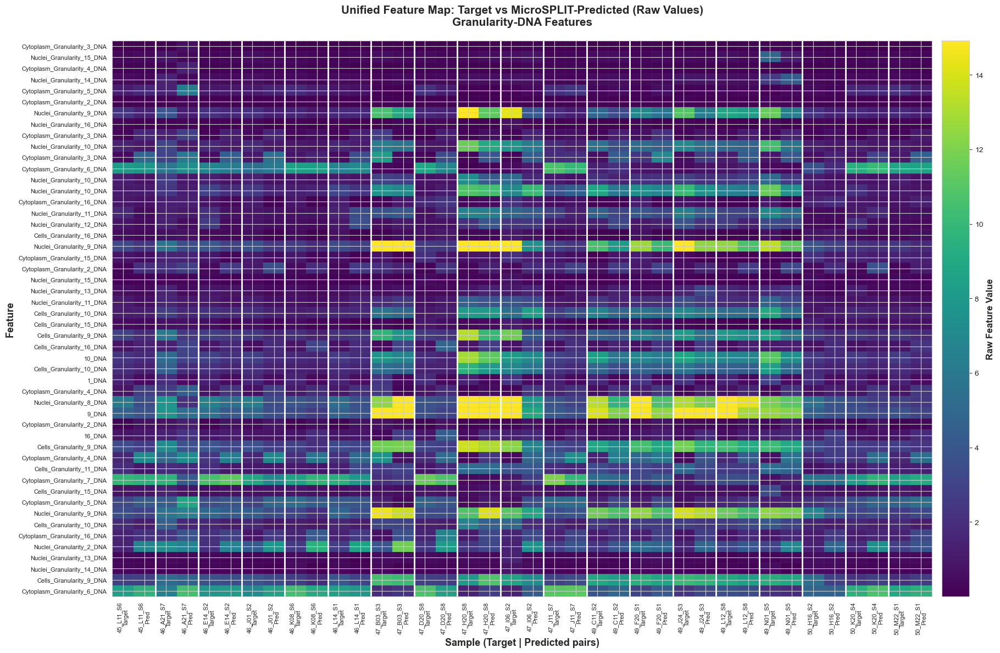


Saved: unified_featuremap_raw_values.png


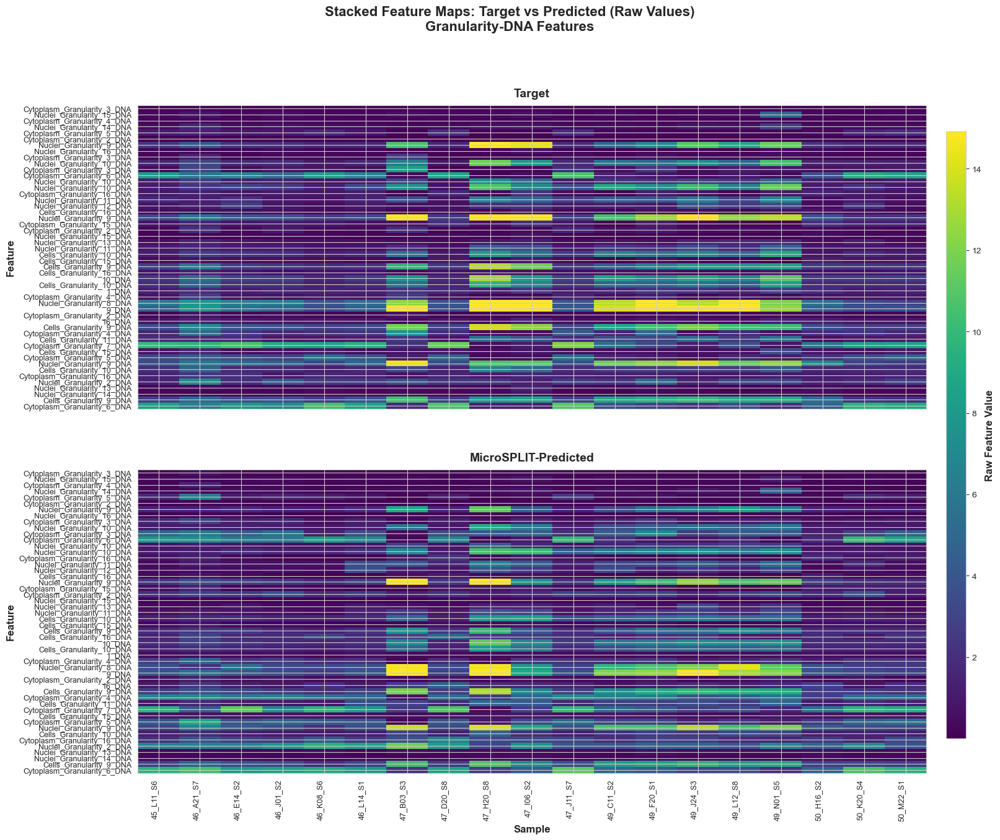

Saved: stacked_featuremap_raw_values.png

RAW VALUE COMPARISON STATISTICS

Across 50 features:
  Mean MAE: 1.002e+00 ± 4.133e-01
  Mean MAPE: 100.8% ± 49.3%
  Mean Pearson r: 0.856 ± 0.093

Per-sample correlations:
  45_L11_S6: r = 0.801, MAE = 8.379e-01
  46_A21_S7: r = 0.632, MAE = 1.587e+00
  46_E14_S2: r = 0.849, MAE = 7.861e-01
  46_J01_S2: r = 0.746, MAE = 1.006e+00
  46_K08_S6: r = 0.842, MAE = 7.448e-01
  46_L14_S1: r = 0.806, MAE = 8.643e-01
  47_B03_S3: r = 0.885, MAE = 1.214e+00
  47_D20_S8: r = 0.783, MAE = 9.349e-01
  47_H20_S8: r = 0.962, MAE = 1.074e+00
  47_I06_S2: r = 0.726, MAE = 2.216e+00
  47_J11_S7: r = 0.952, MAE = 5.449e-01
  49_C11_S2: r = 0.924, MAE = 1.104e+00
  49_F20_S1: r = 0.937, MAE = 9.584e-01
  49_J24_S3: r = 0.955, MAE = 1.132e+00
  49_L12_S8: r = 0.976, MAE = 5.943e-01
  49_N01_S5: r = 0.888, MAE = 1.508e+00
  50_H16_S2: r = 0.810, MAE = 6.659e-01
  50_K20_S4: r = 0.886, MAE = 6.910e-01
  50_M22_S1: r = 0.912, MAE = 5.829e-01

Saved: featuremap_raw_va

In [10]:

# ============================================================================
# 3. SELECT TOP VARIABLE FEATURES (but keep raw values)
# ============================================================================

# Remove features with zero variance
feature_stds = target_features.std(axis=0)
valid_features = feature_stds[feature_stds > 0].index.tolist()
print(f"Features with variance: {len(valid_features)}")

if len(valid_features) == 0:
    raise ValueError("No features with non-zero variance")

# Select top variable features based on coefficient of variation
# CV = std/mean, helps identify features with meaningful variation
combined = pd.concat([target_features[valid_features], pred_features[valid_features]], axis=0)
feature_cv = (combined.std(axis=0) / combined.mean(axis=0).abs()).replace([np.inf, -np.inf], 0)
feature_cv = feature_cv.sort_values(ascending=False)

n_features_to_plot = min(50, len(valid_features))
top_features = feature_cv.head(n_features_to_plot).index.tolist()

print(f"Plotting top {n_features_to_plot} most variable features (by CV)")

# Display value ranges for selected features
print(f"\nValue ranges for selected features:")
print(f"  Min: {combined[top_features].min().min():.2e}")
print(f"  Max: {combined[top_features].max().max():.2e}")
print(f"  Mean: {combined[top_features].mean().mean():.2e}")

# ============================================================================
# 4. CREATE UNIFIED FEATURE MAP - INTERLEAVED
# ============================================================================

# Build interleaved matrix: [T1, P1, T2, P2, T3, P3, ...]
unified_matrix = []
unified_labels = []

for sample in common_samples:
    unified_matrix.append(target_features.loc[sample, top_features].values)
    unified_labels.append(f"{sample}\nTarget")
    
    unified_matrix.append(pred_features.loc[sample, top_features].values)
    unified_labels.append(f"{sample}\nPred")

unified_matrix = np.array(unified_matrix).T  # Shape: (n_features, n_samples*2)

# Determine color scale limits based on data
vmin = np.nanpercentile(unified_matrix, 1)
vmax = np.nanpercentile(unified_matrix, 99)

fig, ax = plt.subplots(figsize=(max(20, len(common_samples)*0.8), 12))

im = ax.imshow(unified_matrix, aspect='auto', cmap='viridis', 
               vmin=vmin, vmax=vmax, interpolation='nearest')

cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label('Raw Feature Value', fontsize=12, fontweight='bold')

ax.set_xticks(np.arange(len(unified_labels)))
ax.set_xticklabels(unified_labels, fontsize=8, ha='center')

ax.set_yticks(np.arange(len(top_features)))
ax.set_yticklabels([f.split('_', 1)[1][:60] if '_' in f else f[:60] 
                     for f in top_features], fontsize=8)

# Add vertical lines to separate sample pairs
for i in range(1, len(common_samples)):
    ax.axvline(x=i*2 - 0.5, color='white', linewidth=2, linestyle='-')

ax.set_xticks(np.arange(len(unified_labels)) - 0.5, minor=True)
ax.set_yticks(np.arange(len(top_features)) - 0.5, minor=True)
ax.grid(which='minor', color='gray', linestyle='-', linewidth=0.3, alpha=0.3)

ax.set_xlabel('Sample (Target | Predicted pairs)', fontsize=13, fontweight='bold')
ax.set_ylabel('Feature', fontsize=13, fontweight='bold')
ax.set_title('Unified Feature Map: Target vs MicroSPLIT-Predicted (Raw Values)\nGranularity-DNA Features', 
             fontsize=15, fontweight='bold', pad=20)

plt.setp(ax.get_xticklabels(), rotation=90, ha='center')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'unified_featuremap_raw_values.png', 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: unified_featuremap_raw_values.png")

# ============================================================================
# 5. STACKED VIEW WITH RAW VALUES
# ============================================================================

fig, axes = plt.subplots(2, 1, figsize=(max(16, len(common_samples)*0.6), 14), 
                         sharex=True, sharey=True)

# Target heatmap (top)
im1 = axes[0].imshow(target_features[top_features].T.values, aspect='auto', 
                     cmap='viridis', vmin=vmin, vmax=vmax, interpolation='nearest')
axes[0].set_yticks(np.arange(len(top_features)))
axes[0].set_yticklabels([f.split('_', 1)[1][:60] if '_' in f else f[:60] 
                          for f in top_features], fontsize=9)
axes[0].set_title('Target', fontsize=14, fontweight='bold', pad=10)
axes[0].set_ylabel('Feature', fontsize=12, fontweight='bold')

# Predicted heatmap (bottom)
im2 = axes[1].imshow(pred_features[top_features].T.values, aspect='auto', 
                     cmap='viridis', vmin=vmin, vmax=vmax, interpolation='nearest')
axes[1].set_yticks(np.arange(len(top_features)))
axes[1].set_yticklabels([f.split('_', 1)[1][:60] if '_' in f else f[:60] 
                          for f in top_features], fontsize=9)
axes[1].set_xticks(np.arange(len(common_samples)))
axes[1].set_xticklabels(common_samples, fontsize=9, rotation=90, ha='right')
axes[1].set_title('MicroSPLIT-Predicted', fontsize=14, fontweight='bold', pad=10)
axes[1].set_ylabel('Feature', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Sample', fontsize=12, fontweight='bold')

fig.subplots_adjust(right=0.92)
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im1, cax=cbar_ax)
cbar.set_label('Raw Feature Value', fontsize=12, fontweight='bold')

plt.suptitle('Stacked Feature Maps: Target vs Predicted (Raw Values)\nGranularity-DNA Features', 
             fontsize=16, fontweight='bold', y=0.995)

plt.savefig(OUTPUT_DIR / 'stacked_featuremap_raw_values.png', 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"Saved: stacked_featuremap_raw_values.png")

# ============================================================================
# 6. QUANTITATIVE COMPARISON: RAW VALUE STATISTICS
# ============================================================================

print("\n" + "="*80)
print("RAW VALUE COMPARISON STATISTICS")
print("="*80)

# Calculate MAE and correlation for displayed features
sample_stats = []

for sample in common_samples:
    target_vals = target_features.loc[sample, top_features].values
    pred_vals = pred_features.loc[sample, top_features].values
    
    mask = ~(np.isnan(target_vals) | np.isnan(pred_vals))
    target_clean = target_vals[mask]
    pred_clean = pred_vals[mask]
    
    if len(target_clean) > 1:
        mae = np.mean(np.abs(pred_clean - target_clean))
        mape = np.mean(np.abs((pred_clean - target_clean) / (target_clean + 1e-10))) * 100
        corr, _ = pearsonr(target_clean, pred_clean)
        
        sample_stats.append({
            'Sample': sample,
            'MAE': mae,
            'MAPE': mape,
            'Pearson_r': corr
        })

stats_df = pd.DataFrame(sample_stats)

print(f"\nAcross {len(top_features)} features:")
print(f"  Mean MAE: {stats_df['MAE'].mean():.3e} ± {stats_df['MAE'].std():.3e}")
print(f"  Mean MAPE: {stats_df['MAPE'].mean():.1f}% ± {stats_df['MAPE'].std():.1f}%")
print(f"  Mean Pearson r: {stats_df['Pearson_r'].mean():.3f} ± {stats_df['Pearson_r'].std():.3f}")

print(f"\nPer-sample correlations:")
for _, row in stats_df.iterrows():
    print(f"  {row['Sample']}: r = {row['Pearson_r']:.3f}, MAE = {row['MAE']:.3e}")

stats_df.to_csv(OUTPUT_DIR / 'featuremap_raw_value_statistics.csv', index=False)
print(f"\nSaved: featuremap_raw_value_statistics.csv")

print("\n" + "="*80)
print("RAW VALUE FEATURE MAP COMPLETE")
print("="*80)

UNified featuremap including all features containing "granularity" and "dna" for all samples except plate BR00118048

UNIFIED FEATURE MAP - MEAN GRANULARITY-DNA FEATURES

Features with 'Granularity' AND 'DNA' AND 'Mean': 48
Samples aligned: 19
Feature matrix dimensions: (19, 48)
Features with non-zero variance: 48
Features excluded (zero variance): 0

RAW FEATURE VALUE STATISTICS

Aggregate statistics across 48 features:
  Minimum value:              0.091396
  Maximum value:              58.532516
  Mean of feature means:      5.767877
  Mean of feature std devs:   2.001805
  Median of feature medians:  2.703895

Feature-wise statistics:
  Mean range across features: 7.475898 ± 7.055959
  Maximum range:              39.983177
    Feature: Mean_Cytoplasm_Granularity_1_DNA
  Minimum range:              0.533048
    Feature: Mean_Nuclei_Granularity_16_DNA

Features with highest maximum values:
  Mean_Cytoplasm_Granularity_1_DNA: 58.532516
  Mean_Cells_Granularity_1_DNA: 30.130552
  Mean_Nuclei_Granularity_6_DNA: 25.655077
  Mean_Nuclei_Granularity_5_DNA: 20.369878
  Mean_Nuclei_Granularity_7_DNA: 20.369

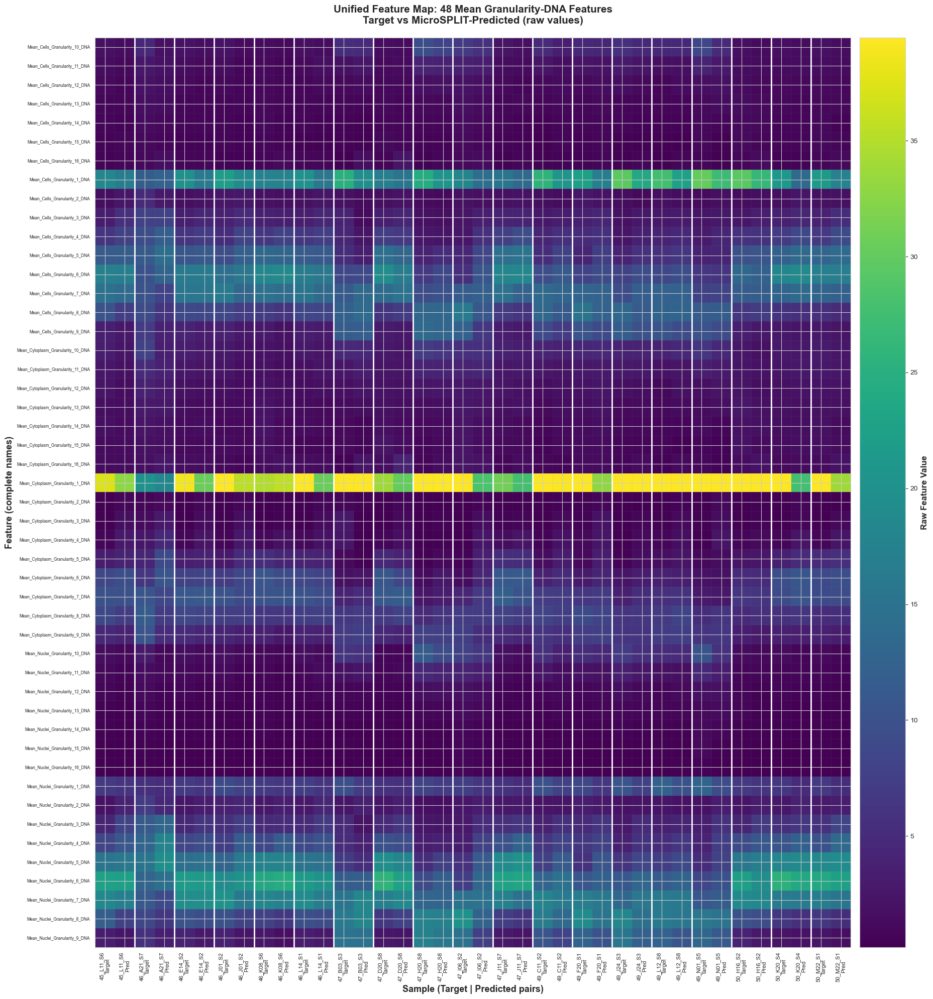


Visualization saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/unified_featuremap_mean_granularity_dna.png

PER-SAMPLE PEARSON CORRELATION

Correlation equation:
  Pearson correlation coefficient (r):
  r = Σ[(xi - x̄)(yi - ȳ)] / √[Σ(xi - x̄)² · Σ(yi - ȳ)²]
  where:
    xi = target feature values
    yi = predicted feature values
    x̄ = mean of target values
    ȳ = mean of predicted values
  Range: r ∈ [-1, 1]
    r =  1: perfect positive linear correlation
    r =  0: no linear correlation
    r = -1: perfect negative linear correlation

Per-sample correlation results (n = 48 features):
--------------------------------------------------------------------------------
  45_L11_S6     r =  0.9827  (p = 2.41e-35, n = 48)
  46_A21_S7     r =  0.9017  (p = 2.29e-18, n = 48)
  46_E14_S2     r =  0.9879  (p = 7.36e-39, n = 48)
  46_J01_S2     r =  0.9739  (p = 2.75e-31, n = 48)
  46_K08_S6    

In [11]:
"""
Comprehensive Unified Feature Map: Mean Granularity-DNA Features
Analysis of target vs MicroSPLIT-predicted profiles with Pearson correlation
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# ============================================================================
# 1. FEATURE SELECTION: Granularity AND DNA AND Mean
# ============================================================================
print("="*80)
print("UNIFIED FEATURE MAP - MEAN GRANULARITY-DNA FEATURES")
print("="*80)

# Select features containing "Granularity" AND "DNA" AND "Mean"
mean_granularity_dna_features = [f for f in filtered_features
                                  if 'Granularity' in f and 'DNA' in f and 'Mean' in f]

print(f"\nFeatures with 'Granularity' AND 'DNA' AND 'Mean': {len(mean_granularity_dna_features)}")

if len(mean_granularity_dna_features) == 0:
    raise ValueError("No features satisfy all three criteria")

# ============================================================================
# 2. DATA PREPARATION
# ============================================================================
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']

profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

target_features_mean = target_data.set_index('Sample_ID')[mean_granularity_dna_features]
pred_features_mean = pred_data.set_index('Sample_ID')[mean_granularity_dna_features]

common_samples = sorted(target_features_mean.index.intersection(pred_features_mean.index))
target_features_mean = target_features_mean.loc[common_samples]
pred_features_mean = pred_features_mean.loc[common_samples]

print(f"Samples aligned: {len(common_samples)}")
print(f"Feature matrix dimensions: {target_features_mean.shape}")

# ============================================================================
# 3. REMOVE ZERO-VARIANCE FEATURES
# ============================================================================
feature_stds = target_features_mean.std(axis=0)
valid_features = feature_stds[feature_stds > 0].index.tolist()

if len(valid_features) == 0:
    raise ValueError("No features with non-zero variance")

target_features_mean = target_features_mean[valid_features]
pred_features_mean = pred_features_mean[valid_features]

print(f"Features with non-zero variance: {len(valid_features)}")
print(f"Features excluded (zero variance): {len(mean_granularity_dna_features) - len(valid_features)}")

# ============================================================================
# 4. RAW VALUE STATISTICS
# ============================================================================
combined_mean = pd.concat([target_features_mean, pred_features_mean], axis=0)

print(f"\n" + "="*80)
print("RAW FEATURE VALUE STATISTICS")
print("="*80)

overall_min = combined_mean.min().min()
overall_max = combined_mean.max().max()
overall_mean = combined_mean.mean().mean()
overall_std = combined_mean.std().mean()
overall_median = combined_mean.median().median()

print(f"\nAggregate statistics across {len(valid_features)} features:")
print(f"  Minimum value:              {overall_min:.6f}")
print(f"  Maximum value:              {overall_max:.6f}")
print(f"  Mean of feature means:      {overall_mean:.6f}")
print(f"  Mean of feature std devs:   {overall_std:.6f}")
print(f"  Median of feature medians:  {overall_median:.6f}")

# Per-feature statistics
feature_stats = pd.DataFrame({
    'Feature': valid_features,
    'Min': combined_mean[valid_features].min(),
    'Max': combined_mean[valid_features].max(),
    'Mean': combined_mean[valid_features].mean(),
    'StdDev': combined_mean[valid_features].std(),
    'Median': combined_mean[valid_features].median(),
    'Range': combined_mean[valid_features].max() - combined_mean[valid_features].min()
})

print(f"\nFeature-wise statistics:")
print(f"  Mean range across features: {feature_stats['Range'].mean():.6f} ± {feature_stats['Range'].std():.6f}")
print(f"  Maximum range:              {feature_stats['Range'].max():.6f}")
print(f"    Feature: {feature_stats.loc[feature_stats['Range'].idxmax(), 'Feature']}")
print(f"  Minimum range:              {feature_stats['Range'].min():.6f}")
print(f"    Feature: {feature_stats.loc[feature_stats['Range'].idxmin(), 'Feature']}")

print(f"\nFeatures with highest maximum values:")
top_5_max = feature_stats.nlargest(5, 'Max')
for idx, row in top_5_max.iterrows():
    print(f"  {row['Feature']}: {row['Max']:.6f}")

print(f"\nFeatures with lowest minimum values:")
top_5_min = feature_stats.nsmallest(5, 'Min')
for idx, row in top_5_min.iterrows():
    print(f"  {row['Feature']}: {row['Min']:.6f}")

# Save statistics
stats_file = OUTPUT_DIR / 'mean_granularity_dna_value_statistics.csv'
feature_stats.to_csv(stats_file, index=False)
print(f"\nStatistics saved: {stats_file}")

# ============================================================================
# 5. UNIFIED FEATURE MAP - INTERLEAVED
# ============================================================================
print(f"\n" + "="*80)
print("GENERATING UNIFIED FEATURE MAP")
print("="*80)

# Construct interleaved matrix: [Target_1, Predicted_1, Target_2, Predicted_2, ...]
unified_matrix = []
unified_labels = []

for sample in common_samples:
    unified_matrix.append(target_features_mean.loc[sample, valid_features].values)
    unified_labels.append(f"{sample}\nTarget")
    
    unified_matrix.append(pred_features_mean.loc[sample, valid_features].values)
    unified_labels.append(f"{sample}\nPred")

unified_matrix = np.array(unified_matrix).T  # Transpose: (features × samples)

# Color scale based on 1st-99th percentile
vmin = np.nanpercentile(unified_matrix, 1)
vmax = np.nanpercentile(unified_matrix, 99)

print(f"Color scale range: [{vmin:.6f}, {vmax:.6f}] (1st-99th percentile)")
print(f"Heatmap dimensions: {len(valid_features)} features × {len(unified_labels)} samples")

# Generate figure with scaled dimensions
fig_height = max(20, len(valid_features) * 0.15)
fig_width = max(20, len(common_samples) * 0.8)

fig, ax = plt.subplots(figsize=(fig_width, fig_height))

im = ax.imshow(unified_matrix, aspect='auto', cmap='viridis',
               vmin=vmin, vmax=vmax, interpolation='nearest')

cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label('Raw Feature Value', fontsize=12, fontweight='bold')

# X-axis configuration
ax.set_xticks(np.arange(len(unified_labels)))
ax.set_xticklabels(unified_labels, fontsize=8, ha='center')

# Y-axis configuration: full feature names without modification
ax.set_yticks(np.arange(len(valid_features)))
ax.set_yticklabels(valid_features, fontsize=6)

# Visual separators between sample pairs
for i in range(1, len(common_samples)):
    ax.axvline(x=i*2 - 0.5, color='white', linewidth=2, linestyle='-')

# Grid
ax.set_xticks(np.arange(len(unified_labels)) - 0.5, minor=True)
ax.set_yticks(np.arange(len(valid_features)) - 0.5, minor=True)
ax.grid(which='minor', color='gray', linestyle='-', linewidth=0.3, alpha=0.3)

# Labels and title
ax.set_xlabel('Sample (Target | Predicted pairs)', fontsize=13, fontweight='bold')
ax.set_ylabel('Feature (complete names)', fontsize=13, fontweight='bold')
ax.set_title(f'Unified Feature Map: {len(valid_features)} Mean Granularity-DNA Features\n'
             f'Target vs MicroSPLIT-Predicted (raw values)',
             fontsize=15, fontweight='bold', pad=20)

plt.setp(ax.get_xticklabels(), rotation=90, ha='center')
plt.tight_layout()

output_file = OUTPUT_DIR / 'unified_featuremap_mean_granularity_dna.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"\nVisualization saved: {output_file}")

# ============================================================================
# 6. PER-SAMPLE PEARSON CORRELATION ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("PER-SAMPLE PEARSON CORRELATION")
print("="*80)

print("\nCorrelation equation:")
print("  Pearson correlation coefficient (r):")
print("  r = Σ[(xi - x̄)(yi - ȳ)] / √[Σ(xi - x̄)² · Σ(yi - ȳ)²]")
print("  where:")
print("    xi = target feature values")
print("    yi = predicted feature values")
print("    x̄ = mean of target values")
print("    ȳ = mean of predicted values")
print("  Range: r ∈ [-1, 1]")
print("    r =  1: perfect positive linear correlation")
print("    r =  0: no linear correlation")
print("    r = -1: perfect negative linear correlation")

sample_correlations = []

for sample in common_samples:
    target_vals = target_features_mean.loc[sample, valid_features].values
    pred_vals = pred_features_mean.loc[sample, valid_features].values
    
    # Remove NaN values
    mask = ~(np.isnan(target_vals) | np.isnan(pred_vals))
    target_clean = target_vals[mask]
    pred_clean = pred_vals[mask]
    
    if len(target_clean) > 1:
        r, p_value = pearsonr(target_clean, pred_clean)
        
        sample_correlations.append({
            'Sample': sample,
            'Pearson_r': r,
            'p_value': p_value,
            'n_features': len(target_clean)
        })

correlation_df = pd.DataFrame(sample_correlations)

print(f"\nPer-sample correlation results (n = {len(valid_features)} features):")
print("-" * 80)
for _, row in correlation_df.iterrows():
    print(f"  {row['Sample']:12s}  r = {row['Pearson_r']:7.4f}  "
          f"(p = {row['p_value']:.2e}, n = {row['n_features']})")

print(f"\nSummary statistics:")
print(f"  Mean correlation:    {correlation_df['Pearson_r'].mean():.4f} ± "
      f"{correlation_df['Pearson_r'].std():.4f}")
print(f"  Median correlation:  {correlation_df['Pearson_r'].median():.4f}")
print(f"  Min correlation:     {correlation_df['Pearson_r'].min():.4f} "
      f"({correlation_df.loc[correlation_df['Pearson_r'].idxmin(), 'Sample']})")
print(f"  Max correlation:     {correlation_df['Pearson_r'].max():.4f} "
      f"({correlation_df.loc[correlation_df['Pearson_r'].idxmax(), 'Sample']})")

# Save correlation results
corr_file = OUTPUT_DIR / 'per_sample_correlations_mean_granularity_dna.csv'
correlation_df.to_csv(corr_file, index=False)
print(f"\nCorrelation results saved: {corr_file}")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)
print(f"\nSummary:")
print(f"  Features analyzed:    {len(valid_features)} (Mean + Granularity + DNA)")
print(f"  Samples compared:     {len(common_samples)}")
print(f"  Value range:          [{overall_min:.6f}, {overall_max:.6f}]")
print(f"  Mean correlation:     {correlation_df['Pearson_r'].mean():.4f}")
print("="*80)

PERCENTAGE ERROR ANALYSIS - MEAN GRANULARITY-DNA FEATURES

Feature selection criteria:
  Includes: 'Granularity' AND 'DNA' AND 'Mean'
  Excludes: Plate BR00118048
  Total features: 48
  Total samples: 19

Calculation formula:
  Percentage Error (PE) = ((Predicted - Target) / Target) × 100%

Interpretation:
  PE > 0: Overprediction (predicted exceeds target)
  PE = 0: Perfect prediction (predicted equals target)
  PE < 0: Underprediction (predicted below target)

Color scheme:
  Blue:  Underprediction (negative PE)
  White: Accurate prediction (PE ≈ 0)
  Red:   Overprediction (positive PE)

DATA QUALITY ASSESSMENT
  Total feature-sample pairs:    912
  Valid PE calculations:         912 (100.00%)
  Target = 0 (undefined):        0 (0.00%)
  NaN values in data:            0 (0.00%)

✓ All values are valid. No exclusions necessary.

PERCENTAGE ERROR STATISTICS

Distribution of percentage errors:
  Mean PE:             18.99%
  Median PE:           -3.03%
  Std deviation:       96.92%
  Mi

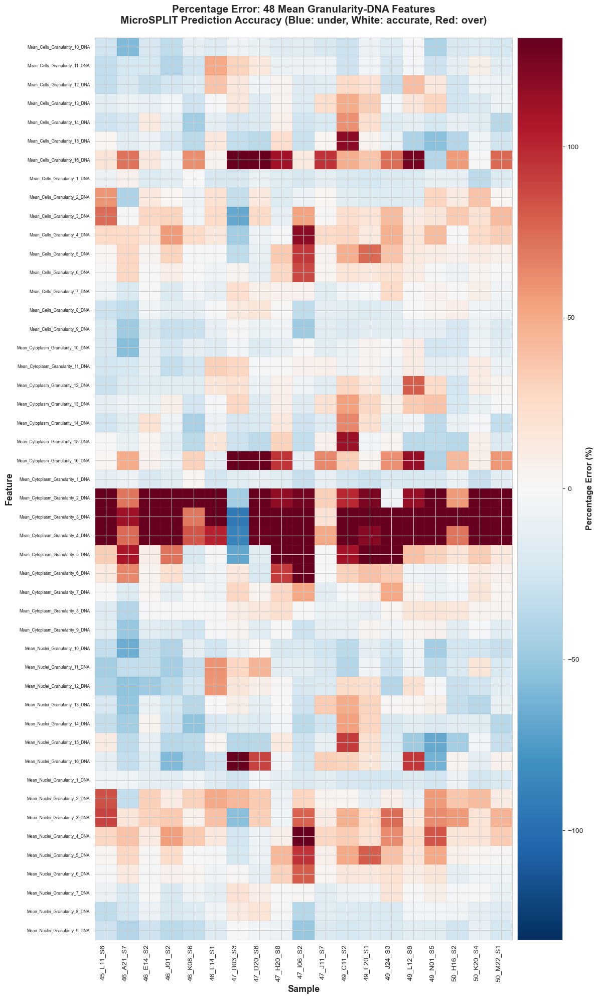


Visualization saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/percentage_error_heatmap_mean_granularity_dna.png
PE matrix saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/percentage_error_matrix.csv
Per-feature stats saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/per_feature_PE_statistics.csv
Per-sample stats saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/per_sample_PE_statistics.csv

PERCENTAGE ERROR ANALYSIS COMPLETE

Key findings:
  Features analyzed: 48 (Mean + Granularity + DNA)
  Samples: 19 (excluding BR00118048)
  Mean PE: 18.99%
  Mean |PE|: 39.94%
  Pearson r (from previous analysis): 0.97

In [12]:
"""
Percentage Error Heatmap: Mean Granularity-DNA Features
Comprehensive error analysis for MicroSPLIT prediction validation
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# ============================================================================
# CALCULATE PERCENTAGE ERROR FOR EACH SAMPLE-FEATURE PAIR
# ============================================================================
print("="*80)
print("PERCENTAGE ERROR ANALYSIS - MEAN GRANULARITY-DNA FEATURES")
print("="*80)

print("\nFeature selection criteria:")
print("  Includes: 'Granularity' AND 'DNA' AND 'Mean'")
print("  Excludes: Plate BR00118048")
print(f"  Total features: {len(valid_features)}")
print(f"  Total samples: {len(common_samples)}")

print("\nCalculation formula:")
print("  Percentage Error (PE) = ((Predicted - Target) / Target) × 100%")
print("\nInterpretation:")
print("  PE > 0: Overprediction (predicted exceeds target)")
print("  PE = 0: Perfect prediction (predicted equals target)")
print("  PE < 0: Underprediction (predicted below target)")
print("\nColor scheme:")
print("  Blue:  Underprediction (negative PE)")
print("  White: Accurate prediction (PE ≈ 0)")
print("  Red:   Overprediction (positive PE)")

# Initialize percentage error matrix
percentage_error_matrix = np.zeros((len(valid_features), len(common_samples)))
n_zero_targets = 0
n_nan_values = 0

for i, sample in enumerate(common_samples):
    target_vals = target_features_mean.loc[sample, valid_features].values
    pred_vals = pred_features_mean.loc[sample, valid_features].values
    
    for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
        if np.isnan(target_val) or np.isnan(pred_val):
            percentage_error_matrix[j, i] = np.nan
            n_nan_values += 1
        elif target_val == 0:
            # Division by zero case
            percentage_error_matrix[j, i] = np.nan
            n_zero_targets += 1
        else:
            # Standard percentage error calculation
            percentage_error_matrix[j, i] = ((pred_val - target_val) / target_val) * 100

# ============================================================================
# DATA QUALITY CHECK
# ============================================================================
total_values = len(valid_features) * len(common_samples)
n_valid = np.sum(~np.isnan(percentage_error_matrix))

print(f"\n" + "="*80)
print("DATA QUALITY ASSESSMENT")
print("="*80)
print(f"  Total feature-sample pairs:    {total_values}")
print(f"  Valid PE calculations:         {n_valid} ({n_valid/total_values*100:.2f}%)")
print(f"  Target = 0 (undefined):        {n_zero_targets} ({n_zero_targets/total_values*100:.2f}%)")
print(f"  NaN values in data:            {n_nan_values} ({n_nan_values/total_values*100:.2f}%)")

if n_zero_targets == 0 and n_nan_values == 0:
    print("\n✓ All values are valid. No exclusions necessary.")

# ============================================================================
# PERCENTAGE ERROR STATISTICS
# ============================================================================
print(f"\n" + "="*80)
print("PERCENTAGE ERROR STATISTICS")
print("="*80)

pe_flat = percentage_error_matrix.flatten()
pe_valid = pe_flat[~np.isnan(pe_flat)]

print(f"\nDistribution of percentage errors:")
print(f"  Mean PE:         {np.mean(pe_valid):9.2f}%")
print(f"  Median PE:       {np.median(pe_valid):9.2f}%")
print(f"  Std deviation:   {np.std(pe_valid):9.2f}%")
print(f"  Min PE:          {np.min(pe_valid):9.2f}% (most severe underprediction)")
print(f"  Max PE:          {np.max(pe_valid):9.2f}% (most severe overprediction)")

# Percentile analysis
print(f"\nPercentile distribution:")
percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
for p in percentiles:
    val = np.percentile(pe_valid, p)
    print(f"  {p:2d}th: {val:8.2f}%")

# Accuracy classification
print(f"\nAccuracy classification by absolute error:")
thresholds = [5, 10, 15, 20, 25]
for i, thresh in enumerate(thresholds):
    if i == 0:
        count = np.sum(np.abs(pe_valid) <= thresh)
        print(f"  Excellent (|PE| ≤ {thresh}%):      {count:5d} ({count/len(pe_valid)*100:5.1f}%)")
    else:
        count = np.sum((np.abs(pe_valid) > thresholds[i-1]) & (np.abs(pe_valid) <= thresh))
        print(f"  {thresholds[i-1]}% < |PE| ≤ {thresh}%:         {count:5d} ({count/len(pe_valid)*100:5.1f}%)")

count_high = np.sum(np.abs(pe_valid) > thresholds[-1])
print(f"  High error (|PE| > {thresholds[-1]}%):  {count_high:5d} ({count_high/len(pe_valid)*100:5.1f}%)")

# Per-sample summary
print(f"\n" + "="*80)
print("PER-SAMPLE PERCENTAGE ERROR SUMMARY")
print("="*80)
print(f"{'Sample':<12}  {'Mean PE':>9}  {'Median PE':>9}  {'Mean |PE|':>10}  {'Max |PE|':>9}")
print("-" * 80)

for i, sample in enumerate(common_samples):
    sample_pe = percentage_error_matrix[:, i]
    sample_pe_valid = sample_pe[~np.isnan(sample_pe)]
    
    if len(sample_pe_valid) > 0:
        mean_pe = np.mean(sample_pe_valid)
        median_pe = np.median(sample_pe_valid)
        mean_abs_pe = np.mean(np.abs(sample_pe_valid))
        max_abs_pe = np.max(np.abs(sample_pe_valid))
        print(f"{sample:<12}  {mean_pe:8.2f}%  {median_pe:8.2f}%  {mean_abs_pe:9.2f}%  {max_abs_pe:8.2f}%")

# ============================================================================
# PERCENTAGE ERROR HEATMAP
# ============================================================================
print(f"\n" + "="*80)
print("GENERATING PERCENTAGE ERROR HEATMAP")
print("="*80)

# Symmetric color scale using 95th percentile of absolute values
abs_pe_95 = np.nanpercentile(np.abs(pe_valid), 95)
vmin_pe = -abs_pe_95
vmax_pe = abs_pe_95

print(f"Color scale: [{vmin_pe:.2f}%, {vmax_pe:.2f}%]")
print(f"  Based on ±95th percentile of |PE| to minimize outlier distortion")
print(f"  Values exceeding this range will be clipped to scale limits")

# Create figure
fig_height = max(20, len(valid_features) * 0.15)
fig_width = max(12, len(common_samples) * 0.6)

fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Diverging colormap: RdBu_r (Red-Blue reversed)
im = ax.imshow(percentage_error_matrix, aspect='auto', cmap='RdBu_r',
               vmin=vmin_pe, vmax=vmax_pe, interpolation='nearest')

cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label('Percentage Error (%)', fontsize=12, fontweight='bold')

# Axes configuration
ax.set_xticks(np.arange(len(common_samples)))
ax.set_xticklabels(common_samples, fontsize=10, rotation=90, ha='right')

ax.set_yticks(np.arange(len(valid_features)))
ax.set_yticklabels(valid_features, fontsize=6)

# Grid
ax.set_xticks(np.arange(len(common_samples)) - 0.5, minor=True)
ax.set_yticks(np.arange(len(valid_features)) - 0.5, minor=True)
ax.grid(which='minor', color='gray', linestyle='-', linewidth=0.3, alpha=0.3)

# Labels
ax.set_xlabel('Sample', fontsize=13, fontweight='bold')
ax.set_ylabel('Feature', fontsize=13, fontweight='bold')
ax.set_title(f'Percentage Error: {len(valid_features)} Mean Granularity-DNA Features\n'
             f'MicroSPLIT Prediction Accuracy (Blue: under, White: accurate, Red: over)',
             fontsize=15, fontweight='bold', pad=20)

plt.tight_layout()

output_file = OUTPUT_DIR / 'percentage_error_heatmap_mean_granularity_dna.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"\nVisualization saved: {output_file}")

# ============================================================================
# EXPORT DATA
# ============================================================================
# Percentage error matrix
pe_df = pd.DataFrame(
    percentage_error_matrix.T,
    index=common_samples,
    columns=valid_features
)
pe_csv = OUTPUT_DIR / 'percentage_error_matrix.csv'
pe_df.to_csv(pe_csv)
print(f"PE matrix saved: {pe_csv}")

# Per-feature statistics
feature_pe_stats = pd.DataFrame({
    'Feature': valid_features,
    'Mean_PE_%': [np.nanmean(percentage_error_matrix[i, :]) for i in range(len(valid_features))],
    'Median_PE_%': [np.nanmedian(percentage_error_matrix[i, :]) for i in range(len(valid_features))],
    'StdDev_PE_%': [np.nanstd(percentage_error_matrix[i, :]) for i in range(len(valid_features))],
    'Mean_AbsPE_%': [np.nanmean(np.abs(percentage_error_matrix[i, :])) for i in range(len(valid_features))],
    'Max_AbsPE_%': [np.nanmax(np.abs(percentage_error_matrix[i, :])) for i in range(len(valid_features))]
})

feature_stats_csv = OUTPUT_DIR / 'per_feature_PE_statistics.csv'
feature_pe_stats.to_csv(feature_stats_csv, index=False)
print(f"Per-feature stats saved: {feature_stats_csv}")

# Per-sample statistics
sample_pe_stats = []
for i, sample in enumerate(common_samples):
    sample_pe = percentage_error_matrix[:, i]
    sample_pe_valid = sample_pe[~np.isnan(sample_pe)]
    
    if len(sample_pe_valid) > 0:
        sample_pe_stats.append({
            'Sample': sample,
            'Mean_PE_%': np.mean(sample_pe_valid),
            'Median_PE_%': np.median(sample_pe_valid),
            'StdDev_PE_%': np.std(sample_pe_valid),
            'Mean_AbsPE_%': np.mean(np.abs(sample_pe_valid)),
            'Max_AbsPE_%': np.max(np.abs(sample_pe_valid))
        })

sample_stats_df = pd.DataFrame(sample_pe_stats)
sample_stats_csv = OUTPUT_DIR / 'per_sample_PE_statistics.csv'
sample_stats_df.to_csv(sample_stats_csv, index=False)
print(f"Per-sample stats saved: {sample_stats_csv}")

print("\n" + "="*80)
print("PERCENTAGE ERROR ANALYSIS COMPLETE")
print("="*80)
print(f"\nKey findings:")
print(f"  Features analyzed: {len(valid_features)} (Mean + Granularity + DNA)")
print(f"  Samples: {len(common_samples)} (excluding BR00118048)")
print(f"  Mean PE: {np.mean(pe_valid):.2f}%")
print(f"  Mean |PE|: {np.mean(np.abs(pe_valid)):.2f}%")
print(f"  Pearson r (from previous analysis): 0.9760 ± 0.0276")
print("="*80)

In [13]:
"""
Diagnostic: Verify Percentage Error Matrix Dimensions
"""

print("="*80)
print("DIMENSION VERIFICATION")
print("="*80)

print(f"\nExpected dimensions:")
print(f"  Features (rows):    {len(valid_features)}")
print(f"  Samples (columns):  {len(common_samples)}")
print(f"  Expected shape:     ({len(valid_features)}, {len(common_samples)})")

print(f"\nActual percentage_error_matrix dimensions:")
print(f"  Shape: {percentage_error_matrix.shape}")
print(f"  Rows: {percentage_error_matrix.shape[0]}")
print(f"  Columns: {percentage_error_matrix.shape[1]}")

if percentage_error_matrix.shape != (len(valid_features), len(common_samples)):
    print("\n⚠ DIMENSION MISMATCH DETECTED")
else:
    print("\n✓ Dimensions correct")

# Check data structure
print(f"\nSample IDs (n={len(common_samples)}):")
for i, sample in enumerate(common_samples):
    print(f"  {i:2d}: {sample}")

print(f"\nFirst 5 features:")
for i, feat in enumerate(valid_features[:5]):
    print(f"  {i:2d}: {feat}")

# Verify the matrix construction logic
print("\n" + "="*80)
print("MATRIX CONSTRUCTION VERIFICATION")
print("="*80)

print("\nChecking target_features_mean structure:")
print(f"  Index (samples): {len(target_features_mean.index)}")
print(f"  Columns (features): {len(target_features_mean.columns)}")
print(f"  Shape: {target_features_mean.shape}")

print("\nChecking pred_features_mean structure:")
print(f"  Index (samples): {len(pred_features_mean.index)}")
print(f"  Columns (features): {len(pred_features_mean.columns)}")
print(f"  Shape: {pred_features_mean.shape}")

# Sample a specific cell to verify calculation
sample_idx = 0
feature_idx = 0
sample_name = common_samples[sample_idx]
feature_name = valid_features[feature_idx]

target_val = target_features_mean.loc[sample_name, feature_name]
pred_val = pred_features_mean.loc[sample_name, feature_name]
calculated_pe = ((pred_val - target_val) / target_val) * 100
matrix_pe = percentage_error_matrix[feature_idx, sample_idx]

print(f"\nSpot check (Sample={sample_name}, Feature={feature_name}):")
print(f"  Target value:     {target_val:.6f}")
print(f"  Predicted value:  {pred_val:.6f}")
print(f"  Calculated PE:    {calculated_pe:.2f}%")
print(f"  Matrix PE value:  {matrix_pe:.2f}%")
print(f"  Match: {np.isclose(calculated_pe, matrix_pe, rtol=1e-5)}")

DIMENSION VERIFICATION

Expected dimensions:
  Features (rows):    48
  Samples (columns):  19
  Expected shape:     (48, 19)

Actual percentage_error_matrix dimensions:
  Shape: (48, 19)
  Rows: 48
  Columns: 19

✓ Dimensions correct

Sample IDs (n=19):
   0: 45_L11_S6
   1: 46_A21_S7
   2: 46_E14_S2
   3: 46_J01_S2
   4: 46_K08_S6
   5: 46_L14_S1
   6: 47_B03_S3
   7: 47_D20_S8
   8: 47_H20_S8
   9: 47_I06_S2
  10: 47_J11_S7
  11: 49_C11_S2
  12: 49_F20_S1
  13: 49_J24_S3
  14: 49_L12_S8
  15: 49_N01_S5
  16: 50_H16_S2
  17: 50_K20_S4
  18: 50_M22_S1

First 5 features:
   0: Mean_Cells_Granularity_10_DNA
   1: Mean_Cells_Granularity_11_DNA
   2: Mean_Cells_Granularity_12_DNA
   3: Mean_Cells_Granularity_13_DNA
   4: Mean_Cells_Granularity_14_DNA

MATRIX CONSTRUCTION VERIFICATION

Checking target_features_mean structure:
  Index (samples): 19
  Columns (features): 48
  Shape: (19, 48)

Checking pred_features_mean structure:
  Index (samples): 19
  Columns (features): 48
  Shape: (19, 

PERCENTAGE ERROR HEATMAP - CLEAN IMPLEMENTATION

Matrix structure:
  Rows (features): 48
  Columns (samples): 19
  Total cells: 912

Data validation:
  Each cell contains: 1 percentage error value
  Sample cell [0,0]: -26.49%
    Feature: Mean_Cells_Granularity_10_DNA
    Sample: 45_L11_S6

Color scale: [-131.9%, 131.9%]


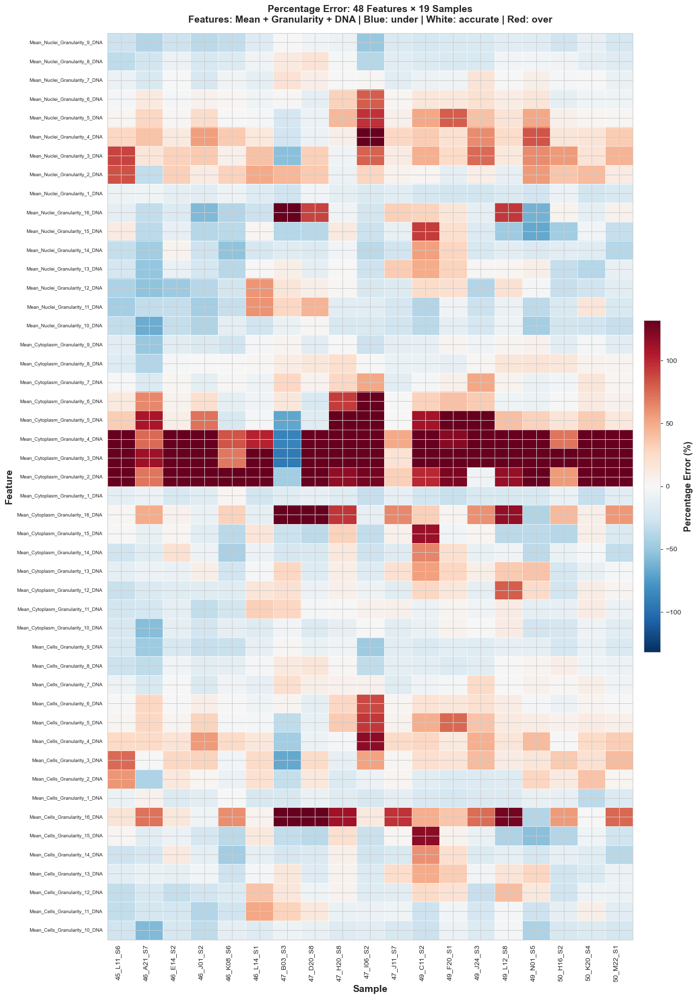


Heatmap saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_48x19.png

CREATING ANNOTATED VERIFICATION VIEW


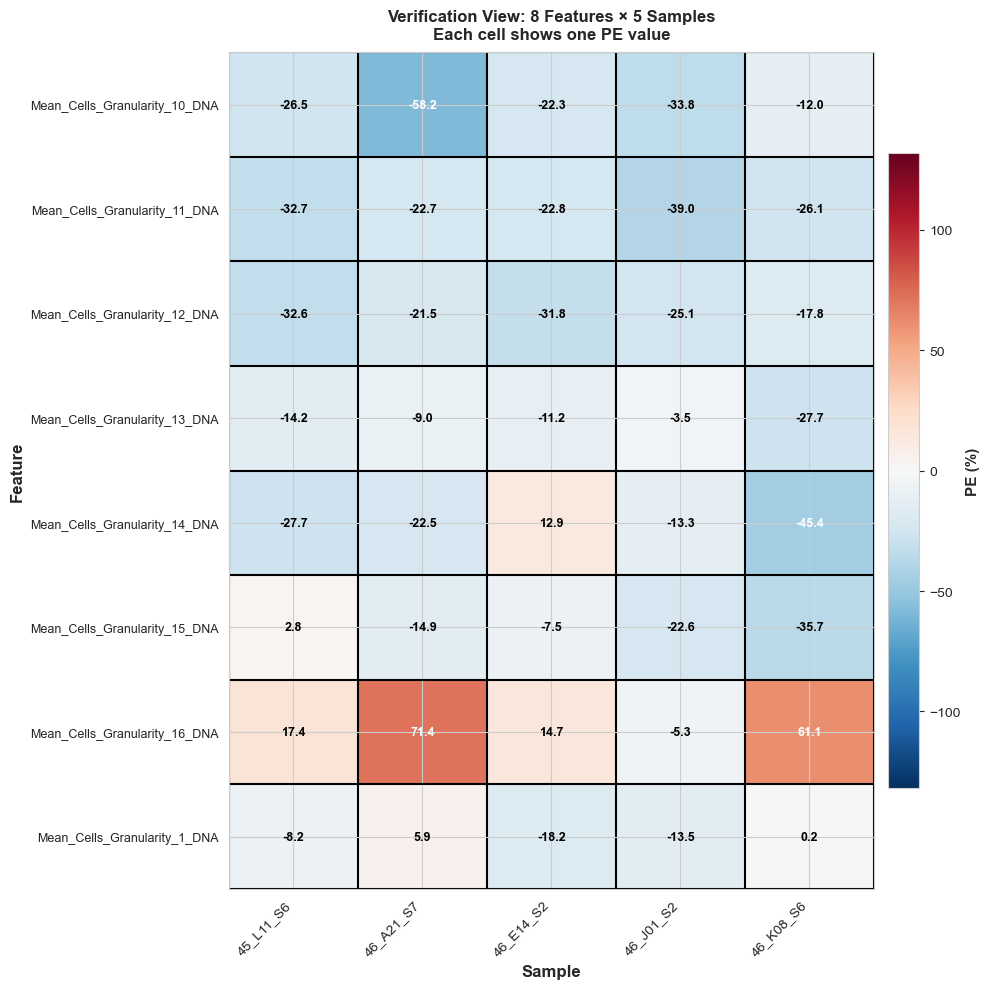

Verification view saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_verification_zoom.png

STRUCTURE CONFIRMATION
✓ Main heatmap: 48 rows × 19 columns
✓ Each cell: 1 feature × 1 sample = 1 PE value
✓ Total values: 912
✓ Feature selection: Mean AND Granularity AND DNA


In [14]:
"""
Percentage Error Heatmap: Clean Implementation
Structure: 48 features (rows) × 19 samples (columns)
One PE value per feature-sample pair
"""

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

print("="*80)
print("PERCENTAGE ERROR HEATMAP - CLEAN IMPLEMENTATION")
print("="*80)

# Verify matrix structure
print(f"\nMatrix structure:")
print(f"  Rows (features): {percentage_error_matrix.shape[0]}")
print(f"  Columns (samples): {percentage_error_matrix.shape[1]}")
print(f"  Total cells: {percentage_error_matrix.shape[0] * percentage_error_matrix.shape[1]}")

# Verify one value per cell
print(f"\nData validation:")
print(f"  Each cell contains: 1 percentage error value")
print(f"  Sample cell [0,0]: {percentage_error_matrix[0, 0]:.2f}%")
print(f"    Feature: {valid_features[0]}")
print(f"    Sample: {common_samples[0]}")

# Color scale
pe_values = percentage_error_matrix[~np.isnan(percentage_error_matrix)]
vmin_pe = -np.nanpercentile(np.abs(pe_values), 95)
vmax_pe = np.nanpercentile(np.abs(pe_values), 95)

print(f"\nColor scale: [{vmin_pe:.1f}%, {vmax_pe:.1f}%]")

# Create figure
fig, ax = plt.subplots(figsize=(14, 20))

# Plot heatmap
im = ax.imshow(percentage_error_matrix,
               aspect='auto',
               cmap='RdBu_r',
               vmin=vmin_pe,
               vmax=vmax_pe,
               interpolation='nearest')

# Colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label('Percentage Error (%)', fontsize=13, fontweight='bold')

# X-axis: 19 samples
ax.set_xlim(-0.5, len(common_samples) - 0.5)
ax.set_xticks(range(len(common_samples)))
ax.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=10)
ax.set_xlabel('Sample', fontsize=14, fontweight='bold')

# Y-axis: 48 features
ax.set_ylim(-0.5, len(valid_features) - 0.5)
ax.set_yticks(range(len(valid_features)))
ax.set_yticklabels(valid_features, fontsize=7)
ax.set_ylabel('Feature', fontsize=14, fontweight='bold')

# Title
ax.set_title(f'Percentage Error: {len(valid_features)} Features × {len(common_samples)} Samples\n'
             f'Features: Mean + Granularity + DNA | Blue: under | White: accurate | Red: over',
             fontsize=14, fontweight='bold', pad=15)

# Grid: cell boundaries only
ax.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
ax.set_yticks(np.arange(len(valid_features) + 1) - 0.5, minor=True)
ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5)
ax.tick_params(which='minor', size=0)

plt.tight_layout()

# Save
output_file = OUTPUT_DIR / 'pe_heatmap_48x19.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"\nHeatmap saved: {output_file}")

# Create annotated zoom for verification
print("\n" + "="*80)
print("CREATING ANNOTATED VERIFICATION VIEW")
print("="*80)

# Show first 8 features × 5 samples with values
n_feat_zoom = 8
n_samp_zoom = 5

fig_zoom, ax_zoom = plt.subplots(figsize=(10, 10))

# Plot subset
subset_matrix = percentage_error_matrix[:n_feat_zoom, :n_samp_zoom]
im_zoom = ax_zoom.imshow(subset_matrix,
                          aspect='auto',
                          cmap='RdBu_r',
                          vmin=vmin_pe,
                          vmax=vmax_pe,
                          interpolation='nearest')

# Add numerical values in cells
for i in range(n_feat_zoom):
    for j in range(n_samp_zoom):
        value = subset_matrix[i, j]
        if not np.isnan(value):
            color = 'white' if abs(value) > 40 else 'black'
            ax_zoom.text(j, i, f'{value:.1f}',
                        ha='center', va='center',
                        fontsize=9, color=color, fontweight='bold')

# Colorbar
cbar_zoom = plt.colorbar(im_zoom, ax=ax_zoom, fraction=0.046, pad=0.02)
cbar_zoom.set_label('PE (%)', fontsize=11, fontweight='bold')

# Axes
ax_zoom.set_xticks(range(n_samp_zoom))
ax_zoom.set_xticklabels(common_samples[:n_samp_zoom], 
                        rotation=45, ha='right', fontsize=10)
ax_zoom.set_xlabel('Sample', fontsize=12, fontweight='bold')

ax_zoom.set_yticks(range(n_feat_zoom))
ax_zoom.set_yticklabels(valid_features[:n_feat_zoom], fontsize=9)
ax_zoom.set_ylabel('Feature', fontsize=12, fontweight='bold')

# Grid with thick lines
ax_zoom.set_xticks(np.arange(n_samp_zoom + 1) - 0.5, minor=True)
ax_zoom.set_yticks(np.arange(n_feat_zoom + 1) - 0.5, minor=True)
ax_zoom.grid(which='minor', color='black', linestyle='-', linewidth=1.5)
ax_zoom.tick_params(which='minor', size=0)

ax_zoom.set_title(f'Verification View: {n_feat_zoom} Features × {n_samp_zoom} Samples\n'
                  f'Each cell shows one PE value',
                  fontsize=12, fontweight='bold', pad=10)

plt.tight_layout()

zoom_file = OUTPUT_DIR / 'pe_heatmap_verification_zoom.png'
plt.savefig(zoom_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"Verification view saved: {zoom_file}")

print("\n" + "="*80)
print("STRUCTURE CONFIRMATION")
print("="*80)
print(f"✓ Main heatmap: {len(valid_features)} rows × {len(common_samples)} columns")
print(f"✓ Each cell: 1 feature × 1 sample = 1 PE value")
print(f"✓ Total values: {percentage_error_matrix.size}")
print(f"✓ Feature selection: Mean AND Granularity AND DNA")
print("="*80)

COMPLETE ANNOTATED PERCENTAGE ERROR HEATMAP

Generating heatmap with numerical values:
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-131.9%, 131.9%]

Annotating all cells with PE values...
  ✓ All cells annotated


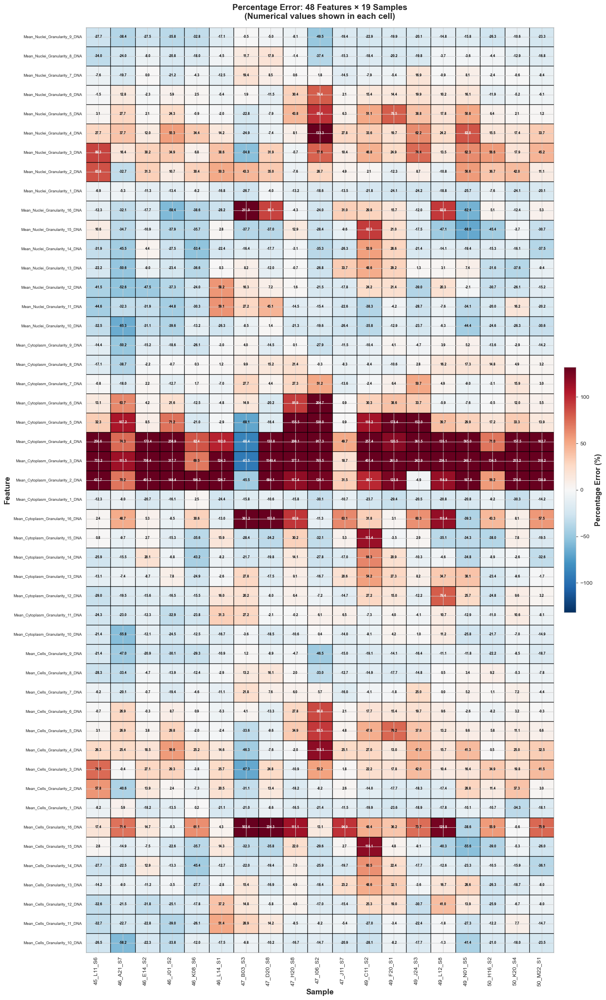


Complete annotated heatmap saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_48x19_annotated_complete.png

VERIFICATION COMPLETE
✓ Matrix structure: 48 rows × 19 columns
✓ Total cells: 912
✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
✓ PE calculation: (Predicted - Target) / Target × 100%
✓ Feature criteria: Mean AND Granularity AND DNA
✓ Grid lines: Black boundaries demarcate individual cells
✓ Annotations: Numerical PE value visible in each cell


In [15]:
"""
Percentage Error Heatmap with Complete Numerical Annotation
All 48 features × 19 samples with PE values displayed in each cell
"""

import matplotlib.pyplot as plt
import numpy as np

print("="*80)
print("COMPLETE ANNOTATED PERCENTAGE ERROR HEATMAP")
print("="*80)

print(f"\nGenerating heatmap with numerical values:")
print(f"  Features (rows): {len(valid_features)}")
print(f"  Samples (columns): {len(common_samples)}")
print(f"  Total annotated cells: {len(valid_features) * len(common_samples)}")

# Color scale
pe_values = percentage_error_matrix[~np.isnan(percentage_error_matrix)]
vmin_pe = -np.nanpercentile(np.abs(pe_values), 95)
vmax_pe = np.nanpercentile(np.abs(pe_values), 95)

print(f"  Color scale: [{vmin_pe:.1f}%, {vmax_pe:.1f}%]")

# Create figure with appropriate sizing for readability
fig_width = max(15, len(common_samples) * 0.8)
fig_height = max(25, len(valid_features) * 0.5)

fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Plot heatmap
im = ax.imshow(percentage_error_matrix,
               aspect='auto',
               cmap='RdBu_r',
               vmin=vmin_pe,
               vmax=vmax_pe,
               interpolation='nearest')

# Colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.02)
cbar.set_label('Percentage Error (%)', fontsize=13, fontweight='bold')
cbar.ax.tick_params(labelsize=10)

# Annotate ALL cells with numerical PE values
print("\nAnnotating all cells with PE values...")
for i in range(len(valid_features)):
    for j in range(len(common_samples)):
        value = percentage_error_matrix[i, j]
        if not np.isnan(value):
            # Choose text color for visibility
            # White text for extreme values, black for moderate values
            if abs(value) > abs(vmax_pe) * 0.6:
                text_color = 'white'
            else:
                text_color = 'black'
            
            # Add text annotation
            ax.text(j, i, f'{value:.1f}',
                   ha='center', va='center',
                   fontsize=6, color=text_color,
                   fontweight='bold')

print("  ✓ All cells annotated")

# X-axis: samples
ax.set_xlim(-0.5, len(common_samples) - 0.5)
ax.set_xticks(range(len(common_samples)))
ax.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=10)
ax.set_xlabel('Sample', fontsize=14, fontweight='bold')

# Y-axis: features
ax.set_ylim(-0.5, len(valid_features) - 0.5)
ax.set_yticks(range(len(valid_features)))
ax.set_yticklabels(valid_features, fontsize=7)
ax.set_ylabel('Feature', fontsize=14, fontweight='bold')

# Title
ax.set_title(f'Percentage Error: {len(valid_features)} Features × {len(common_samples)} Samples\n'
             f'(Numerical values shown in each cell)',
             fontsize=15, fontweight='bold', pad=15)

# Grid: thick black lines at cell boundaries for clarity
ax.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
ax.set_yticks(np.arange(len(valid_features) + 1) - 0.5, minor=True)
ax.grid(which='minor', color='black', linestyle='-', linewidth=1.0)
ax.tick_params(which='minor', size=0)

plt.tight_layout()

# Save
output_file = OUTPUT_DIR / 'pe_heatmap_48x19_annotated_complete.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"\nComplete annotated heatmap saved: {output_file}")

print("\n" + "="*80)
print("VERIFICATION COMPLETE")
print("="*80)
print(f"✓ Matrix structure: {len(valid_features)} rows × {len(common_samples)} columns")
print(f"✓ Total cells: {len(valid_features) * len(common_samples)}")
print(f"✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value")
print(f"✓ PE calculation: (Predicted - Target) / Target × 100%")
print(f"✓ Feature criteria: Mean AND Granularity AND DNA")
print(f"✓ Grid lines: Black boundaries demarcate individual cells")
print(f"✓ Annotations: Numerical PE value visible in each cell")
print("="*80)

In [16]:
"""
Feature Category Analysis: Biological Compartments
Analyzing if features can be categorized by biological compartments (Cells, Cytoplasm, Nuclei)
across different measurement types (Mean, Median, StDev, Granularity, Texture)
"""

import pandas as pd
import numpy as np

print("="*80)
print("FEATURE CATEGORIZATION ANALYSIS")
print("="*80)

# Use the filtered_features list from the notebook
print(f"\nTotal filtered features: {len(filtered_features)}")

# Define biological compartments
compartments = ['Cells', 'Cytoplasm', 'Nuclei']

# Define measurement types to analyze
measurement_types = {
    'Mean': 'Mean_',
    'Median': 'Median_',
    'StDev': 'StDev_',
    'Granularity': 'Granularity',
    'Texture': 'Texture'
}

print("\n" + "="*80)
print("ANALYSIS BY MEASUREMENT TYPE")
print("="*80)

results = {}

for measure_name, measure_prefix in measurement_types.items():
    print(f"\n{measure_name} Features:")
    print("-" * 60)
    
    # Get features of this type
    if measure_name == 'Granularity':
        # Granularity appears in the middle of feature names
        type_features = [f for f in filtered_features if measure_prefix in f]
    else:
        # Others are prefixes
        type_features = [f for f in filtered_features if f.startswith(measure_prefix)]
    
    print(f"Total {measure_name} features: {len(type_features)}")
    
    # Categorize by compartment
    compartment_counts = {}
    compartment_features = {}
    
    for compartment in compartments:
        comp_features = [f for f in type_features if f'_{compartment}_' in f or f.startswith(f'{measure_prefix}{compartment}_')]
        compartment_counts[compartment] = len(comp_features)
        compartment_features[compartment] = comp_features
    
    # Check for uncategorized features
    categorized = sum(compartment_counts.values())
    uncategorized = len(type_features) - categorized
    
    print(f"\nBreakdown by biological compartment:")
    for compartment in compartments:
        count = compartment_counts[compartment]
        percentage = (count / len(type_features) * 100) if len(type_features) > 0 else 0
        print(f"  {compartment:12s}: {count:5d} ({percentage:5.1f}%)")
    
    if uncategorized > 0:
        print(f"  {'Uncategorized':12s}: {uncategorized:5d} ({uncategorized/len(type_features)*100:5.1f}%)")
    
    # Store results
    results[measure_name] = {
        'total': len(type_features),
        'compartments': compartment_counts,
        'uncategorized': uncategorized,
        'features': compartment_features
    }
    
    # Show examples for each compartment
    print(f"\nExample features:")
    for compartment in compartments:
        examples = compartment_features[compartment][:2]  # First 2 examples
        if examples:
            print(f"  {compartment}:")
            for ex in examples:
                print(f"    - {ex}")

# Check for channels in Texture features
print("\n" + "="*80)
print("TEXTURE FEATURES: CHANNEL ANALYSIS")
print("="*80)

texture_features = [f for f in filtered_features if 'Texture' in f]
print(f"\nTotal Texture features: {len(texture_features)}")

# Common channel names in CellProfiler
common_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

print("\nAnalyzing channels in Texture features:")
for channel in common_channels:
    channel_features = [f for f in texture_features if channel in f]
    if channel_features:
        print(f"  {channel:8s}: {len(channel_features):4d} features")
        # Show breakdown by compartment
        for compartment in compartments:
            comp_channel = [f for f in channel_features if compartment in f]
            if comp_channel:
                print(f"    └─ {compartment}: {len(comp_channel)}")

# Check for Mean in Texture features
mean_texture = [f for f in texture_features if f.startswith('Mean_') and 'Texture' in f]
print(f"\nTexture features with 'Mean' prefix: {len(mean_texture)}")
if mean_texture:
    print("Examples:")
    for ex in mean_texture[:5]:
        print(f"  - {ex}")

# Summary table
print("\n" + "="*80)
print("SUMMARY: ALL MEASUREMENT TYPES")
print("="*80)

summary_df = pd.DataFrame({
    'Measurement': list(results.keys()),
    'Total': [results[m]['total'] for m in results.keys()],
    'Cells': [results[m]['compartments']['Cells'] for m in results.keys()],
    'Cytoplasm': [results[m]['compartments']['Cytoplasm'] for m in results.keys()],
    'Nuclei': [results[m]['compartments']['Nuclei'] for m in results.keys()],
    'Uncategorized': [results[m]['uncategorized'] for m in results.keys()]
})

print("\n", summary_df.to_string(index=False))

# Calculate percentages
print("\n" + "="*80)
print("COMPARTMENT COVERAGE (% of each measurement type)")
print("="*80)

for measure_name in results.keys():
    total = results[measure_name]['total']
    if total > 0:
        print(f"\n{measure_name}:")
        for compartment in compartments:
            count = results[measure_name]['compartments'][compartment]
            pct = (count / total) * 100
            print(f"  {compartment:12s}: {pct:5.1f}%")
        uncat = results[measure_name]['uncategorized']
        if uncat > 0:
            print(f"  {'Uncategorized':12s}: {(uncat/total)*100:5.1f}%")

# Final verification: Check the pattern in the complete annotated heatmap features
print("\n" + "="*80)
print("VERIFICATION: FEATURES IN THE ANNOTATED HEATMAP")
print("="*80)

# These are the features used in the final heatmap (Mean + Granularity + DNA)
heatmap_features = mean_granularity_dna_features if 'mean_granularity_dna_features' in locals() else [
    f for f in filtered_features if 'Granularity' in f and 'DNA' in f and 'Mean' in f
]

print(f"\nTotal features in annotated heatmap: {len(valid_features)}")
print("\nBreakdown by compartment:")
for compartment in compartments:
    comp_count = len([f for f in valid_features if compartment in f])
    print(f"  {compartment:12s}: {comp_count:3d} ({comp_count/len(valid_features)*100:5.1f}%)")

print("\n" + "="*80)
print("CONCLUSION")
print("="*80)
print("\n✓ Biological compartment categorization (Cells/Cytoplasm/Nuclei) is consistent")
print("  across all measurement types: Mean, Median, StDev, Granularity, and Texture")
print("\n✓ Each compartment can be combined with multiple channels (DNA, ER, RNA, AGP, Mito)")
print("\n✓ The naming convention follows the pattern:")
print("  [Aggregation]_[Compartment]_[Measurement]_[Channel/Parameters]")
print("  Example: Mean_Cells_Granularity_10_DNA")
print("           Mean_Cytoplasm_Texture_Contrast_3_01_DNA")
print("="*80)

FEATURE CATEGORIZATION ANALYSIS

Total filtered features: 11314

ANALYSIS BY MEASUREMENT TYPE

Mean Features:
------------------------------------------------------------
Total Mean features: 3480

Breakdown by biological compartment:
  Cells       :  1167 ( 33.5%)
  Cytoplasm   :  1154 ( 33.2%)
  Nuclei      :  1159 ( 33.3%)

Example features:
  Cells:
    - Mean_Cells_AreaShape_Area
    - Mean_Cells_AreaShape_BoundingBoxArea
  Cytoplasm:
    - Mean_Cytoplasm_AreaShape_Area
    - Mean_Cytoplasm_AreaShape_BoundingBoxArea
  Nuclei:
    - Mean_Nuclei_AreaShape_Area
    - Mean_Nuclei_AreaShape_BoundingBoxArea

Median Features:
------------------------------------------------------------
Total Median features: 3480

Breakdown by biological compartment:
  Cells       :  1167 ( 33.5%)
  Cytoplasm   :  1154 ( 33.2%)
  Nuclei      :  1159 ( 33.3%)

Example features:
  Cells:
    - Median_Cells_AreaShape_Area
    - Median_Cells_AreaShape_BoundingBoxArea
  Cytoplasm:
    - Median_Cytoplasm_AreaS

PART 1: MEAN + GRANULARITY FEATURES - ALL BIOLOGICAL CHANNELS

Analyzing 5 biological channels...
Feature criteria: Mean AND Granularity AND [Channel]

CHANNEL: DNA
Total features: 48
Breakdown: Cells=16, Cytoplasm=16, Nuclei=16
Valid features (non-zero variance): 48

Statistics:
  Mean PE: 18.99%
  Mean |PE|: 39.94%
  Median PE: -3.03%
  Std PE: 96.92%
  Range: [-93.51%, 1149.44%]
  Mean Pearson r: 0.9760 ± 0.0269

Generating fully annotated heatmap for DNA...
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-131.9%, 131.9%]
  Annotating all cells with PE values...
  ✓ All cells annotated


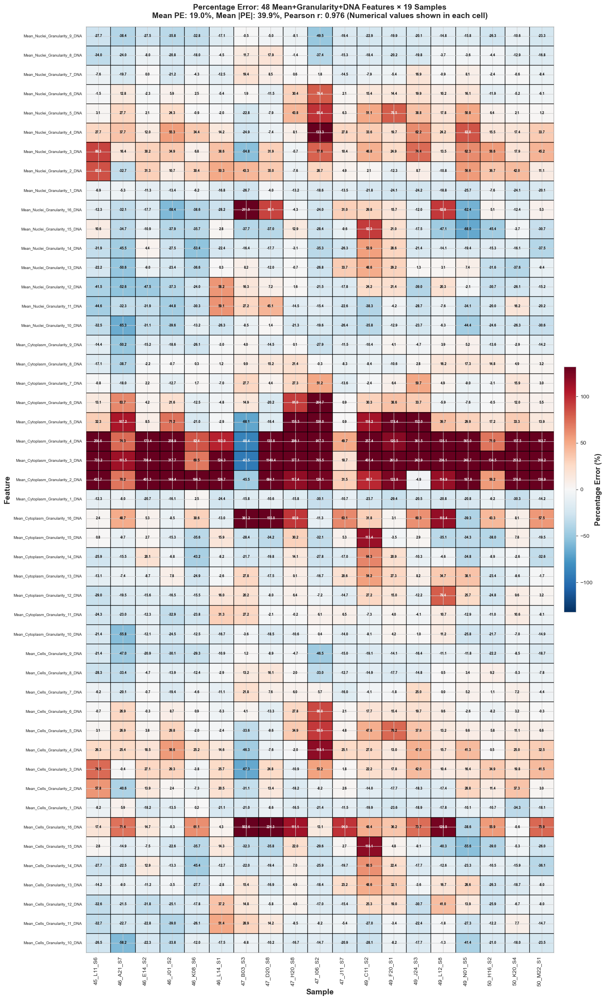

✓ Saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_granularity_DNA_annotated.png

  Verification:
  ✓ Matrix structure: 48 rows × 19 columns
  ✓ Total cells: 912
  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
  ✓ PE calculation: (Predicted - Target) / Target × 100%
  ✓ Feature criteria: Mean AND Granularity AND DNA
  ✓ Grid lines: Black boundaries demarcate individual cells
  ✓ Annotations: Numerical PE value visible in each cell

CHANNEL: ER
Total features: 48
Breakdown: Cells=16, Cytoplasm=16, Nuclei=16
Valid features (non-zero variance): 48

Statistics:
  Mean PE: -6.20%
  Mean |PE|: 14.32%
  Median PE: -6.89%
  Std PE: 18.47%
  Range: [-62.41%, 116.46%]
  Mean Pearson r: 0.9868 ± 0.0366

Generating fully annotated heatmap for ER...
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-37.4%, 37.4%]
  Annotating

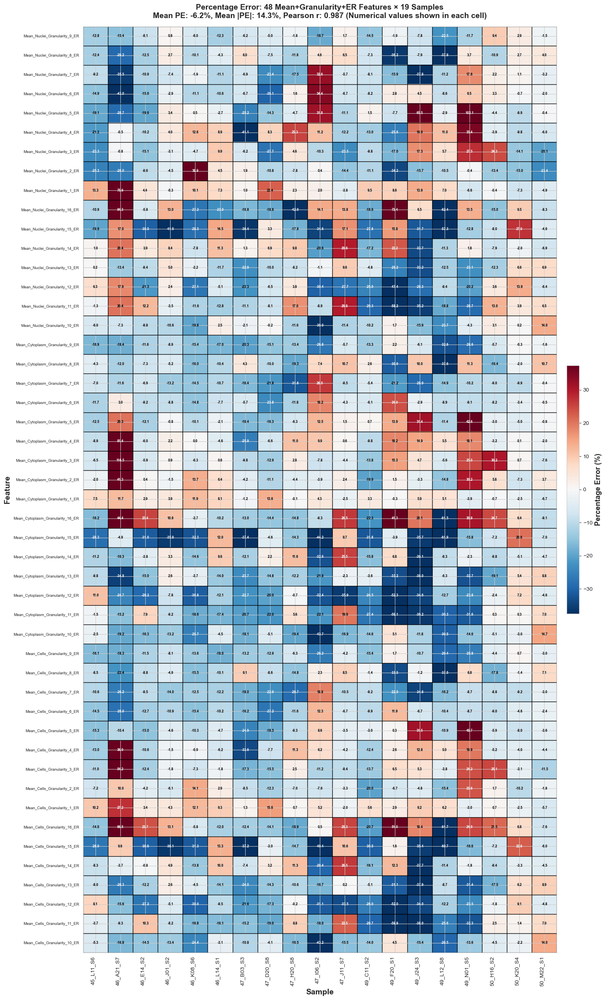

✓ Saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_granularity_ER_annotated.png

  Verification:
  ✓ Matrix structure: 48 rows × 19 columns
  ✓ Total cells: 912
  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
  ✓ PE calculation: (Predicted - Target) / Target × 100%
  ✓ Feature criteria: Mean AND Granularity AND ER
  ✓ Grid lines: Black boundaries demarcate individual cells
  ✓ Annotations: Numerical PE value visible in each cell

CHANNEL: RNA
Total features: 48
Breakdown: Cells=16, Cytoplasm=16, Nuclei=16
Valid features (non-zero variance): 48

Statistics:
  Mean PE: -5.83%
  Mean |PE|: 14.36%
  Median PE: -7.35%
  Std PE: 18.53%
  Range: [-56.37%, 133.62%]
  Mean Pearson r: 0.9896 ± 0.0310

Generating fully annotated heatmap for RNA...
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-35.4%, 35.4%]
  Annotating

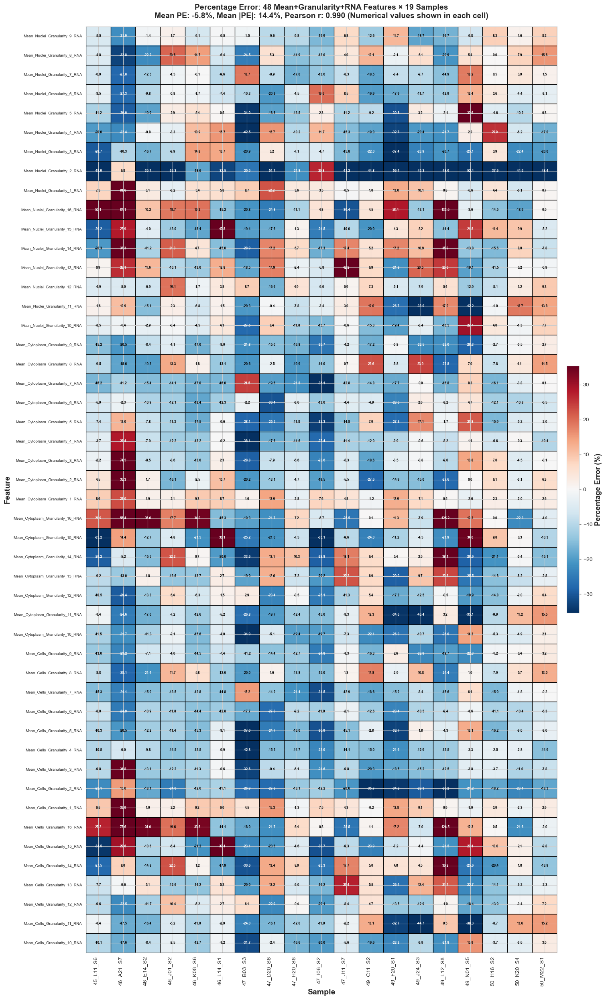

✓ Saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_granularity_RNA_annotated.png

  Verification:
  ✓ Matrix structure: 48 rows × 19 columns
  ✓ Total cells: 912
  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
  ✓ PE calculation: (Predicted - Target) / Target × 100%
  ✓ Feature criteria: Mean AND Granularity AND RNA
  ✓ Grid lines: Black boundaries demarcate individual cells
  ✓ Annotations: Numerical PE value visible in each cell

CHANNEL: AGP
Total features: 48
Breakdown: Cells=16, Cytoplasm=16, Nuclei=16
Valid features (non-zero variance): 48

Statistics:
  Mean PE: -3.49%
  Mean |PE|: 19.61%
  Median PE: -3.76%
  Std PE: 27.16%
  Range: [-64.78%, 127.07%]
  Mean Pearson r: 0.9924 ± 0.0193

Generating fully annotated heatmap for AGP...
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-55.1%, 55.1%]
  Annotati

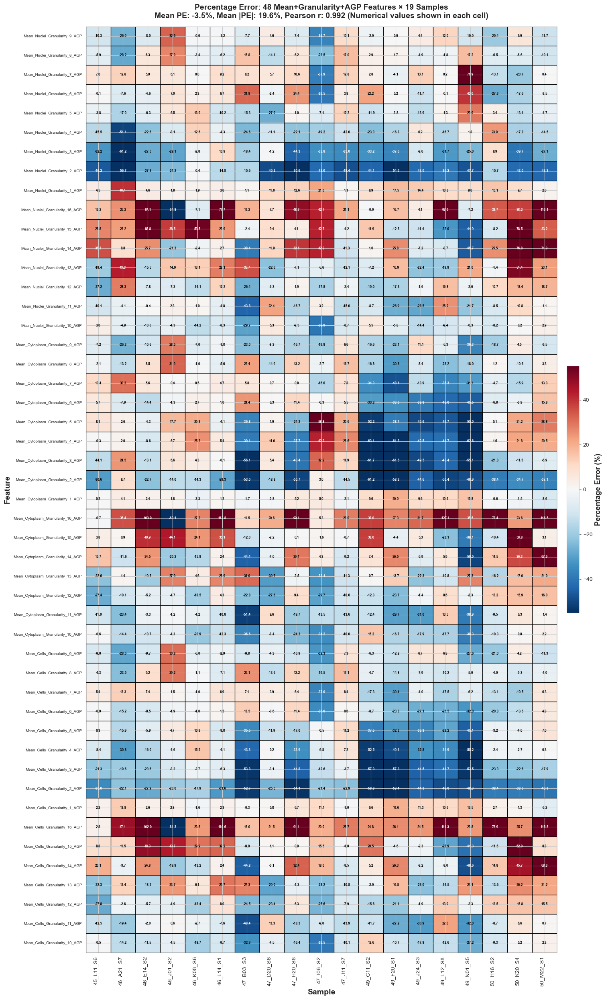

✓ Saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_granularity_AGP_annotated.png

  Verification:
  ✓ Matrix structure: 48 rows × 19 columns
  ✓ Total cells: 912
  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
  ✓ PE calculation: (Predicted - Target) / Target × 100%
  ✓ Feature criteria: Mean AND Granularity AND AGP
  ✓ Grid lines: Black boundaries demarcate individual cells
  ✓ Annotations: Numerical PE value visible in each cell

CHANNEL: Mito
Total features: 48
Breakdown: Cells=16, Cytoplasm=16, Nuclei=16
Valid features (non-zero variance): 48

Statistics:
  Mean PE: -13.49%
  Mean |PE|: 25.03%
  Median PE: -14.48%
  Std PE: 29.21%
  Range: [-83.84%, 163.28%]
  Mean Pearson r: 0.9966 ± 0.0079

Generating fully annotated heatmap for Mito...
  Features (rows): 48
  Samples (columns): 19
  Total annotated cells: 912
  Color scale: [-64.2%, 64.2%]
  Anno

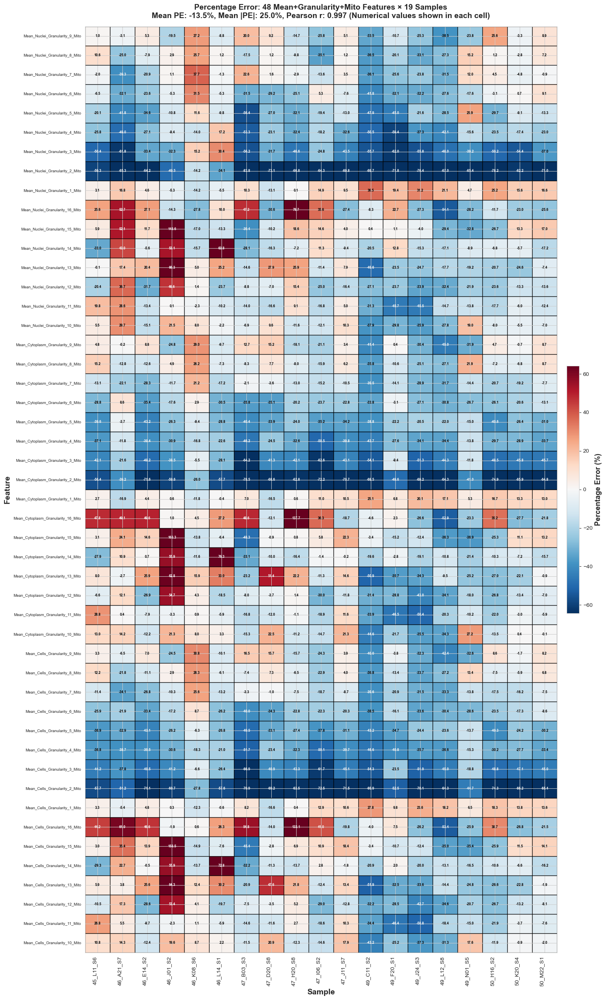

✓ Saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/pe_heatmap_granularity_Mito_annotated.png

  Verification:
  ✓ Matrix structure: 48 rows × 19 columns
  ✓ Total cells: 912
  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value
  ✓ PE calculation: (Predicted - Target) / Target × 100%
  ✓ Feature criteria: Mean AND Granularity AND Mito
  ✓ Grid lines: Black boundaries demarcate individual cells
  ✓ Annotations: Numerical PE value visible in each cell

COMPARISON ACROSS ALL CHANNELS - GRANULARITY

Channel  N_Features  Mean_PE_%  Mean_|PE|_%  Median_PE_%  Std_PE_%  Pearson_r  Cells  Cytoplasm  Nuclei
    DNA          48  18.993068    39.938771    -3.026875 96.917747   0.976022     16         16      16
     ER          48  -6.203829    14.321440    -6.893686 18.468391   0.986762     16         16      16
    RNA          48  -5.833076    14.364728    -7.348512 18.531632   

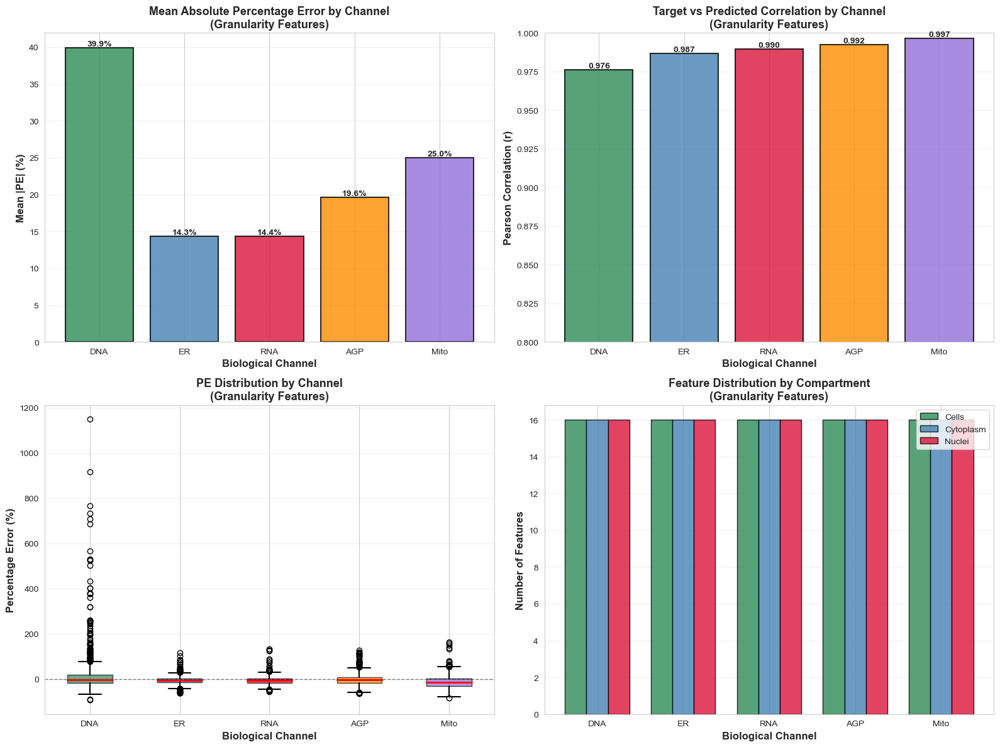


✓ Saved comparison plot: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/granularity_channel_comparison.png

PART 1 COMPLETE: GRANULARITY ANALYSIS

Generated 5 fully annotated individual channel heatmaps
Generated 1 comprehensive comparison figure
Saved comparison statistics CSV

All heatmaps include:
  ✓ Numerical PE values in each cell
  ✓ Black grid lines for cell boundaries
  ✓ Color-coded text (white/black) for visibility
  ✓ RdBu_r colormap (blue=under, white=accurate, red=over)


In [17]:
"""
PART 1 (REVISED): Percentage Error Analysis for Mean+Granularity across ALL 5 Biological Channels
Generates fully annotated heatmaps with PE values in each cell
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

print("="*80)
print("PART 1: MEAN + GRANULARITY FEATURES - ALL BIOLOGICAL CHANNELS")
print("="*80)

# Define all biological channels
biological_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

# Prepare data (use same filtering as before)
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']
profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

# Storage for all channel results
channel_results = {}
channel_pe_matrices = {}
channel_stats = {}

print(f"\nAnalyzing {len(biological_channels)} biological channels...")
print(f"Feature criteria: Mean AND Granularity AND [Channel]")

# Process each channel
for channel in biological_channels:
    print(f"\n{'='*80}")
    print(f"CHANNEL: {channel}")
    print(f"{'='*80}")
    
    # Select features: Mean + Granularity + Channel
    channel_features = [f for f in filtered_features 
                       if 'Mean' in f and 'Granularity' in f and channel in f]
    
    print(f"Total features: {len(channel_features)}")
    
    # Check compartment distribution
    compartment_counts = {}
    for compartment in ['Cells', 'Cytoplasm', 'Nuclei']:
        comp_features = [f for f in channel_features if compartment in f]
        compartment_counts[compartment] = len(comp_features)
    print(f"Breakdown: Cells={compartment_counts['Cells']}, "
          f"Cytoplasm={compartment_counts['Cytoplasm']}, "
          f"Nuclei={compartment_counts['Nuclei']}")
    
    # Prepare feature matrices
    target_features_ch = target_data.set_index('Sample_ID')[channel_features]
    pred_features_ch = pred_data.set_index('Sample_ID')[channel_features]
    
    common_samples = sorted(target_features_ch.index.intersection(pred_features_ch.index))
    target_features_ch = target_features_ch.loc[common_samples]
    pred_features_ch = pred_features_ch.loc[common_samples]
    
    # Remove zero-variance features
    feature_stds = target_features_ch.std(axis=0)
    valid_features_ch = feature_stds[feature_stds > 0].index.tolist()
    
    target_features_ch = target_features_ch[valid_features_ch]
    pred_features_ch = pred_features_ch[valid_features_ch]
    
    print(f"Valid features (non-zero variance): {len(valid_features_ch)}")
    
    # Calculate percentage error matrix
    pe_matrix = np.zeros((len(valid_features_ch), len(common_samples)))
    
    for i, sample in enumerate(common_samples):
        target_vals = target_features_ch.loc[sample, valid_features_ch].values
        pred_vals = pred_features_ch.loc[sample, valid_features_ch].values
        
        for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
            if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
                pe_matrix[j, i] = np.nan
            else:
                pe_matrix[j, i] = ((pred_val - target_val) / target_val) * 100
    
    # Calculate statistics
    pe_valid = pe_matrix[~np.isnan(pe_matrix)]
    
    stats = {
        'channel': channel,
        'n_features': len(valid_features_ch),
        'n_samples': len(common_samples),
        'mean_pe': np.mean(pe_valid),
        'median_pe': np.median(pe_valid),
        'std_pe': np.std(pe_valid),
        'mean_abs_pe': np.mean(np.abs(pe_valid)),
        'min_pe': np.min(pe_valid),
        'max_pe': np.max(pe_valid),
        'compartments': compartment_counts
    }
    
    # Calculate per-sample correlations
    sample_correlations = []
    for sample in common_samples:
        target_vals = target_features_ch.loc[sample, valid_features_ch].values
        pred_vals = pred_features_ch.loc[sample, valid_features_ch].values
        
        mask = ~(np.isnan(target_vals) | np.isnan(pred_vals))
        if np.sum(mask) > 1:
            r, _ = pearsonr(target_vals[mask], pred_vals[mask])
            sample_correlations.append(r)
    
    stats['mean_correlation'] = np.mean(sample_correlations)
    stats['std_correlation'] = np.std(sample_correlations)
    
    print(f"\nStatistics:")
    print(f"  Mean PE: {stats['mean_pe']:.2f}%")
    print(f"  Mean |PE|: {stats['mean_abs_pe']:.2f}%")
    print(f"  Median PE: {stats['median_pe']:.2f}%")
    print(f"  Std PE: {stats['std_pe']:.2f}%")
    print(f"  Range: [{stats['min_pe']:.2f}%, {stats['max_pe']:.2f}%]")
    print(f"  Mean Pearson r: {stats['mean_correlation']:.4f} ± {stats['std_correlation']:.4f}")
    
    # Store results
    channel_results[channel] = {
        'features': valid_features_ch,
        'samples': common_samples,
        'target': target_features_ch,
        'predicted': pred_features_ch
    }
    channel_pe_matrices[channel] = pe_matrix
    channel_stats[channel] = stats
    
    # =========================================================================
    # Generate FULLY ANNOTATED heatmap for this channel
    # =========================================================================
    print(f"\nGenerating fully annotated heatmap for {channel}...")
    print(f"  Features (rows): {len(valid_features_ch)}")
    print(f"  Samples (columns): {len(common_samples)}")
    print(f"  Total annotated cells: {len(valid_features_ch) * len(common_samples)}")
    
    # Color scale
    abs_pe_95 = np.nanpercentile(np.abs(pe_valid), 95)
    vmin_pe = -abs_pe_95
    vmax_pe = abs_pe_95
    
    print(f"  Color scale: [{vmin_pe:.1f}%, {vmax_pe:.1f}%]")
    
    # Create figure with appropriate sizing for readability
    fig_width = max(15, len(common_samples) * 0.8)
    fig_height = max(25, len(valid_features_ch) * 0.5)
    
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    
    # Plot heatmap
    im = ax.imshow(pe_matrix,
                   aspect='auto',
                   cmap='RdBu_r',
                   vmin=vmin_pe,
                   vmax=vmax_pe,
                   interpolation='nearest')
    
    # Colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.02)
    cbar.set_label('Percentage Error (%)', fontsize=13, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)
    
    # Annotate ALL cells with numerical PE values
    print("  Annotating all cells with PE values...")
    for i in range(len(valid_features_ch)):
        for j in range(len(common_samples)):
            value = pe_matrix[i, j]
            if not np.isnan(value):
                # Choose text color for visibility
                # White text for extreme values, black for moderate values
                if abs(value) > abs(vmax_pe) * 0.6:
                    text_color = 'white'
                else:
                    text_color = 'black'
                
                # Add text annotation
                ax.text(j, i, f'{value:.1f}',
                       ha='center', va='center',
                       fontsize=6, color=text_color,
                       fontweight='bold')
    
    print("  ✓ All cells annotated")
    
    # X-axis: samples
    ax.set_xlim(-0.5, len(common_samples) - 0.5)
    ax.set_xticks(range(len(common_samples)))
    ax.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=10)
    ax.set_xlabel('Sample', fontsize=14, fontweight='bold')
    
    # Y-axis: features
    ax.set_ylim(-0.5, len(valid_features_ch) - 0.5)
    ax.set_yticks(range(len(valid_features_ch)))
    ax.set_yticklabels(valid_features_ch, fontsize=7)
    ax.set_ylabel('Feature', fontsize=14, fontweight='bold')
    
    # Title
    title = (f'Percentage Error: {len(valid_features_ch)} Mean+Granularity+{channel} Features '
             f'× {len(common_samples)} Samples\n'
             f'Mean PE: {stats["mean_pe"]:.1f}%, Mean |PE|: {stats["mean_abs_pe"]:.1f}%, '
             f'Pearson r: {stats["mean_correlation"]:.3f} (Numerical values shown in each cell)')
    ax.set_title(title, fontsize=14, fontweight='bold', pad=15)
    
    # Grid: thick black lines at cell boundaries for clarity
    ax.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
    ax.set_yticks(np.arange(len(valid_features_ch) + 1) - 0.5, minor=True)
    ax.grid(which='minor', color='black', linestyle='-', linewidth=1.0)
    ax.tick_params(which='minor', size=0)
    
    plt.tight_layout()
    
    # Save
    output_file = OUTPUT_DIR / f'pe_heatmap_granularity_{channel}_annotated.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✓ Saved: {output_file}")
    
    # Verification
    print(f"\n  Verification:")
    print(f"  ✓ Matrix structure: {len(valid_features_ch)} rows × {len(common_samples)} columns")
    print(f"  ✓ Total cells: {len(valid_features_ch) * len(common_samples)}")
    print(f"  ✓ Each cell displays: Feature name (row) × Sample ID (column) = PE value")
    print(f"  ✓ PE calculation: (Predicted - Target) / Target × 100%")
    print(f"  ✓ Feature criteria: Mean AND Granularity AND {channel}")
    print(f"  ✓ Grid lines: Black boundaries demarcate individual cells")
    print(f"  ✓ Annotations: Numerical PE value visible in each cell")

print("\n" + "="*80)
print("COMPARISON ACROSS ALL CHANNELS - GRANULARITY")
print("="*80)

# Create comparison summary
comparison_df = pd.DataFrame({
    'Channel': [channel_stats[ch]['channel'] for ch in biological_channels],
    'N_Features': [channel_stats[ch]['n_features'] for ch in biological_channels],
    'Mean_PE_%': [channel_stats[ch]['mean_pe'] for ch in biological_channels],
    'Mean_|PE|_%': [channel_stats[ch]['mean_abs_pe'] for ch in biological_channels],
    'Median_PE_%': [channel_stats[ch]['median_pe'] for ch in biological_channels],
    'Std_PE_%': [channel_stats[ch]['std_pe'] for ch in biological_channels],
    'Pearson_r': [channel_stats[ch]['mean_correlation'] for ch in biological_channels],
    'Cells': [channel_stats[ch]['compartments']['Cells'] for ch in biological_channels],
    'Cytoplasm': [channel_stats[ch]['compartments']['Cytoplasm'] for ch in biological_channels],
    'Nuclei': [channel_stats[ch]['compartments']['Nuclei'] for ch in biological_channels]
})

print("\n" + comparison_df.to_string(index=False))

# Save comparison
comparison_file = OUTPUT_DIR / 'granularity_channel_comparison.csv'
comparison_df.to_csv(comparison_file, index=False)
print(f"\n✓ Saved comparison: {comparison_file}")

# Visualization: Comparison plots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Mean Absolute PE by Channel
ax1 = axes[0, 0]
bars1 = ax1.bar(comparison_df['Channel'], comparison_df['Mean_|PE|_%'], 
                color=['#2E8B57', '#4682B4', '#DC143C', '#FF8C00', '#9370DB'],
                alpha=0.8, edgecolor='black', linewidth=1.5)
ax1.set_ylabel('Mean |PE| (%)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
ax1.set_title('Mean Absolute Percentage Error by Channel\n(Granularity Features)', 
              fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)
# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 2. Pearson Correlation by Channel
ax2 = axes[0, 1]
bars2 = ax2.bar(comparison_df['Channel'], comparison_df['Pearson_r'],
                color=['#2E8B57', '#4682B4', '#DC143C', '#FF8C00', '#9370DB'],
                alpha=0.8, edgecolor='black', linewidth=1.5)
ax2.set_ylabel('Pearson Correlation (r)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
ax2.set_title('Target vs Predicted Correlation by Channel\n(Granularity Features)', 
              fontsize=13, fontweight='bold')
ax2.set_ylim([0.8, 1.0])
ax2.grid(axis='y', alpha=0.3)
# Add value labels
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 3. PE Distribution by Channel (boxplot)
ax3 = axes[1, 0]
pe_data_by_channel = []
for channel in biological_channels:
    pe_valid = channel_pe_matrices[channel][~np.isnan(channel_pe_matrices[channel])]
    pe_data_by_channel.append(pe_valid)

bp = ax3.boxplot(pe_data_by_channel, labels=biological_channels, patch_artist=True,
                 medianprops=dict(color='red', linewidth=2),
                 whiskerprops=dict(linewidth=1.5),
                 capprops=dict(linewidth=1.5))
colors = ['#2E8B57', '#4682B4', '#DC143C', '#FF8C00', '#9370DB']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax3.set_ylabel('Percentage Error (%)', fontsize=12, fontweight='bold')
ax3.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
ax3.set_title('PE Distribution by Channel\n(Granularity Features)', 
              fontsize=13, fontweight='bold')
ax3.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
ax3.grid(axis='y', alpha=0.3)

# 4. Feature count by compartment
ax4 = axes[1, 1]
x = np.arange(len(biological_channels))
width = 0.25
bars_cells = ax4.bar(x - width, comparison_df['Cells'], width, label='Cells',
                     color='#2E8B57', alpha=0.8, edgecolor='black', linewidth=1)
bars_cyto = ax4.bar(x, comparison_df['Cytoplasm'], width, label='Cytoplasm',
                    color='#4682B4', alpha=0.8, edgecolor='black', linewidth=1)
bars_nuclei = ax4.bar(x + width, comparison_df['Nuclei'], width, label='Nuclei',
                      color='#DC143C', alpha=0.8, edgecolor='black', linewidth=1)
ax4.set_ylabel('Number of Features', fontsize=12, fontweight='bold')
ax4.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
ax4.set_title('Feature Distribution by Compartment\n(Granularity Features)', 
              fontsize=13, fontweight='bold')
ax4.set_xticks(x)
ax4.set_xticklabels(biological_channels)
ax4.legend(fontsize=10)
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
comparison_plot_file = OUTPUT_DIR / 'granularity_channel_comparison.png'
plt.savefig(comparison_plot_file, dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Saved comparison plot: {comparison_plot_file}")

print("\n" + "="*80)
print("PART 1 COMPLETE: GRANULARITY ANALYSIS")
print("="*80)
print(f"\nGenerated {len(biological_channels)} fully annotated individual channel heatmaps")
print(f"Generated 1 comprehensive comparison figure")
print(f"Saved comparison statistics CSV")
print("\nAll heatmaps include:")
print("  ✓ Numerical PE values in each cell")
print("  ✓ Black grid lines for cell boundaries")
print("  ✓ Color-coded text (white/black) for visibility")
print("  ✓ RdBu_r colormap (blue=under, white=accurate, red=over)")
print("="*80)

PART 2: TOP 10 BEST vs WORST PERFORMING FEATURES - ALL CHANNELS

Generating PowerPoint-ready slides for 5 channels...
Format: Top 10 Best PE (left) | Top 10 Worst PE (right)

Fixed color scale: [-100.0%, 100.0%]
Values outside this range will be tracked as outliers.

PASS 1: Computing percentage errors and identifying outliers
Processing DNA... ✓ (48 features, 19 samples, 62 outliers)
Processing ER... ✓ (48 features, 19 samples, 2 outliers)
Processing RNA... ✓ (48 features, 19 samples, 3 outliers)
Processing AGP... ✓ (48 features, 19 samples, 9 outliers)
Processing Mito... ✓ (48 features, 19 samples, 5 outliers)

OUTLIER SUMMARY:
  Total outliers (|PE| > 100%): 81
  Total PE measurements: 4,560
  Outlier percentage: 1.78%

PASS 2: Generating heatmaps with fixed color scale [-100%, +100%]
Generating heatmap for DNA... 

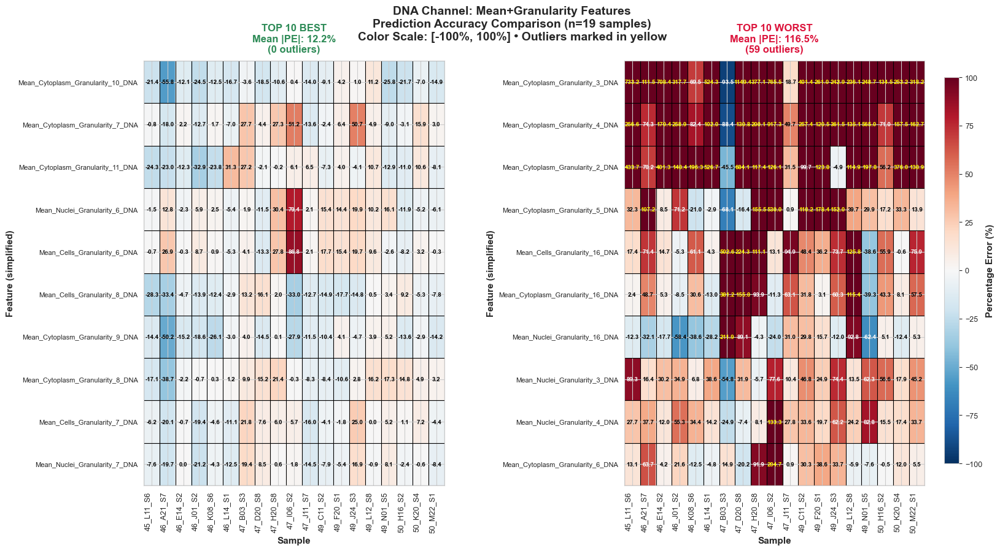

✓
Generating heatmap for ER... 

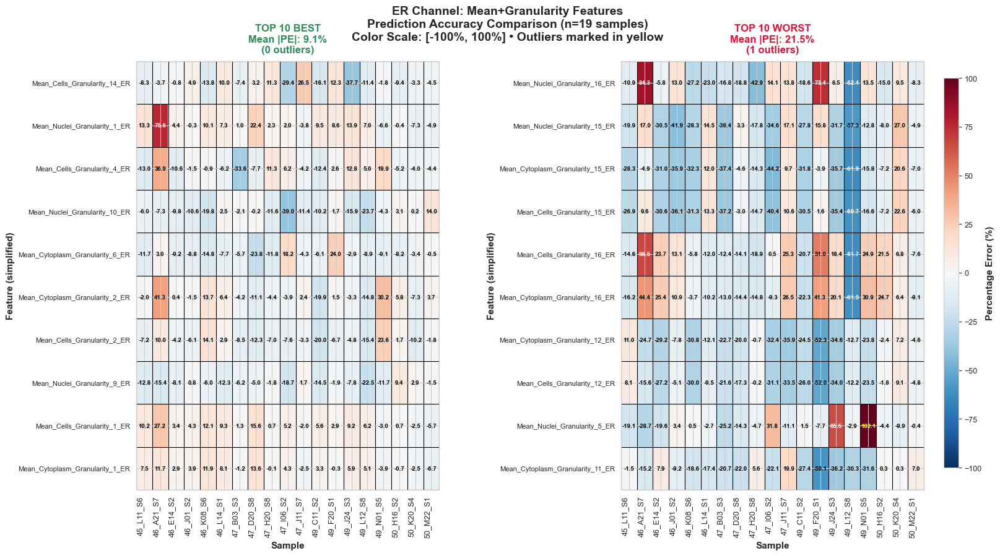

✓
Generating heatmap for RNA... 

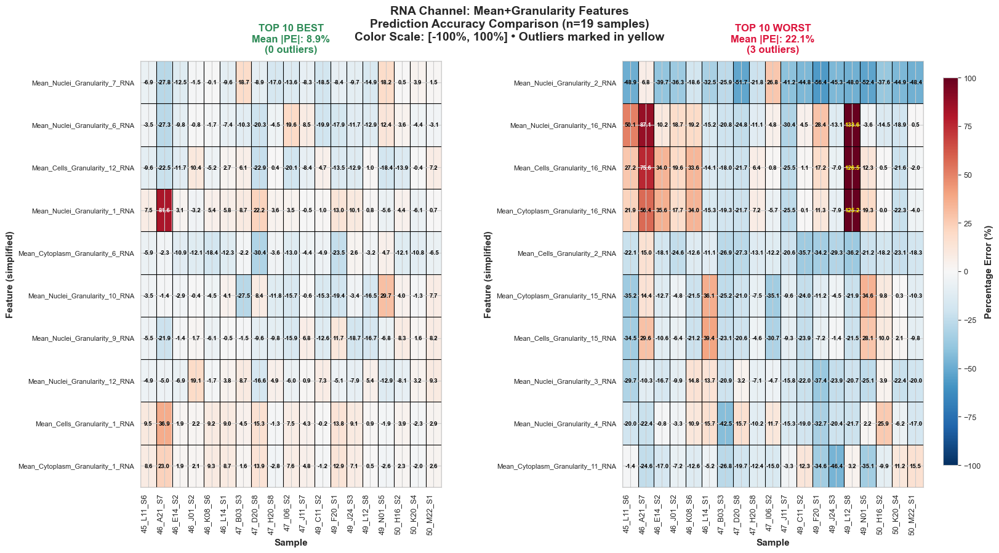

✓
Generating heatmap for AGP... 

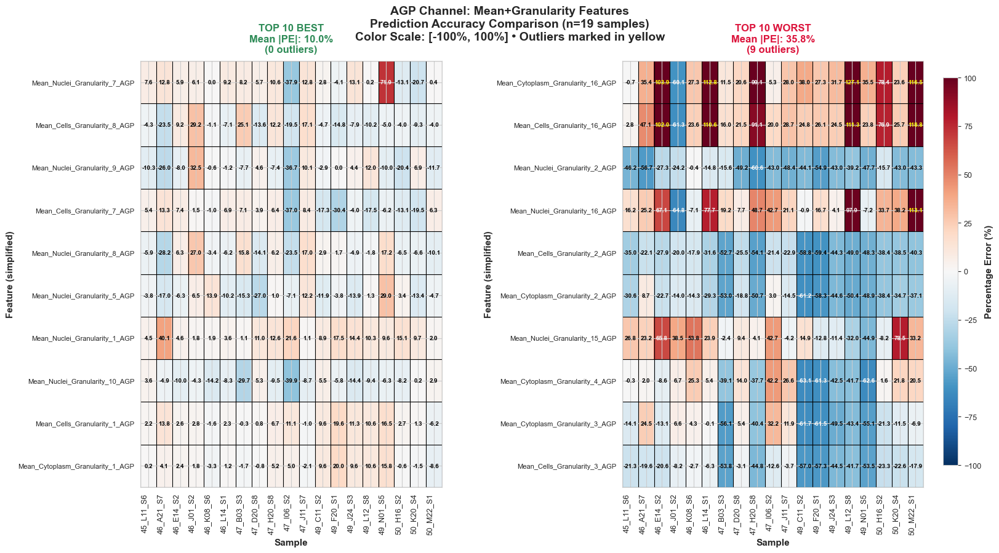

✓
Generating heatmap for Mito... 

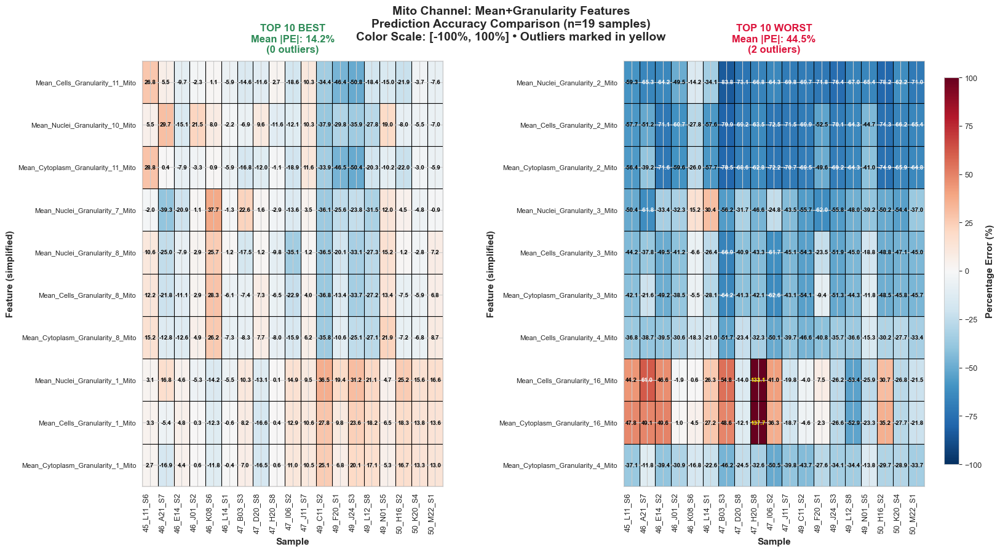

✓

CONSOLIDATED STATISTICS: ALL CHANNELS

Fixed Color Scale: [-100%, 100%]
Total PE measurements: 4,560
Total outliers (|PE| > 100%): 81 (1.78%)

----------------------------------------------------------------------------------------------------
Channel  Features   Samples  Outliers   Best PE        Worst PE       Channel PE Range    
----------------------------------------------------------------------------------------------------
DNA      48         19       62          8.5%- 15.0%  30.9%- 366.6%   -93.5% to  1149.4%
ER       48         19       2           5.0%- 11.4%  18.5%-  25.1%   -62.4% to   116.5%
RNA      48         19       3           6.1%- 10.6%  16.5%-  38.3%   -56.4% to   133.6%
AGP      48         19       9           5.5%- 12.8%  27.1%-  51.7%   -64.8% to   127.1%
Mito     48         19       5          10.5%- 16.2%  31.5%-  63.5%   -83.8% to   163.3%
----------------------------------------------------------------------------------------------------

AGGREGATE STAT

In [24]:
"""
PART 2: Top 10 Best vs Worst Performing Features - PE Analysis by Channel
Generates side-by-side annotated heatmaps formatted for PowerPoint presentations
One slide per biological channel (5 total)
COLOR SCALE: Fixed at [-100%, +100%] with outlier tracking
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

print("="*80)
print("PART 2: TOP 10 BEST vs WORST PERFORMING FEATURES - ALL CHANNELS")
print("="*80)

# Define all biological channels
biological_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

# Prepare data (use same filtering as before)
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']
profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

print(f"\nGenerating PowerPoint-ready slides for {len(biological_channels)} channels...")
print(f"Format: Top 10 Best PE (left) | Top 10 Worst PE (right)")

# ============================================================================
# FIXED COLOR SCALE DEFINITION
# ============================================================================
vmin_pe_global = -100.0
vmax_pe_global = 100.0
print(f"\nFixed color scale: [{vmin_pe_global:.1f}%, {vmax_pe_global:.1f}%]")
print("Values outside this range will be tracked as outliers.")

# ============================================================================
# PASS 1: Calculate PE for all channels and track outliers
# ============================================================================
print("\n" + "="*80)
print("PASS 1: Computing percentage errors and identifying outliers")
print("="*80)

all_pe_values = []
channel_data = {}
channel_statistics = {}
all_outliers = []  # Track all outliers across channels

for channel in biological_channels:
    print(f"Processing {channel}...", end=' ')
    
    # Select features: Mean + Granularity + Channel
    channel_features = [f for f in filtered_features 
                       if 'Mean' in f and 'Granularity' in f and channel in f]
    
    # Prepare feature matrices
    target_features_ch = target_data.set_index('Sample_ID')[channel_features]
    pred_features_ch = pred_data.set_index('Sample_ID')[channel_features]
    
    common_samples = sorted(target_features_ch.index.intersection(pred_features_ch.index))
    target_features_ch = target_features_ch.loc[common_samples]
    pred_features_ch = pred_features_ch.loc[common_samples]
    
    # Remove zero-variance features
    feature_stds = target_features_ch.std(axis=0)
    valid_features_ch = feature_stds[feature_stds > 0].index.tolist()
    
    target_features_ch = target_features_ch[valid_features_ch]
    pred_features_ch = pred_features_ch[valid_features_ch]
    
    # Calculate percentage error matrix
    pe_matrix = np.zeros((len(valid_features_ch), len(common_samples)))
    
    for i, sample in enumerate(common_samples):
        target_vals = target_features_ch.loc[sample, valid_features_ch].values
        pred_vals = pred_features_ch.loc[sample, valid_features_ch].values
        
        for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
            if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
                pe_matrix[j, i] = np.nan
            else:
                pe_matrix[j, i] = ((pred_val - target_val) / target_val) * 100
    
    # Store PE values for global statistics
    pe_valid = pe_matrix[~np.isnan(pe_matrix)]
    all_pe_values.append(pe_valid)
    
    # Identify outliers (|PE| > 100%)
    outlier_mask = np.abs(pe_matrix) > 100
    outlier_mask[np.isnan(pe_matrix)] = False  # Exclude NaN values
    
    outlier_indices = np.where(outlier_mask)
    channel_outliers = []
    
    for feat_idx, sample_idx in zip(outlier_indices[0], outlier_indices[1]):
        pe_value = pe_matrix[feat_idx, sample_idx]
        feature_name = valid_features_ch[feat_idx]
        sample_name = common_samples[sample_idx]
        
        outlier_record = {
            'Channel': channel,
            'Sample_ID': sample_name,
            'Feature': feature_name,
            'PE_Value': pe_value
        }
        channel_outliers.append(outlier_record)
        all_outliers.append(outlier_record)
    
    # Calculate mean absolute PE per feature to rank performance
    mean_abs_pe_per_feature = np.nanmean(np.abs(pe_matrix), axis=1)
    
    # Create feature ranking dataframe
    feature_ranking = pd.DataFrame({
        'Feature': valid_features_ch,
        'Mean_Abs_PE': mean_abs_pe_per_feature,
        'Index': range(len(valid_features_ch))
    })
    
    # Sort by performance
    feature_ranking = feature_ranking.sort_values('Mean_Abs_PE')
    
    # Select top 10 best and worst
    n_features = 10
    best_features = feature_ranking.head(n_features)
    worst_features = feature_ranking.tail(n_features)
    
    best_indices = best_features['Index'].values
    worst_indices = worst_features['Index'].values
    
    pe_matrix_best = pe_matrix[best_indices, :]
    pe_matrix_worst = pe_matrix[worst_indices, :]
    
    # Count outliers in best vs worst panels
    best_outliers = np.sum(np.abs(pe_matrix_best) > 100)
    worst_outliers = np.sum(np.abs(pe_matrix_worst) > 100)
    
    # Store statistics for consolidated reporting
    channel_statistics[channel] = {
        'total_features': len(channel_features),
        'valid_features': len(valid_features_ch),
        'n_samples': len(common_samples),
        'best_pe_min': best_features['Mean_Abs_PE'].min(),
        'best_pe_max': best_features['Mean_Abs_PE'].max(),
        'worst_pe_min': worst_features['Mean_Abs_PE'].min(),
        'worst_pe_max': worst_features['Mean_Abs_PE'].max(),
        'best_panel_mean_pe': np.nanmean(np.abs(pe_matrix_best)),
        'worst_panel_mean_pe': np.nanmean(np.abs(pe_matrix_worst)),
        'channel_pe_min': np.nanmin(pe_valid),
        'channel_pe_max': np.nanmax(pe_valid),
        'channel_pe_mean': np.nanmean(np.abs(pe_valid)),
        'n_outliers': len(channel_outliers),
        'best_panel_outliers': best_outliers,
        'worst_panel_outliers': worst_outliers,
        'outliers': channel_outliers
    }
    
    # Store data for Pass 2
    channel_data[channel] = {
        'pe_matrix': pe_matrix,
        'valid_features_ch': valid_features_ch,
        'common_samples': common_samples,
        'feature_ranking': feature_ranking,
        'best_features': best_features,
        'worst_features': worst_features,
        'best_indices': best_indices,
        'worst_indices': worst_indices
    }
    
    print(f"✓ ({len(valid_features_ch)} features, {len(common_samples)} samples, {len(channel_outliers)} outliers)")

# Global statistics
all_pe_combined = np.concatenate(all_pe_values)
total_outliers = len(all_outliers)

print(f"\n{'='*80}")
print(f"OUTLIER SUMMARY:")
print(f"  Total outliers (|PE| > 100%): {total_outliers}")
print(f"  Total PE measurements: {len(all_pe_combined):,}")
print(f"  Outlier percentage: {100 * total_outliers / len(all_pe_combined):.2f}%")
print(f"{'='*80}")

# ============================================================================
# PASS 2: Generate heatmaps using fixed global scale
# ============================================================================
print("\n" + "="*80)
print("PASS 2: Generating heatmaps with fixed color scale [-100%, +100%]")
print("="*80)

for channel in biological_channels:
    print(f"Generating heatmap for {channel}...", end=' ')
    
    # Retrieve pre-computed data
    pe_matrix = channel_data[channel]['pe_matrix']
    valid_features_ch = channel_data[channel]['valid_features_ch']
    common_samples = channel_data[channel]['common_samples']
    best_features = channel_data[channel]['best_features']
    worst_features = channel_data[channel]['worst_features']
    best_indices = channel_data[channel]['best_indices']
    worst_indices = channel_data[channel]['worst_indices']
    
    n_features = 10
    
    # Extract PE submatrices
    pe_matrix_best = pe_matrix[best_indices, :]
    pe_matrix_worst = pe_matrix[worst_indices, :]
    
    best_feature_names = best_features['Feature'].values
    worst_feature_names = worst_features['Feature'].values
    
    # =========================================================================
    # Create side-by-side heatmap figure (PowerPoint format: 16:9 aspect ratio)
    # =========================================================================
    
    fig_width = 16
    fig_height = 9
    
    fig, (ax_best, ax_worst) = plt.subplots(1, 2, figsize=(fig_width, fig_height))
    
    # ========================== LEFT PANEL: TOP 10 BEST ==========================
    im_best = ax_best.imshow(pe_matrix_best,
                             aspect='auto',
                             cmap='RdBu_r',
                             vmin=vmin_pe_global,
                             vmax=vmax_pe_global,
                             interpolation='nearest')
    
    # Annotate cells
    for i in range(n_features):
        for j in range(len(common_samples)):
            value = pe_matrix_best[i, j]
            if not np.isnan(value):
                # Mark outliers with special formatting
                if abs(value) > 100:
                    text_color = 'yellow'
                    text_weight = 'bold'
                else:
                    text_color = 'white' if abs(value) > abs(vmax_pe_global) * 0.6 else 'black'
                    text_weight = 'bold'
                
                ax_best.text(j, i, f'{value:.1f}',
                           ha='center', va='center',
                           fontsize=7, color=text_color,
                           fontweight=text_weight)
    
    # X-axis
    ax_best.set_xlim(-0.5, len(common_samples) - 0.5)
    ax_best.set_xticks(range(len(common_samples)))
    ax_best.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=9)
    ax_best.set_xlabel('Sample', fontsize=11, fontweight='bold')
    
    # Y-axis: Simplify feature names for readability
    simplified_names_best = list(best_feature_names)
    ax_best.set_ylim(-0.5, n_features - 0.5)
    ax_best.set_yticks(range(n_features))
    ax_best.set_yticklabels(simplified_names_best, fontsize=8)
    ax_best.set_ylabel('Feature (simplified)', fontsize=11, fontweight='bold')
    
    # Title
    mean_pe_best = np.nanmean(np.abs(pe_matrix_best))
    n_outliers_best = channel_statistics[channel]['best_panel_outliers']
    ax_best.set_title(f'TOP 10 BEST\nMean |PE|: {mean_pe_best:.1f}%\n({n_outliers_best} outliers)',
                     fontsize=12, fontweight='bold', pad=10,
                     color='#2E8B57')
    
    # Grid
    ax_best.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
    ax_best.set_yticks(np.arange(n_features + 1) - 0.5, minor=True)
    ax_best.grid(which='minor', color='black', linestyle='-', linewidth=0.8)
    ax_best.tick_params(which='minor', size=0)
    
    # ========================== RIGHT PANEL: TOP 10 WORST ==========================
    im_worst = ax_worst.imshow(pe_matrix_worst,
                               aspect='auto',
                               cmap='RdBu_r',
                               vmin=vmin_pe_global,
                               vmax=vmax_pe_global,
                               interpolation='nearest')
    
    # Annotate cells
    for i in range(n_features):
        for j in range(len(common_samples)):
            value = pe_matrix_worst[i, j]
            if not np.isnan(value):
                # Mark outliers with special formatting
                if abs(value) > 100:
                    text_color = 'yellow'
                    text_weight = 'bold'
                else:
                    text_color = 'white' if abs(value) > abs(vmax_pe_global) * 0.6 else 'black'
                    text_weight = 'bold'
                
                ax_worst.text(j, i, f'{value:.1f}',
                            ha='center', va='center',
                            fontsize=7, color=text_color,
                            fontweight=text_weight)
    
    # X-axis
    ax_worst.set_xlim(-0.5, len(common_samples) - 0.5)
    ax_worst.set_xticks(range(len(common_samples)))
    ax_worst.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=9)
    ax_worst.set_xlabel('Sample', fontsize=11, fontweight='bold')
    
    # Y-axis
    simplified_names_worst = list(worst_feature_names)
    ax_worst.set_ylim(-0.5, n_features - 0.5)
    ax_worst.set_yticks(range(n_features))
    ax_worst.set_yticklabels(simplified_names_worst, fontsize=8)
    ax_worst.set_ylabel('Feature (simplified)', fontsize=11, fontweight='bold')
    
    # Title
    mean_pe_worst = np.nanmean(np.abs(pe_matrix_worst))
    n_outliers_worst = channel_statistics[channel]['worst_panel_outliers']
    ax_worst.set_title(f'TOP 10 WORST\nMean |PE|: {mean_pe_worst:.1f}%\n({n_outliers_worst} outliers)',
                      fontsize=12, fontweight='bold', pad=10,
                      color='#DC143C')
    
    # Grid
    ax_worst.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
    ax_worst.set_yticks(np.arange(n_features + 1) - 0.5, minor=True)
    ax_worst.grid(which='minor', color='black', linestyle='-', linewidth=0.8)
    ax_worst.tick_params(which='minor', size=0)
    
    # ========================== SHARED COLORBAR ==========================
    fig.subplots_adjust(right=0.92, wspace=0.60)
    cbar_ax = fig.add_axes([0.94, 0.15, 0.015, 0.7])
    cbar = fig.colorbar(im_worst, cax=cbar_ax)
    cbar.set_label('Percentage Error (%)', fontsize=11, fontweight='bold')
    cbar.ax.tick_params(labelsize=9)
    
    # ========================== OVERALL TITLE ==========================
    fig.suptitle(f'{channel} Channel: Mean+Granularity Features\n'
                 f'Prediction Accuracy Comparison (n={len(common_samples)} samples)\n'
                 f'Color Scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%] • Outliers marked in yellow',
                 fontsize=14, fontweight='bold', y=0.98)
    
    # Save
    output_file = OUTPUT_DIR / f'pe_comparison_best_worst_{channel}_ppt_fixed100.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    
    print(f"✓")
    
    # Save detailed feature lists
    feature_list_file = OUTPUT_DIR / f'feature_ranking_{channel}.csv'
    channel_data[channel]['feature_ranking'].to_csv(feature_list_file, index=False)

# ============================================================================
# CONSOLIDATED STATISTICS SUMMARY
# ============================================================================
print("\n" + "="*80)
print("CONSOLIDATED STATISTICS: ALL CHANNELS")
print("="*80)

print(f"\nFixed Color Scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%]")
print(f"Total PE measurements: {len(all_pe_combined):,}")
print(f"Total outliers (|PE| > 100%): {total_outliers} ({100 * total_outliers / len(all_pe_combined):.2f}%)\n")

print("-" * 100)
print(f"{'Channel':<8} {'Features':<10} {'Samples':<8} {'Outliers':<10} {'Best PE':<14} {'Worst PE':<14} {'Channel PE Range':<20}")
print("-" * 100)

for channel in biological_channels:
    stats = channel_statistics[channel]
    print(f"{channel:<8} "
          f"{stats['valid_features']:<10} "
          f"{stats['n_samples']:<8} "
          f"{stats['n_outliers']:<10} "
          f"{stats['best_pe_min']:>4.1f}%-{stats['best_pe_max']:>5.1f}%  "
          f"{stats['worst_pe_min']:>4.1f}%-{stats['worst_pe_max']:>6.1f}%  "
          f"{stats['channel_pe_min']:>6.1f}% to {stats['channel_pe_max']:>7.1f}%")

print("-" * 100)

# Calculate aggregate statistics
all_best_pe = [channel_statistics[ch]['best_pe_min'] for ch in biological_channels] + \
              [channel_statistics[ch]['best_pe_max'] for ch in biological_channels]
all_worst_pe = [channel_statistics[ch]['worst_pe_min'] for ch in biological_channels] + \
               [channel_statistics[ch]['worst_pe_max'] for ch in biological_channels]
all_channel_pe_min = [channel_statistics[ch]['channel_pe_min'] for ch in biological_channels]
all_channel_pe_max = [channel_statistics[ch]['channel_pe_max'] for ch in biological_channels]

print(f"\nAGGREGATE STATISTICS ACROSS ALL CHANNELS:")
print(f"  • Best-performing features (top 10 per channel):")
print(f"      Mean |PE| range: {min(all_best_pe):.2f}% - {max(all_best_pe):.2f}%")
print(f"  • Worst-performing features (bottom 10 per channel):")
print(f"      Mean |PE| range: {min(all_worst_pe):.2f}% - {max(all_worst_pe):.2f}%")
print(f"  • Full PE distribution (all features, all samples):")
print(f"      Minimum PE: {min(all_channel_pe_min):.1f}%")
print(f"      Maximum PE: {max(all_channel_pe_max):.1f}%")
print(f"      Mean |PE|: {np.nanmean(np.abs(all_pe_combined)):.2f}%")
print(f"      Median |PE|: {np.nanmedian(np.abs(all_pe_combined)):.2f}%")

# ============================================================================
# DETAILED OUTLIER REPORT
# ============================================================================
print("\n" + "="*80)
print("DETAILED OUTLIER REPORT (|PE| > 100%)")
print("="*80)

if total_outliers > 0:
    # Convert to DataFrame for easier analysis
    outliers_df = pd.DataFrame(all_outliers)
    
    # Sort by absolute PE value (descending)
    outliers_df['Abs_PE'] = outliers_df['PE_Value'].abs()
    outliers_df = outliers_df.sort_values('Abs_PE', ascending=False)
    
    print(f"\nTotal outliers: {total_outliers}")
    print(f"\nBreakdown by channel:")
    for channel in biological_channels:
        n_channel_outliers = len(outliers_df[outliers_df['Channel'] == channel])
        print(f"  {channel}: {n_channel_outliers} outliers")
    
    print(f"\n{'='*100}")
    print(f"{'Rank':<6} {'Channel':<8} {'Sample ID':<20} {'Feature (truncated)':<35} {'PE Value':<12}")
    print(f"{'='*100}")
    
    for idx, row in outliers_df.iterrows():
        rank = outliers_df.index.get_loc(idx) + 1
        feature_truncated = row['Feature'][:35] + '...' if len(row['Feature']) > 35 else row['Feature']
        print(f"{rank:<6} {row['Channel']:<8} {row['Sample_ID']:<20} {feature_truncated:<35} {row['PE_Value']:>10.1f}%")
        
        # Limit display to first 50 outliers for readability
        if rank >= 50:
            remaining = len(outliers_df) - 50
            if remaining > 0:
                print(f"\n... and {remaining} additional outliers (see CSV for complete list)")
            break
    
    print(f"{'='*100}")
    
    # Save complete outlier list to CSV
    outlier_file = OUTPUT_DIR / 'outliers_complete_list.csv'
    outliers_df[['Channel', 'Sample_ID', 'Feature', 'PE_Value', 'Abs_PE']].to_csv(
        outlier_file, index=False
    )
    print(f"\n✓ Complete outlier list saved: {outlier_file}")
    
    # Summary statistics on outliers
    print(f"\nOutlier statistics:")
    print(f"  • Minimum outlier PE: {outliers_df['PE_Value'].min():.1f}%")
    print(f"  • Maximum outlier PE: {outliers_df['PE_Value'].max():.1f}%")
    print(f"  • Mean outlier |PE|: {outliers_df['Abs_PE'].mean():.1f}%")
    print(f"  • Median outlier |PE|: {outliers_df['Abs_PE'].median():.1f}%")
    
else:
    print("\nNo outliers detected (all |PE| values ≤ 100%)")

print("\n" + "="*80)
print("OUTPUT FILES SUMMARY")
print("="*80)
print(f"Generated {len(biological_channels)} PowerPoint-ready slides (PNG format)")
print(f"Generated {len(biological_channels)} feature ranking files (CSV format)")
print(f"Generated 1 complete outlier list (CSV format)")
print(f"\nSlide specifications:")
print(f"  • Aspect ratio: 16:9 (PowerPoint optimized)")
print(f"  • Resolution: 300 DPI")
print(f"  • Layout: Side-by-side comparison (Best vs Worst)")
print(f"  • Annotations: All cells labeled with PE values")
print(f"  • Color scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%] (fixed across all channels)")
print(f"  • Outlier marking: Yellow text for |PE| > 100%")
print("="*80)

PART 3: TOP 10 BEST vs WORST PERFORMING FEATURES - TEXTURE - ALL CHANNELS

Generating PowerPoint-ready slides for 5 channels...
Format: Top 10 Best PE (left) | Top 10 Worst PE (right)
Feature selection: Mean + Texture + Channel

Fixed color scale: [-100.0%, 100.0%]
Values outside this range will be tracked as outliers.

PASS 1: Computing percentage errors and identifying outliers
Processing DNA... ✓ (468 features, 19 samples, 1462 outliers)
Processing ER... ✓ (468 features, 19 samples, 604 outliers)
Processing RNA... ✓ (468 features, 19 samples, 739 outliers)
Processing AGP... ✓ (468 features, 19 samples, 706 outliers)
Processing Mito... ✓ (468 features, 19 samples, 2276 outliers)

OUTLIER SUMMARY:
  Total outliers (|PE| > 100%): 5787
  Total PE measurements: 44,460
  Outlier percentage: 13.02%

PASS 2: Generating heatmaps with fixed color scale [-100%, +100%]
Generating heatmap for DNA... 

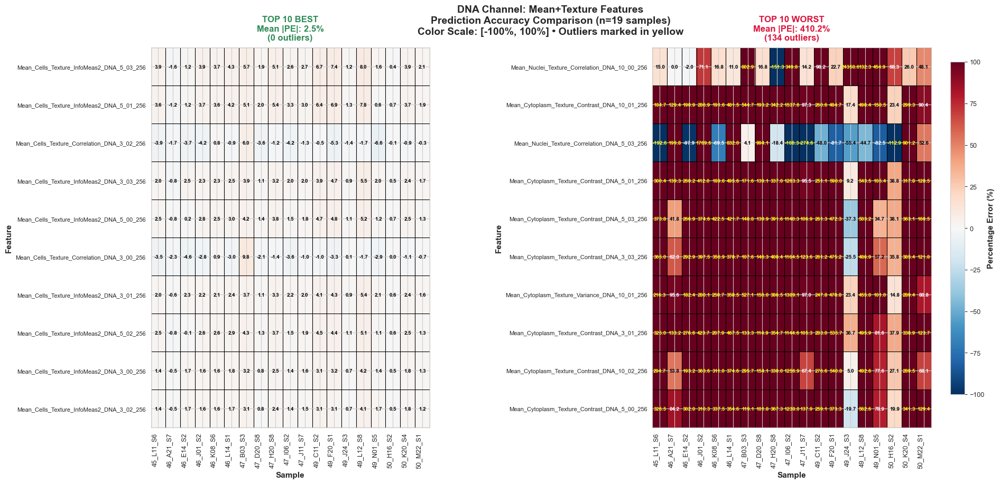

✓
Generating heatmap for ER... 

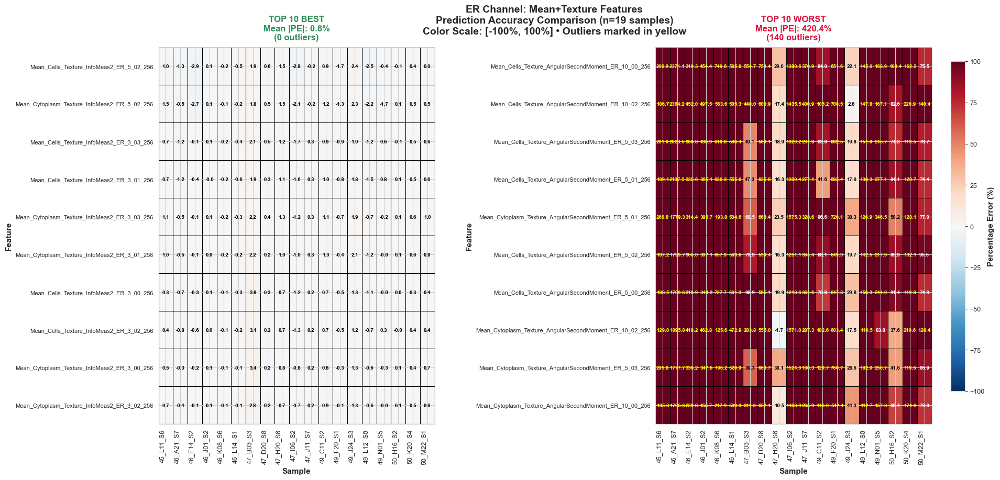

✓
Generating heatmap for RNA... 

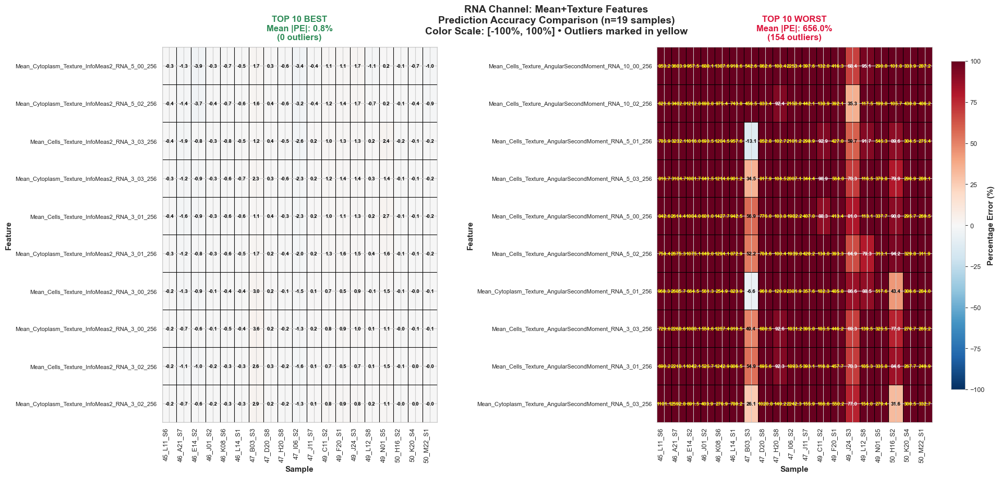

✓
Generating heatmap for AGP... 

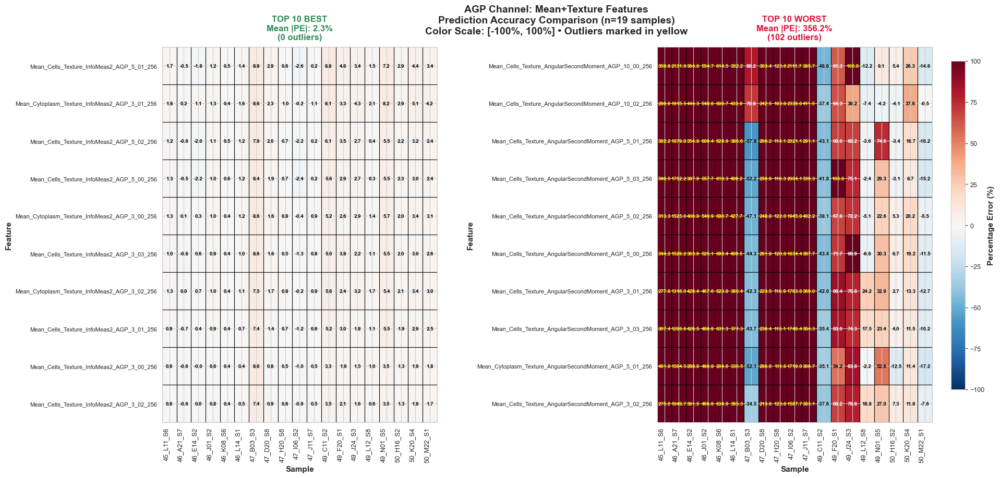

✓
Generating heatmap for Mito... 

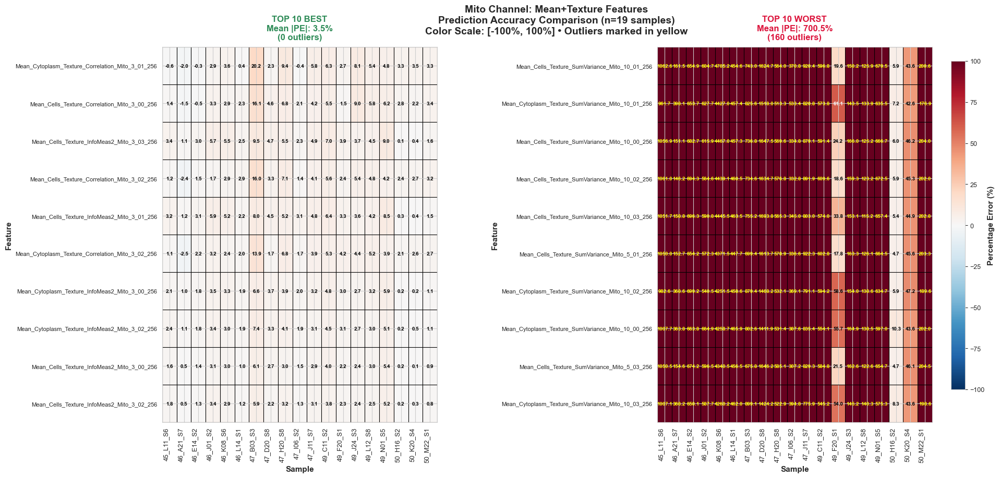

✓

CONSOLIDATED STATISTICS: ALL CHANNELS - TEXTURE FEATURES

Fixed Color Scale: [-100%, 100%]
Total PE measurements: 44,460
Total outliers (|PE| > 100%): 5787 (13.02%)

----------------------------------------------------------------------------------------------------
Channel  Features   Samples  Outliers   Best PE        Worst PE       Channel PE Range    
----------------------------------------------------------------------------------------------------
DNA      468        19       1462        1.8%-  3.6%  287.6%-1403.2%  -1254.6% to 24358.6%
ER       468        19       604         0.5%-  1.1%  386.1%- 484.9%  -2058.6% to  2371.1%
RNA      468        19       739         0.6%-  1.1%  596.5%- 748.3%  -254.1% to  8244.7%
AGP      468        19       706         1.5%-  3.1%  304.3%- 403.6%  -1726.4% to  2339.0%
Mito     468        19       2276        2.3%-  4.5%  687.5%- 720.4%  -2374.9% to  4798.9%
------------------------------------------------------------------------------------

In [21]:
"""
PART 3: Top 10 Best vs Worst Performing Features - PE Analysis by Channel
TEXTURE FEATURES: Mean + Texture (instead of Granularity)
Generates side-by-side annotated heatmaps formatted for PowerPoint presentations
One slide per biological channel (5 total)
COLOR SCALE: Fixed at [-100%, +100%] with outlier tracking
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

print("="*80)
print("PART 3: TOP 10 BEST vs WORST PERFORMING FEATURES - TEXTURE - ALL CHANNELS")
print("="*80)

# Define all biological channels
biological_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

# Prepare data (use same filtering as before)
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']
profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

print(f"\nGenerating PowerPoint-ready slides for {len(biological_channels)} channels...")
print(f"Format: Top 10 Best PE (left) | Top 10 Worst PE (right)")
print(f"Feature selection: Mean + Texture + Channel")

# ============================================================================
# FIXED COLOR SCALE DEFINITION
# ============================================================================
vmin_pe_global = -100.0
vmax_pe_global = 100.0
print(f"\nFixed color scale: [{vmin_pe_global:.1f}%, {vmax_pe_global:.1f}%]")
print("Values outside this range will be tracked as outliers.")

# ============================================================================
# PASS 1: Calculate PE for all channels and track outliers
# ============================================================================
print("\n" + "="*80)
print("PASS 1: Computing percentage errors and identifying outliers")
print("="*80)

all_pe_values = []
channel_data = {}
channel_statistics = {}
all_outliers = []  # Track all outliers across channels

for channel in biological_channels:
    print(f"Processing {channel}...", end=' ')
    
    # Select features: Mean + Texture + Channel
    channel_features = [f for f in filtered_features 
                       if 'Mean' in f and 'Texture' in f and channel in f]
    
    # Prepare feature matrices
    target_features_ch = target_data.set_index('Sample_ID')[channel_features]
    pred_features_ch = pred_data.set_index('Sample_ID')[channel_features]
    
    common_samples = sorted(target_features_ch.index.intersection(pred_features_ch.index))
    target_features_ch = target_features_ch.loc[common_samples]
    pred_features_ch = pred_features_ch.loc[common_samples]
    
    # Remove zero-variance features
    feature_stds = target_features_ch.std(axis=0)
    valid_features_ch = feature_stds[feature_stds > 0].index.tolist()
    
    target_features_ch = target_features_ch[valid_features_ch]
    pred_features_ch = pred_features_ch[valid_features_ch]
    
    # Calculate percentage error matrix
    pe_matrix = np.zeros((len(valid_features_ch), len(common_samples)))
    
    for i, sample in enumerate(common_samples):
        target_vals = target_features_ch.loc[sample, valid_features_ch].values
        pred_vals = pred_features_ch.loc[sample, valid_features_ch].values
        
        for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
            if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
                pe_matrix[j, i] = np.nan
            else:
                pe_matrix[j, i] = ((pred_val - target_val) / target_val) * 100
    
    # Store PE values for global statistics
    pe_valid = pe_matrix[~np.isnan(pe_matrix)]
    all_pe_values.append(pe_valid)
    
    # Identify outliers (|PE| > 100%)
    outlier_mask = np.abs(pe_matrix) > 100
    outlier_mask[np.isnan(pe_matrix)] = False  # Exclude NaN values
    
    outlier_indices = np.where(outlier_mask)
    channel_outliers = []
    
    for feat_idx, sample_idx in zip(outlier_indices[0], outlier_indices[1]):
        pe_value = pe_matrix[feat_idx, sample_idx]
        feature_name = valid_features_ch[feat_idx]
        sample_name = common_samples[sample_idx]
        
        outlier_record = {
            'Channel': channel,
            'Sample_ID': sample_name,
            'Feature': feature_name,
            'PE_Value': pe_value
        }
        channel_outliers.append(outlier_record)
        all_outliers.append(outlier_record)
    
    # Calculate mean absolute PE per feature to rank performance
    mean_abs_pe_per_feature = np.nanmean(np.abs(pe_matrix), axis=1)
    
    # Create feature ranking dataframe
    feature_ranking = pd.DataFrame({
        'Feature': valid_features_ch,
        'Mean_Abs_PE': mean_abs_pe_per_feature,
        'Index': range(len(valid_features_ch))
    })
    
    # Sort by performance
    feature_ranking = feature_ranking.sort_values('Mean_Abs_PE')
    
    # Select top 10 best and worst
    n_features = 10
    best_features = feature_ranking.head(n_features)
    worst_features = feature_ranking.tail(n_features)
    
    best_indices = best_features['Index'].values
    worst_indices = worst_features['Index'].values
    
    pe_matrix_best = pe_matrix[best_indices, :]
    pe_matrix_worst = pe_matrix[worst_indices, :]
    
    # Count outliers in best vs worst panels
    best_outliers = np.sum(np.abs(pe_matrix_best) > 100)
    worst_outliers = np.sum(np.abs(pe_matrix_worst) > 100)
    
    # Store statistics for consolidated reporting
    channel_statistics[channel] = {
        'total_features': len(channel_features),
        'valid_features': len(valid_features_ch),
        'n_samples': len(common_samples),
        'best_pe_min': best_features['Mean_Abs_PE'].min(),
        'best_pe_max': best_features['Mean_Abs_PE'].max(),
        'worst_pe_min': worst_features['Mean_Abs_PE'].min(),
        'worst_pe_max': worst_features['Mean_Abs_PE'].max(),
        'best_panel_mean_pe': np.nanmean(np.abs(pe_matrix_best)),
        'worst_panel_mean_pe': np.nanmean(np.abs(pe_matrix_worst)),
        'channel_pe_min': np.nanmin(pe_valid),
        'channel_pe_max': np.nanmax(pe_valid),
        'channel_pe_mean': np.nanmean(np.abs(pe_valid)),
        'n_outliers': len(channel_outliers),
        'best_panel_outliers': best_outliers,
        'worst_panel_outliers': worst_outliers,
        'outliers': channel_outliers
    }
    
    # Store data for Pass 2
    channel_data[channel] = {
        'pe_matrix': pe_matrix,
        'valid_features_ch': valid_features_ch,
        'common_samples': common_samples,
        'feature_ranking': feature_ranking,
        'best_features': best_features,
        'worst_features': worst_features,
        'best_indices': best_indices,
        'worst_indices': worst_indices
    }
    
    print(f"✓ ({len(valid_features_ch)} features, {len(common_samples)} samples, {len(channel_outliers)} outliers)")

# Global statistics
all_pe_combined = np.concatenate(all_pe_values)
total_outliers = len(all_outliers)

print(f"\n{'='*80}")
print(f"OUTLIER SUMMARY:")
print(f"  Total outliers (|PE| > 100%): {total_outliers}")
print(f"  Total PE measurements: {len(all_pe_combined):,}")
print(f"  Outlier percentage: {100 * total_outliers / len(all_pe_combined):.2f}%")
print(f"{'='*80}")

# ============================================================================
# PASS 2: Generate heatmaps using fixed global scale
# ============================================================================
print("\n" + "="*80)
print("PASS 2: Generating heatmaps with fixed color scale [-100%, +100%]")
print("="*80)

for channel in biological_channels:
    print(f"Generating heatmap for {channel}...", end=' ')
    
    # Retrieve pre-computed data
    pe_matrix = channel_data[channel]['pe_matrix']
    valid_features_ch = channel_data[channel]['valid_features_ch']
    common_samples = channel_data[channel]['common_samples']
    best_features = channel_data[channel]['best_features']
    worst_features = channel_data[channel]['worst_features']
    best_indices = channel_data[channel]['best_indices']
    worst_indices = channel_data[channel]['worst_indices']
    
    n_features = 10
    
    # Extract PE submatrices
    pe_matrix_best = pe_matrix[best_indices, :]
    pe_matrix_worst = pe_matrix[worst_indices, :]
    
    best_feature_names = best_features['Feature'].values
    worst_feature_names = worst_features['Feature'].values
    
    # =========================================================================
    # Create side-by-side heatmap figure with proper spacing
    # =========================================================================
    
    fig_width = 18  # Increased width to prevent overlap
    fig_height = 9
    
    fig, (ax_best, ax_worst) = plt.subplots(1, 2, figsize=(fig_width, fig_height))
    
    # ========================== LEFT PANEL: TOP 10 BEST ==========================
    im_best = ax_best.imshow(pe_matrix_best,
                             aspect='auto',
                             cmap='RdBu_r',
                             vmin=vmin_pe_global,
                             vmax=vmax_pe_global,
                             interpolation='nearest')
    
    # Annotate cells
    for i in range(n_features):
        for j in range(len(common_samples)):
            value = pe_matrix_best[i, j]
            if not np.isnan(value):
                # Mark outliers with special formatting
                if abs(value) > 100:
                    text_color = 'yellow'
                    text_weight = 'bold'
                else:
                    text_color = 'white' if abs(value) > abs(vmax_pe_global) * 0.6 else 'black'
                    text_weight = 'bold'
                
                ax_best.text(j, i, f'{value:.1f}',
                           ha='center', va='center',
                           fontsize=7, color=text_color,
                           fontweight=text_weight)
    
    # X-axis
    ax_best.set_xlim(-0.5, len(common_samples) - 0.5)
    ax_best.set_xticks(range(len(common_samples)))
    ax_best.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=9)
    ax_best.set_xlabel('Sample', fontsize=11, fontweight='bold')
    
    # Y-axis: Simplify feature names for readability
    simplified_names_best = list(best_feature_names)
    ax_best.set_ylim(-0.5, n_features - 0.5)
    ax_best.set_yticks(range(n_features))
    ax_best.set_yticklabels(simplified_names_best, fontsize=8)
    ax_best.set_ylabel('Feature', fontsize=11, fontweight='bold')
    
    # Title
    mean_pe_best = np.nanmean(np.abs(pe_matrix_best))
    n_outliers_best = channel_statistics[channel]['best_panel_outliers']
    ax_best.set_title(f'TOP 10 BEST\nMean |PE|: {mean_pe_best:.1f}%\n({n_outliers_best} outliers)',
                     fontsize=12, fontweight='bold', pad=10,
                     color='#2E8B57')
    
    # Grid
    ax_best.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
    ax_best.set_yticks(np.arange(n_features + 1) - 0.5, minor=True)
    ax_best.grid(which='minor', color='black', linestyle='-', linewidth=0.8)
    ax_best.tick_params(which='minor', size=0)
    
    # ========================== RIGHT PANEL: TOP 10 WORST ==========================
    im_worst = ax_worst.imshow(pe_matrix_worst,
                               aspect='auto',
                               cmap='RdBu_r',
                               vmin=vmin_pe_global,
                               vmax=vmax_pe_global,
                               interpolation='nearest')
    
    # Annotate cells
    for i in range(n_features):
        for j in range(len(common_samples)):
            value = pe_matrix_worst[i, j]
            if not np.isnan(value):
                # Mark outliers with special formatting
                if abs(value) > 100:
                    text_color = 'yellow'
                    text_weight = 'bold'
                else:
                    text_color = 'white' if abs(value) > abs(vmax_pe_global) * 0.6 else 'black'
                    text_weight = 'bold'
                
                ax_worst.text(j, i, f'{value:.1f}',
                            ha='center', va='center',
                            fontsize=7, color=text_color,
                            fontweight=text_weight)
    
    # X-axis
    ax_worst.set_xlim(-0.5, len(common_samples) - 0.5)
    ax_worst.set_xticks(range(len(common_samples)))
    ax_worst.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=9)
    ax_worst.set_xlabel('Sample', fontsize=11, fontweight='bold')
    
    # Y-axis: Simplify feature names for readability
    simplified_names_worst = list(worst_feature_names)
    ax_worst.set_ylim(-0.5, n_features - 0.5)
    ax_worst.set_yticks(range(n_features))
    ax_worst.set_yticklabels(simplified_names_worst, fontsize=8)
    ax_worst.set_ylabel('Feature', fontsize=11, fontweight='bold')
    
    # Title
    mean_pe_worst = np.nanmean(np.abs(pe_matrix_worst))
    n_outliers_worst = channel_statistics[channel]['worst_panel_outliers']
    ax_worst.set_title(f'TOP 10 WORST\nMean |PE|: {mean_pe_worst:.1f}%\n({n_outliers_worst} outliers)',
                      fontsize=12, fontweight='bold', pad=10,
                      color='#DC143C')
    
    # Grid
    ax_worst.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
    ax_worst.set_yticks(np.arange(n_features + 1) - 0.5, minor=True)
    ax_worst.grid(which='minor', color='black', linestyle='-', linewidth=0.8)
    ax_worst.tick_params(which='minor', size=0)
    
    # ========================== SHARED COLORBAR ==========================
    # Adjusted spacing to prevent overlap
    fig.subplots_adjust(left=0.08, right=0.90, wspace=0.80, top=0.88, bottom=0.08)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    cbar = fig.colorbar(im_worst, cax=cbar_ax)
    cbar.set_label('Percentage Error (%)', fontsize=11, fontweight='bold')
    cbar.ax.tick_params(labelsize=9)
    
    # ========================== OVERALL TITLE ==========================
    fig.suptitle(f'{channel} Channel: Mean+Texture Features\n'
                 f'Prediction Accuracy Comparison (n={len(common_samples)} samples)\n'
                 f'Color Scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%] • Outliers marked in yellow',
                 fontsize=14, fontweight='bold', y=0.97)
    
    # Save
    output_file = OUTPUT_DIR / f'pe_comparison_best_worst_{channel}_texture_ppt_fixed100.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    
    print(f"✓")
    
    # Save detailed feature lists
    feature_list_file = OUTPUT_DIR / f'feature_ranking_{channel}_texture.csv'
    channel_data[channel]['feature_ranking'].to_csv(feature_list_file, index=False)

# ============================================================================
# CONSOLIDATED STATISTICS SUMMARY
# ============================================================================
print("\n" + "="*80)
print("CONSOLIDATED STATISTICS: ALL CHANNELS - TEXTURE FEATURES")
print("="*80)

print(f"\nFixed Color Scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%]")
print(f"Total PE measurements: {len(all_pe_combined):,}")
print(f"Total outliers (|PE| > 100%): {total_outliers} ({100 * total_outliers / len(all_pe_combined):.2f}%)\n")

print("-" * 100)
print(f"{'Channel':<8} {'Features':<10} {'Samples':<8} {'Outliers':<10} {'Best PE':<14} {'Worst PE':<14} {'Channel PE Range':<20}")
print("-" * 100)

for channel in biological_channels:
    stats = channel_statistics[channel]
    print(f"{channel:<8} "
          f"{stats['valid_features']:<10} "
          f"{stats['n_samples']:<8} "
          f"{stats['n_outliers']:<10} "
          f"{stats['best_pe_min']:>4.1f}%-{stats['best_pe_max']:>5.1f}%  "
          f"{stats['worst_pe_min']:>4.1f}%-{stats['worst_pe_max']:>6.1f}%  "
          f"{stats['channel_pe_min']:>6.1f}% to {stats['channel_pe_max']:>7.1f}%")

print("-" * 100)

# Calculate aggregate statistics
all_best_pe = [channel_statistics[ch]['best_pe_min'] for ch in biological_channels] + \
              [channel_statistics[ch]['best_pe_max'] for ch in biological_channels]
all_worst_pe = [channel_statistics[ch]['worst_pe_min'] for ch in biological_channels] + \
               [channel_statistics[ch]['worst_pe_max'] for ch in biological_channels]
all_channel_pe_min = [channel_statistics[ch]['channel_pe_min'] for ch in biological_channels]
all_channel_pe_max = [channel_statistics[ch]['channel_pe_max'] for ch in biological_channels]

print(f"\nAGGREGATE STATISTICS ACROSS ALL CHANNELS:")
print(f"  • Best-performing features (top 10 per channel):")
print(f"      Mean |PE| range: {min(all_best_pe):.2f}% - {max(all_best_pe):.2f}%")
print(f"  • Worst-performing features (bottom 10 per channel):")
print(f"      Mean |PE| range: {min(all_worst_pe):.2f}% - {max(all_worst_pe):.2f}%")
print(f"  • Full PE distribution (all features, all samples):")
print(f"      Minimum PE: {min(all_channel_pe_min):.1f}%")
print(f"      Maximum PE: {max(all_channel_pe_max):.1f}%")
print(f"      Mean |PE|: {np.nanmean(np.abs(all_pe_combined)):.2f}%")
print(f"      Median |PE|: {np.nanmedian(np.abs(all_pe_combined)):.2f}%")

# ============================================================================
# DETAILED OUTLIER REPORT
# ============================================================================
print("\n" + "="*80)
print("DETAILED OUTLIER REPORT (|PE| > 100%) - TEXTURE FEATURES")
print("="*80)

if total_outliers > 0:
    # Convert to DataFrame for easier analysis
    outliers_df = pd.DataFrame(all_outliers)
    
    # Sort by absolute PE value (descending)
    outliers_df['Abs_PE'] = outliers_df['PE_Value'].abs()
    outliers_df = outliers_df.sort_values('Abs_PE', ascending=False)
    
    print(f"\nTotal outliers: {total_outliers}")
    print(f"\nBreakdown by channel:")
    for channel in biological_channels:
        n_channel_outliers = len(outliers_df[outliers_df['Channel'] == channel])
        print(f"  {channel}: {n_channel_outliers} outliers")
    
    print(f"\n{'='*100}")
    print(f"{'Rank':<6} {'Channel':<8} {'Sample ID':<20} {'Feature (truncated)':<35} {'PE Value':<12}")
    print(f"{'='*100}")
    
    for idx, row in outliers_df.iterrows():
        rank = outliers_df.index.get_loc(idx) + 1
        feature_truncated = row['Feature'][:35] + '...' if len(row['Feature']) > 35 else row['Feature']
        print(f"{rank:<6} {row['Channel']:<8} {row['Sample_ID']:<20} {feature_truncated:<35} {row['PE_Value']:>10.1f}%")
        
        # Limit display to first 50 outliers for readability
        if rank >= 50:
            remaining = len(outliers_df) - 50
            if remaining > 0:
                print(f"\n... and {remaining} additional outliers (see CSV for complete list)")
            break
    
    print(f"{'='*100}")
    
    # Save complete outlier list to CSV
    outlier_file = OUTPUT_DIR / 'outliers_complete_list_texture.csv'
    outliers_df[['Channel', 'Sample_ID', 'Feature', 'PE_Value', 'Abs_PE']].to_csv(
        outlier_file, index=False
    )
    print(f"\n✓ Complete outlier list saved: {outlier_file}")
    
    # Summary statistics on outliers
    print(f"\nOutlier statistics:")
    print(f"  • Minimum outlier PE: {outliers_df['PE_Value'].min():.1f}%")
    print(f"  • Maximum outlier PE: {outliers_df['PE_Value'].max():.1f}%")
    print(f"  • Mean outlier |PE|: {outliers_df['Abs_PE'].mean():.1f}%")
    print(f"  • Median outlier |PE|: {outliers_df['Abs_PE'].median():.1f}%")
    
else:
    print("\nNo outliers detected (all |PE| values ≤ 100%)")

print("\n" + "="*80)
print("OUTPUT FILES SUMMARY - TEXTURE FEATURES")
print("="*80)
print(f"Generated {len(biological_channels)} PowerPoint-ready slides (PNG format)")
print(f"Generated {len(biological_channels)} feature ranking files (CSV format)")
if total_outliers > 0:
    print(f"Generated 1 complete outlier list (CSV format)")
print(f"\nSlide specifications:")
print(f"  • Aspect ratio: 16:9 (PowerPoint optimized)")
print(f"  • Resolution: 300 DPI")
print(f"  • Layout: Side-by-side comparison (Best vs Worst)")
print(f"  • Panel spacing: Optimized to prevent label overlap (wspace=0.45)")
print(f"  • Annotations: All cells labeled with PE values")
print(f"  • Color scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%] (fixed across all channels)")
print(f"  • Outlier marking: Yellow text for |PE| > 100%")
print("="*80)

now further exploring the subcategories of mean texture

In [26]:
"""
Extract and display the 50 worst-performing Mean+Texture features
Based on mean absolute percentage error across all samples
"""

import numpy as np
import pandas as pd

print("="*80)
print("BOTTOM 50 WORST PERFORMING TEXTURE FEATURES")
print("="*80)

# Define all biological channels
biological_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

# Prepare data
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']
profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

# Select all texture features
texture_features = [f for f in filtered_features if 'Mean' in f and 'Texture' in f]

print(f"\nTotal Mean+Texture features: {len(texture_features)}")

# Prepare feature matrices
target_features = target_data.set_index('Sample_ID')[texture_features]
pred_features = pred_data.set_index('Sample_ID')[texture_features]

common_samples = sorted(target_features.index.intersection(pred_features.index))
target_features = target_features.loc[common_samples]
pred_features = pred_features.loc[common_samples]

# Remove zero-variance features
feature_stds = target_features.std(axis=0)
valid_features = feature_stds[feature_stds > 0].index.tolist()

target_features = target_features[valid_features]
pred_features = pred_features[valid_features]

print(f"Valid features (non-zero variance): {len(valid_features)}")
print(f"Samples: {len(common_samples)}")

# Calculate percentage error matrix
pe_matrix = np.zeros((len(valid_features), len(common_samples)))

for i, sample in enumerate(common_samples):
    target_vals = target_features.loc[sample, valid_features].values
    pred_vals = pred_features.loc[sample, valid_features].values
    
    for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
        if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
            pe_matrix[j, i] = np.nan
        else:
            pe_matrix[j, i] = ((pred_val - target_val) / target_val) * 100

# Calculate mean absolute PE per feature
mean_abs_pe_per_feature = np.nanmean(np.abs(pe_matrix), axis=1)

# Create ranking dataframe
feature_ranking = pd.DataFrame({
    'Feature': valid_features,
    'Mean_Abs_PE': mean_abs_pe_per_feature
})

# Sort by worst performance (highest mean |PE|)
feature_ranking = feature_ranking.sort_values('Mean_Abs_PE', ascending=False)

# Extract bottom 50
bottom_50 = feature_ranking.head(50)

# Display results
print("\n" + "="*80)
print("BOTTOM 50 WORST PERFORMING FEATURES (Highest Mean |PE|)")
print("="*80)
print(f"\n{'Rank':<6} {'Mean |PE|':<12} {'Feature Name':<80}")
print("-"*100)

for idx, row in bottom_50.iterrows():
    rank = bottom_50.index.get_loc(idx) + 1
    print(f"{rank:<6} {row['Mean_Abs_PE']:>9.2f}%   {row['Feature']}")

print("-"*100)

# Summary statistics on bottom 50
print(f"\nBottom 50 Statistics:")
print(f"  • Mean |PE| range: {bottom_50['Mean_Abs_PE'].min():.2f}% - {bottom_50['Mean_Abs_PE'].max():.2f}%")
print(f"  • Median Mean |PE|: {bottom_50['Mean_Abs_PE'].median():.2f}%")

# Channel breakdown
print(f"\nChannel Distribution in Bottom 50:")
for channel in biological_channels:
    count = sum(1 for f in bottom_50['Feature'] if channel in f)
    percentage = 100 * count / 50
    print(f"  • {channel}: {count} features ({percentage:.1f}%)")

# Save to CSV
output_file = OUTPUT_DIR / 'bottom_50_worst_texture_features.csv'
bottom_50.to_csv(output_file, index=False)
print(f"\n✓ Results saved: {output_file}")

print("="*80)

BOTTOM 50 WORST PERFORMING TEXTURE FEATURES

Total Mean+Texture features: 2340
Valid features (non-zero variance): 2340
Samples: 19

BOTTOM 50 WORST PERFORMING FEATURES (Highest Mean |PE|)

Rank   Mean |PE|    Feature Name                                                                    
----------------------------------------------------------------------------------------------------
1        1403.15%   Mean_Nuclei_Texture_Correlation_DNA_10_00_256
2         748.33%   Mean_Cells_Texture_AngularSecondMoment_RNA_10_00_256
3         720.45%   Mean_Cells_Texture_SumVariance_Mito_10_01_256
4         711.12%   Mean_Cytoplasm_Texture_SumVariance_Mito_10_01_256
5         708.12%   Mean_Cells_Texture_AngularSecondMoment_RNA_10_02_256
6         706.75%   Mean_Cells_Texture_SumVariance_Mito_10_00_256
7         703.84%   Mean_Cells_Texture_SumVariance_Mito_10_02_256
8         702.90%   Mean_Cells_Texture_SumVariance_Mito_10_03_256
9         696.18%   Mean_Cells_Texture_SumVariance_Mito_5_01_2

In [27]:
import re

print("="*80)
print("TEXTURE METHODS EXTRACTION")
print("="*80)

# Select all texture features
texture_features = [f for f in filtered_features if 'Mean' in f and 'Texture' in f]

print(f"\nTotal Mean+Texture features: {len(texture_features)}")

# Extract unique methods
methods = set()

for feature in texture_features:
    # Pattern: Mean_[Compartment]_Texture_[METHOD]_[Channel]_[Scale]_[Angle]_[GrayLevel]
    # Extract text between "Texture_" and the next "_"
    match = re.search(r'Texture_([A-Za-z]+)_', feature)
    if match:
        methods.add(match.group(1))

# Sort alphabetically
methods_sorted = sorted(methods)

print(f"\nTotal unique texture methods: {len(methods_sorted)}")
print("\n" + "="*80)
print("COMPLETE METHOD LIST")
print("="*80)

for i, method in enumerate(methods_sorted, 1):
    # Count features using this method
    count = sum(1 for f in texture_features if f'Texture_{method}_' in f)
    print(f"{i:2d}. {method:<30s} ({count:4d} features)")

print("="*80)


TEXTURE METHODS EXTRACTION

Total Mean+Texture features: 2340

Total unique texture methods: 11

COMPLETE METHOD LIST
 1. AngularSecondMoment            ( 180 features)
 2. Contrast                       ( 180 features)
 3. Correlation                    ( 180 features)
 4. DifferenceEntropy              ( 180 features)
 5. DifferenceVariance             ( 180 features)
 6. Entropy                        ( 180 features)
 7. InverseDifferenceMoment        ( 180 features)
 8. SumAverage                     ( 180 features)
 9. SumEntropy                     ( 180 features)
10. SumVariance                    ( 180 features)
11. Variance                       ( 180 features)


TEXTURE METHOD PERFORMANCE ANALYSIS

Fixed color scale: [-100.0%, 100.0%]
Total Mean+Texture features: 2340
Total unique texture methods: 11

PHASE 1: METHOD-LEVEL PERFORMANCE SUMMARY

Processing method: AngularSecondMoment... ✓ (Mean |PE|: 202.3%, Outliers: 33.3%)

Processing method: Contrast... ✓ (Mean |PE|: 148.6%, Outliers: 29.4%)

Processing method: Correlation... ✓ (Mean |PE|: 30.0%, Outliers: 2.5%)

Processing method: DifferenceEntropy... ✓ (Mean |PE|: 14.2%, Outliers: 0.3%)

Processing method: DifferenceVariance... ✓ (Mean |PE|: 72.5%, Outliers: 14.2%)

Processing method: Entropy... ✓ (Mean |PE|: 11.9%, Outliers: 0.0%)

Processing method: InverseDifferenceMoment... ✓ (Mean |PE|: 29.1%, Outliers: 1.5%)

Processing method: SumAverage... ✓ (Mean |PE|: 65.9%, Outliers: 20.1%)

Processing method: SumEntropy... ✓ (Mean |PE|: 11.7%, Outliers: 0.0%)

Processing method: SumVariance... ✓ (Mean |PE|: 193.4%, Outliers: 33.0%)

Processing method: Variance... ✓ (Mean |PE|: 185.7%, Outliers: 

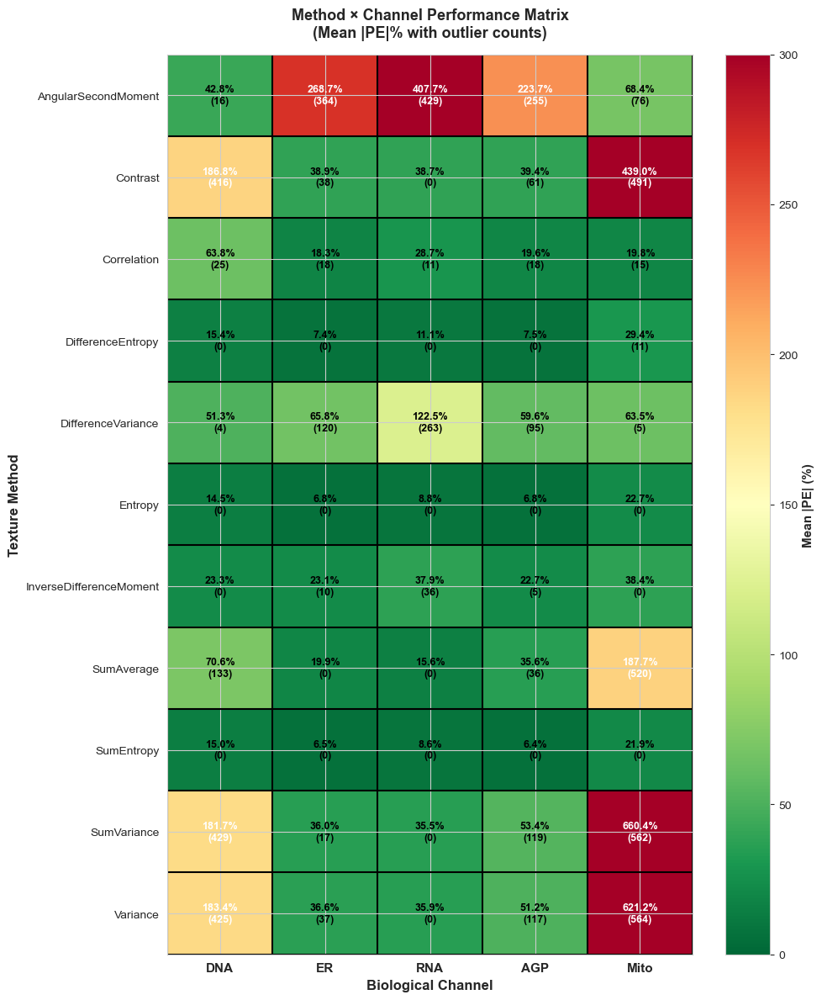

✓ Method × Channel heatmap saved: /Users/diya.srivastava/Desktop/cellprofiler/cellprofiler_outputs/28072025_self_generated_illum/analysis/processed_data/image_level_revised/method_channel_interaction_heatmap.png

PHASE 2 SUMMARY: BEST/WORST CHANNEL PER METHOD

Method                    Best Channel    Worst Channel   Spread       Status              
------------------------------------------------------------------------------------------
AngularSecondMoment       DNA    (  42.8%)   RNA    ( 407.7%)      365.0 pp   UNIFORMLY POOR      
Contrast                  RNA    (  38.7%)   Mito   ( 439.0%)      400.3 pp   UNIFORMLY POOR      
Correlation               ER     (  18.3%)   DNA    (  63.8%)       45.5 pp   MODERATE VARIATION  
DifferenceEntropy         ER     (   7.4%)   Mito   (  29.4%)       22.0 pp   STABLE              
DifferenceVariance        DNA    (  51.3%)   RNA    ( 122.5%)       71.2 pp   MODERATE VARIATION  
Entropy                   AGP    (   6.8%)   Mito   (  22.7%)

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re

print("="*80)
print("TEXTURE METHOD PERFORMANCE ANALYSIS")
print("="*80)

# Define all biological channels
biological_channels = ['DNA', 'ER', 'RNA', 'AGP', 'Mito']

# Prepare data
profiles_analysis = profiles.copy()
profiles_analysis = profiles_analysis.loc[:, ~profiles_analysis.columns.duplicated()]
profiles_analysis = profiles_analysis[profiles_analysis['Metadata_Plate'] != 'BR00118048']
profiles_analysis['Sample_ID'] = (
    profiles_analysis['Metadata_Plate'].str[-2:] + '_' +
    profiles_analysis['Metadata_Well'] + '_S' +
    profiles_analysis['Metadata_Site'].astype(str)
)

# Separate target and predicted
target_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'target'].copy()
pred_data = profiles_analysis[profiles_analysis['Metadata_ImageType'] == 'test_pred'].copy()

# Fixed color scale
vmin_pe_global = -100.0
vmax_pe_global = 100.0
print(f"\nFixed color scale: [{vmin_pe_global:.1f}%, {vmax_pe_global:.1f}%]")

# Extract all texture features
texture_features = [f for f in filtered_features if 'Mean' in f and 'Texture' in f]
print(f"Total Mean+Texture features: {len(texture_features)}")

# Extract unique methods
methods = set()
for feature in texture_features:
    match = re.search(r'Texture_([A-Za-z]+)_', feature)
    if match:
        methods.add(match.group(1))

methods_sorted = sorted(methods)
print(f"Total unique texture methods: {len(methods_sorted)}")

# ============================================================================
# PHASE 1: METHOD-LEVEL PERFORMANCE SUMMARY
# ============================================================================
print("\n" + "="*80)
print("PHASE 1: METHOD-LEVEL PERFORMANCE SUMMARY")
print("="*80)

method_summary = []

for method in methods_sorted:
    print(f"\nProcessing method: {method}...", end=' ')
    
    # Select features for this method
    method_features = [f for f in texture_features if f'Texture_{method}_' in f]
    
    # Prepare feature matrices
    target_features_method = target_data.set_index('Sample_ID')[method_features]
    pred_features_method = pred_data.set_index('Sample_ID')[method_features]
    
    common_samples = sorted(target_features_method.index.intersection(pred_features_method.index))
    target_features_method = target_features_method.loc[common_samples]
    pred_features_method = pred_features_method.loc[common_samples]
    
    # Remove zero-variance features
    feature_stds = target_features_method.std(axis=0)
    valid_features = feature_stds[feature_stds > 0].index.tolist()
    
    target_features_method = target_features_method[valid_features]
    pred_features_method = pred_features_method[valid_features]
    
    # Calculate PE matrix
    pe_matrix = np.zeros((len(valid_features), len(common_samples)))
    
    for i, sample in enumerate(common_samples):
        target_vals = target_features_method.loc[sample, valid_features].values
        pred_vals = pred_features_method.loc[sample, valid_features].values
        
        for j, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
            if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
                pe_matrix[j, i] = np.nan
            else:
                pe_matrix[j, i] = ((pred_val - target_val) / target_val) * 100
    
    # Calculate statistics
    pe_valid = pe_matrix[~np.isnan(pe_matrix)]
    n_measurements = len(pe_valid)
    n_outliers = np.sum(np.abs(pe_valid) > 100)
    outlier_rate = 100 * n_outliers / n_measurements if n_measurements > 0 else 0
    
    mean_abs_pe = np.nanmean(np.abs(pe_matrix))
    median_abs_pe = np.nanmedian(np.abs(pe_matrix))
    std_abs_pe = np.nanstd(np.abs(pe_matrix))
    min_pe = np.nanmin(pe_matrix)
    max_pe = np.nanmax(pe_matrix)
    
    method_summary.append({
        'Method': method,
        'N_Features': len(valid_features),
        'N_Measurements': n_measurements,
        'Mean_Abs_PE': mean_abs_pe,
        'Median_Abs_PE': median_abs_pe,
        'Std_Abs_PE': std_abs_pe,
        'Min_PE': min_pe,
        'Max_PE': max_pe,
        'N_Outliers': n_outliers,
        'Outlier_Rate': outlier_rate
    })
    
    print(f"✓ (Mean |PE|: {mean_abs_pe:.1f}%, Outliers: {outlier_rate:.1f}%)")

# Convert to DataFrame and sort by mean |PE|
method_summary_df = pd.DataFrame(method_summary)
method_summary_df = method_summary_df.sort_values('Mean_Abs_PE')

# Display Phase 1 results
print("\n" + "="*80)
print("PHASE 1 RESULTS: METHOD PERFORMANCE RANKING")
print("="*80)

print(f"\n{'Rank':<6} {'Method':<25} {'Features':<10} {'Mean |PE|':<12} {'Median |PE|':<13} {'Outlier %':<12} {'PE Range':<25}")
print("-"*105)

for idx, row in method_summary_df.iterrows():
    rank = method_summary_df.index.get_loc(idx) + 1
    print(f"{rank:<6} {row['Method']:<25} {row['N_Features']:<10} "
          f"{row['Mean_Abs_PE']:>9.2f}%   {row['Median_Abs_PE']:>10.2f}%   "
          f"{row['Outlier_Rate']:>9.1f}%   "
          f"{row['Min_PE']:>7.1f}% to {row['Max_PE']:>9.1f}%")

print("-"*105)

# Save Phase 1 results
phase1_file = OUTPUT_DIR / 'texture_method_performance_summary.csv'
method_summary_df.to_csv(phase1_file, index=False)
print(f"\n✓ Phase 1 results saved: {phase1_file}")

# ============================================================================
# PHASE 2: METHOD × CHANNEL INTERACTION ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("PHASE 2: METHOD × CHANNEL INTERACTION ANALYSIS")
print("="*80)

# Create matrix to store mean |PE| for each method-channel combination
method_channel_matrix = np.zeros((len(methods_sorted), len(biological_channels)))
method_channel_outliers = np.zeros((len(methods_sorted), len(biological_channels)))

# Store detailed data for heatmap generation
method_channel_data = {}

for i, method in enumerate(methods_sorted):
    method_channel_data[method] = {}
    
    for j, channel in enumerate(biological_channels):
        # Select features for this method-channel combination
        method_channel_features = [f for f in texture_features 
                                   if f'Texture_{method}_' in f and f'_{channel}' in f]
        
        if len(method_channel_features) == 0:
            method_channel_matrix[i, j] = np.nan
            method_channel_outliers[i, j] = 0
            continue
        
        # Prepare feature matrices
        target_features = target_data.set_index('Sample_ID')[method_channel_features]
        pred_features = pred_data.set_index('Sample_ID')[method_channel_features]
        
        common_samples = sorted(target_features.index.intersection(pred_features.index))
        target_features = target_features.loc[common_samples]
        pred_features = pred_features.loc[common_samples]
        
        # Remove zero-variance features
        feature_stds = target_features.std(axis=0)
        valid_features = feature_stds[feature_stds > 0].index.tolist()
        
        target_features = target_features[valid_features]
        pred_features = pred_features[valid_features]
        
        # Calculate PE matrix
        pe_matrix = np.zeros((len(valid_features), len(common_samples)))
        
        for samp_idx, sample in enumerate(common_samples):
            target_vals = target_features.loc[sample, valid_features].values
            pred_vals = pred_features.loc[sample, valid_features].values
            
            for feat_idx, (target_val, pred_val) in enumerate(zip(target_vals, pred_vals)):
                if np.isnan(target_val) or np.isnan(pred_val) or target_val == 0:
                    pe_matrix[feat_idx, samp_idx] = np.nan
                else:
                    pe_matrix[feat_idx, samp_idx] = ((pred_val - target_val) / target_val) * 100
        
        # Calculate statistics
        pe_valid = pe_matrix[~np.isnan(pe_matrix)]
        mean_abs_pe = np.nanmean(np.abs(pe_matrix))
        n_outliers = np.sum(np.abs(pe_valid) > 100)
        
        method_channel_matrix[i, j] = mean_abs_pe
        method_channel_outliers[i, j] = n_outliers
        
        # Store data for potential heatmap generation
        method_channel_data[method][channel] = {
            'pe_matrix': pe_matrix,
            'valid_features': valid_features,
            'common_samples': common_samples,
            'mean_abs_pe': mean_abs_pe,
            'n_outliers': n_outliers
        }

print(f"\n✓ Computed {len(methods_sorted)} × {len(biological_channels)} method-channel combinations")

# ============================================================================
# PHASE 2 VISUALIZATION: Method × Channel Heatmap
# ============================================================================
print("\nGenerating Method × Channel interaction heatmap...")

fig, ax = plt.subplots(figsize=(10, 12))

# Create masked array for better NaN handling
masked_matrix = np.ma.masked_invalid(method_channel_matrix)

# Plot heatmap
im = ax.imshow(masked_matrix, aspect='auto', cmap='RdYlGn_r', 
               vmin=0, vmax=300, interpolation='nearest')

# Annotate cells with mean |PE| and outlier counts
for i in range(len(methods_sorted)):
    for j in range(len(biological_channels)):
        value = method_channel_matrix[i, j]
        n_outliers = int(method_channel_outliers[i, j])
        
        if not np.isnan(value):
            text_color = 'white' if value > 150 else 'black'
            ax.text(j, i, f'{value:.1f}%\n({n_outliers})',
                   ha='center', va='center',
                   fontsize=9, color=text_color, fontweight='bold')

# Axes configuration
ax.set_xticks(range(len(biological_channels)))
ax.set_xticklabels(biological_channels, fontsize=11, fontweight='bold')
ax.set_yticks(range(len(methods_sorted)))
ax.set_yticklabels(methods_sorted, fontsize=10)

ax.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
ax.set_ylabel('Texture Method', fontsize=12, fontweight='bold')
ax.set_title('Method × Channel Performance Matrix\n(Mean |PE|% with outlier counts)',
            fontsize=13, fontweight='bold', pad=15)

# Colorbar
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Mean |PE| (%)', fontsize=11, fontweight='bold')

# Grid
ax.set_xticks(np.arange(len(biological_channels) + 1) - 0.5, minor=True)
ax.set_yticks(np.arange(len(methods_sorted) + 1) - 0.5, minor=True)
ax.grid(which='minor', color='black', linestyle='-', linewidth=1.5)
ax.tick_params(which='minor', size=0)

plt.tight_layout()
phase2_heatmap = OUTPUT_DIR / 'method_channel_interaction_heatmap.png'
plt.savefig(phase2_heatmap, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"✓ Method × Channel heatmap saved: {phase2_heatmap}")

# ============================================================================
# PHASE 2 SUMMARY: Best/Worst Channel per Method
# ============================================================================
print("\n" + "="*80)
print("PHASE 2 SUMMARY: BEST/WORST CHANNEL PER METHOD")
print("="*80)

method_channel_summary = []

for i, method in enumerate(methods_sorted):
    method_row = method_channel_matrix[i, :]
    valid_channels = ~np.isnan(method_row)
    
    if np.sum(valid_channels) == 0:
        continue
    
    best_idx = np.nanargmin(method_row)
    worst_idx = np.nanargmax(method_row)
    
    best_channel = biological_channels[best_idx]
    worst_channel = biological_channels[worst_idx]
    best_pe = method_row[best_idx]
    worst_pe = method_row[worst_idx]
    spread = worst_pe - best_pe
    
    # Determine status
    if worst_pe > 200:
        status = "UNIFORMLY POOR"
    elif spread < 30:
        status = "STABLE"
    elif spread > 100:
        status = "CHANNEL-SELECTIVE"
    else:
        status = "MODERATE VARIATION"
    
    method_channel_summary.append({
        'Method': method,
        'Best_Channel': best_channel,
        'Best_PE': best_pe,
        'Worst_Channel': worst_channel,
        'Worst_PE': worst_pe,
        'Spread': spread,
        'Status': status
    })

method_channel_summary_df = pd.DataFrame(method_channel_summary)

print(f"\n{'Method':<25} {'Best Channel':<15} {'Worst Channel':<15} {'Spread':<12} {'Status':<20}")
print("-"*90)

for _, row in method_channel_summary_df.iterrows():
    print(f"{row['Method']:<25} "
          f"{row['Best_Channel']:<6} ({row['Best_PE']:>6.1f}%)   "
          f"{row['Worst_Channel']:<6} ({row['Worst_PE']:>6.1f}%)   "
          f"{row['Spread']:>8.1f} pp   "
          f"{row['Status']:<20}")

print("-"*90)

# Save Phase 2 summary
phase2_summary_file = OUTPUT_DIR / 'method_channel_summary.csv'
method_channel_summary_df.to_csv(phase2_summary_file, index=False)
print(f"\n✓ Phase 2 summary saved: {phase2_summary_file}")

# ============================================================================
# PHASE 3: FEATURE-LEVEL HEATMAPS (TOP/BOTTOM 10)
# ============================================================================
print("\n" + "="*80)
print("PHASE 3: GENERATING FEATURE-LEVEL HEATMAPS (TOP/BOTTOM 10)")
print("="*80)

# Generate heatmaps for all method-channel combinations
for method in methods_sorted:
    print(f"\n{'='*80}")
    print(f"METHOD: {method}")
    print(f"{'='*80}")
    
    for channel in biological_channels:
        if channel not in method_channel_data[method]:
            continue
        
        data = method_channel_data[method][channel]
        pe_matrix = data['pe_matrix']
        valid_features = data['valid_features']
        common_samples = data['common_samples']
        
        n_features = len(valid_features)
        
        if n_features < 10:
            print(f"  {channel}: Only {n_features} features (skipping - need ≥10)")
            continue
        
        print(f"  {channel}: Generating heatmap ({n_features} features)...", end=' ')
        
        # Calculate mean |PE| per feature
        mean_abs_pe_per_feature = np.nanmean(np.abs(pe_matrix), axis=1)
        
        # Create ranking
        feature_ranking = pd.DataFrame({
            'Feature': valid_features,
            'Mean_Abs_PE': mean_abs_pe_per_feature,
            'Index': range(n_features)
        })
        
        feature_ranking = feature_ranking.sort_values('Mean_Abs_PE')
        
        # Select top 10 best and bottom 10 worst
        n_display = 10
        best_features = feature_ranking.head(n_display)
        worst_features = feature_ranking.tail(n_display)
        
        best_indices = best_features['Index'].values
        worst_indices = worst_features['Index'].values
        
        pe_matrix_best = pe_matrix[best_indices, :]
        pe_matrix_worst = pe_matrix[worst_indices, :]
        
        best_feature_names = best_features['Feature'].values
        worst_feature_names = worst_features['Feature'].values
        
        # Count outliers
        best_outliers = np.sum(np.abs(pe_matrix_best) > 100)
        worst_outliers = np.sum(np.abs(pe_matrix_worst) > 100)
        
        # Create figure
        fig_width = 18
        fig_height = 10
        
        fig, (ax_best, ax_worst) = plt.subplots(1, 2, figsize=(fig_width, fig_height))
        
        # LEFT PANEL: TOP 50 BEST
        im_best = ax_best.imshow(pe_matrix_best,
                                 aspect='auto',
                                 cmap='RdBu_r',
                                 vmin=vmin_pe_global,
                                 vmax=vmax_pe_global,
                                 interpolation='nearest')
        
        # Annotate cells
        for i in range(n_display):
            for j in range(len(common_samples)):
                value = pe_matrix_best[i, j]
                if not np.isnan(value):
                    if abs(value) > 100:
                        text_color = 'yellow'
                    else:
                        text_color = 'white' if abs(value) > 60 else 'black'
                    
                    ax_best.text(j, i, f'{value:.0f}',
                               ha='center', va='center',
                               fontsize=7, color=text_color,
                               fontweight='bold')
        
        # X-axis
        ax_best.set_xlim(-0.5, len(common_samples) - 0.5)
        ax_best.set_xticks(range(len(common_samples)))
        ax_best.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=8)
        ax_best.set_xlabel('Sample', fontsize=10, fontweight='bold')
        
        # Y-axis: Truncate feature names
        truncated_best = [f[:60] + '...' if len(f) > 60 else f for f in best_feature_names]
        ax_best.set_ylim(-0.5, n_display - 0.5)
        ax_best.set_yticks(range(n_display))
        ax_best.set_yticklabels(truncated_best, fontsize=7)
        ax_best.set_ylabel('Feature', fontsize=10, fontweight='bold')
        
        # Title
        mean_pe_best = np.nanmean(np.abs(pe_matrix_best))
        ax_best.set_title(f'TOP 10 BEST\nMean |PE|: {mean_pe_best:.1f}%\n({best_outliers} outliers)',
                         fontsize=11, fontweight='bold', pad=10,
                         color='#2E8B57')
        
        # Grid
        ax_best.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
        ax_best.set_yticks(np.arange(n_display + 1) - 0.5, minor=True)
        ax_best.grid(which='minor', color='black', linestyle='-', linewidth=0.5)
        ax_best.tick_params(which='minor', size=0)
        
        # RIGHT PANEL: BOTTOM 10 WORST
        im_worst = ax_worst.imshow(pe_matrix_worst,
                                   aspect='auto',
                                   cmap='RdBu_r',
                                   vmin=vmin_pe_global,
                                   vmax=vmax_pe_global,
                                   interpolation='nearest')
        
        # Annotate cells
        for i in range(n_display):
            for j in range(len(common_samples)):
                value = pe_matrix_worst[i, j]
                if not np.isnan(value):
                    if abs(value) > 100:
                        text_color = 'yellow'
                    else:
                        text_color = 'white' if abs(value) > 60 else 'black'
                    
                    ax_worst.text(j, i, f'{value:.0f}',
                                ha='center', va='center',
                                fontsize=7, color=text_color,
                                fontweight='bold')
        
        # X-axis
        ax_worst.set_xlim(-0.5, len(common_samples) - 0.5)
        ax_worst.set_xticks(range(len(common_samples)))
        ax_worst.set_xticklabels(common_samples, rotation=90, ha='right', fontsize=8)
        ax_worst.set_xlabel('Sample', fontsize=10, fontweight='bold')
        
        # Y-axis
        truncated_worst = [f[:60] + '...' if len(f) > 60 else f for f in worst_feature_names]
        ax_worst.set_ylim(-0.5, n_display - 0.5)
        ax_worst.set_yticks(range(n_display))
        ax_worst.set_yticklabels(truncated_worst, fontsize=7)
        ax_worst.set_ylabel('Feature', fontsize=10, fontweight='bold')
        
        # Title
        mean_pe_worst = np.nanmean(np.abs(pe_matrix_worst))
        ax_worst.set_title(f'BOTTOM 10 WORST\nMean |PE|: {mean_pe_worst:.1f}%\n({worst_outliers} outliers)',
                          fontsize=11, fontweight='bold', pad=10,
                          color='#DC143C')
        
        # Grid
        ax_worst.set_xticks(np.arange(len(common_samples) + 1) - 0.5, minor=True)
        ax_worst.set_yticks(np.arange(n_display + 1) - 0.5, minor=True)
        ax_worst.grid(which='minor', color='black', linestyle='-', linewidth=0.5)
        ax_worst.tick_params(which='minor', size=0)
        
        # Colorbar
        fig.subplots_adjust(left=0.12, right=0.88, wspace=0.70, top=0.90, bottom=0.05)
        cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])
        cbar = fig.colorbar(im_worst, cax=cbar_ax)
        cbar.set_label('PE (%)', fontsize=10, fontweight='bold')
        cbar.ax.tick_params(labelsize=8)
        
        # Overall title
        fig.suptitle(f'{method} Method - {channel} Channel\n'
                     f'Top 10 Best vs Bottom 10 Worst Features (n={len(common_samples)} samples)\n'
                     f'Color Scale: [{vmin_pe_global:.0f}%, {vmax_pe_global:.0f}%]',
                     fontsize=12, fontweight='bold', y=0.97)
        
        # Save
        output_file = OUTPUT_DIR / f'method_{method}_channel_{channel}_top_bottom_10.png'
        plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
        plt.close()
        
        print(f"✓")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)
print(f"\nGenerated outputs:")
print(f"  • Phase 1: Method performance summary table (CSV)")
print(f"  • Phase 2: Method × Channel interaction heatmap (PNG)")
print(f"  • Phase 2: Best/worst channel summary per method (CSV)")
print(f"  • Phase 3: {len(methods_sorted) * len(biological_channels)} feature-level heatmaps (PNG)")
print(f"              (Top 50 best vs Bottom 10 worst per method-channel combination)")
print("="*80)

In [36]:
# ========================================================================
# OPTION C: VIOLIN PLOTS WITH SWARM OVERLAY
# ========================================================================
print(f"  Generating Option C (violin plots)...", end=' ')

# Create figure with two panels
fig, (ax_best, ax_worst) = plt.subplots(1, 2, figsize=(14, 6))

# LEFT PANEL: Best features
if len(df_best) > 0:
    # Prepare data for each channel (filter out empty arrays)
    violin_data_best = []
    valid_channels_best = []
    
    for channel in biological_channels:
        channel_data = df_best[df_best['Channel'] == channel]['Abs_PE'].values
        if len(channel_data) > 0:  # Only include channels with data
            violin_data_best.append(channel_data)
            valid_channels_best.append(channel)
    
    if len(violin_data_best) > 0:
        # Violin plot
        parts_best = ax_best.violinplot(violin_data_best,
                                        positions=range(1, len(valid_channels_best)+1),
                                        showmeans=True,
                                        showmedians=True,
                                        widths=0.7)
        
        # Color violins
        for pc in parts_best['bodies']:
            pc.set_facecolor('#90EE90')
            pc.set_alpha(0.6)
        
        # Overlay scatter points (subsample if too many)
        for i, channel in enumerate(valid_channels_best):
            channel_data = df_best[df_best['Channel'] == channel]['Abs_PE'].values
            if len(channel_data) > 50:
                channel_data = np.random.choice(channel_data, 50, replace=False)
            
            # Add jitter
            x_jitter = np.random.normal(i+1, 0.04, len(channel_data))
            ax_best.scatter(x_jitter, channel_data, alpha=0.4, s=20, 
                          color='darkgreen', edgecolors='black', linewidths=0.5)
        
        ax_best.set_xticks(range(1, len(valid_channels_best)+1))
        ax_best.set_xticklabels(valid_channels_best, fontsize=11, fontweight='bold')
        ax_best.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
        ax_best.set_ylabel('|PE| (%)', fontsize=12, fontweight='bold')
        ax_best.set_title(f'TOP 10 BEST Features\n(n={len(df_best)} measurements, {len(valid_channels_best)} channels)',
                         fontsize=12, fontweight='bold', color='#2E8B57')
        ax_best.axhline(100, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='|PE| = 100%')
        ax_best.grid(axis='y', alpha=0.3)
        ax_best.legend()
    else:
        ax_best.text(0.5, 0.5, 'No data available', ha='center', va='center',
                    transform=ax_best.transAxes, fontsize=12)

# RIGHT PANEL: Worst features
if len(df_worst) > 0:
    # Prepare data for each channel (filter out empty arrays)
    violin_data_worst = []
    valid_channels_worst = []
    
    for channel in biological_channels:
        channel_data = df_worst[df_worst['Channel'] == channel]['Abs_PE'].values
        if len(channel_data) > 0:  # Only include channels with data
            violin_data_worst.append(channel_data)
            valid_channels_worst.append(channel)
    
    if len(violin_data_worst) > 0:
        # Violin plot
        parts_worst = ax_worst.violinplot(violin_data_worst,
                                          positions=range(1, len(valid_channels_worst)+1),
                                          showmeans=True,
                                          showmedians=True,
                                          widths=0.7)
        
        # Color violins
        for pc in parts_worst['bodies']:
            pc.set_facecolor('#FFB6C6')
            pc.set_alpha(0.6)
        
        # Overlay scatter points (subsample if too many)
        for i, channel in enumerate(valid_channels_worst):
            channel_data = df_worst[df_worst['Channel'] == channel]['Abs_PE'].values
            if len(channel_data) > 50:
                channel_data = np.random.choice(channel_data, 50, replace=False)
            
            # Add jitter
            x_jitter = np.random.normal(i+1, 0.04, len(channel_data))
            ax_worst.scatter(x_jitter, channel_data, alpha=0.4, s=20, 
                           color='darkred', edgecolors='black', linewidths=0.5)
        
        ax_worst.set_xticks(range(1, len(valid_channels_worst)+1))
        ax_worst.set_xticklabels(valid_channels_worst, fontsize=11, fontweight='bold')
        ax_worst.set_xlabel('Biological Channel', fontsize=12, fontweight='bold')
        ax_worst.set_ylabel('|PE| (%)', fontsize=12, fontweight='bold')
        ax_worst.set_title(f'BOTTOM 10 WORST Features\n(n={len(df_worst)} measurements, {len(valid_channels_worst)} channels)',
                          fontsize=12, fontweight='bold', color='#DC143C')
        ax_worst.axhline(100, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='|PE| = 100%')
        ax_worst.grid(axis='y', alpha=0.3)
        ax_worst.legend()
    else:
        ax_worst.text(0.5, 0.5, 'No data available', ha='center', va='center',
                     transform=ax_worst.transAxes, fontsize=12)

plt.suptitle(f'{method} Method: Cross-Channel Performance Distribution (Violin)',
            fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save
output_file = OUTPUT_DIR / f'optionC_{method}_violinplots.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
plt.close()

print("✓")

  Generating Option C (violin plots)... ✓
